# Fitting line profiles with lorentzian and Gausian

In [1]:
import sys
sys.path.append('E:/solar flares/data/2017-09-06')
import use_nessi3 as un
import data_analysis as da
import numpy as np
import matplotlib.pyplot as plt
import use_nessi as un
import use_nessi2 as un2
import os
from importlib import reload
# from matplotlib import cm
# import matplotlib.cbook as cbook
# import matplotlib.colors as colors
# from scipy.interpolate import interp1d
import voigt_fit as vf

E:\solar flares/data/2017-09-06\use_nessi2.py:308: SyntaxWarning: invalid escape sequence '\s'
  summary = np.loadtxt('E:\solar flares\data\\2017-09-06\Harps\dates.txt', dtype=str)
E:\solar flares/data/2017-09-06\use_nessi2.py:541: SyntaxWarning: invalid escape sequence '\{'
  fig.savefig(f'D:\solar flares\data\plots\{figname}.png')
E:\solar flares/data/2017-09-06\use_nessi2.py:541: SyntaxWarning: invalid escape sequence '\s'
  fig.savefig(f'D:\solar flares\data\plots\{figname}.png')
e:\solar flares\data\voigt_fitting\voigt_fit.py:304: SyntaxWarning: invalid escape sequence '\ '
  " / __ \  | | / /     ",
e:\solar flares\data\voigt_fitting\voigt_fit.py:307: SyntaxWarning: invalid escape sequence '\_'
  " \____/  |_|\_\\     "


dict_keys(['area_theta_CaIR24a', 'FOV_CaIR24a', 'quiet_sun_CaIR24a', 'nessi_CaIR24a', 'True_nessi_CaIR24a', 'TIME_CaIR24a'])
The average is 1.0000094692202146
frame 0 at time 3.8999999999999773 with param_fit[-1] = (array([3.71773324e-05, 8.54221733e+03, 1.22292925e-01, 1.90855860e-01]), array([2.43710467e-06, 1.05488682e-02, 3.99853012e-02, 1.64504414e-02])). Here comes the plot:


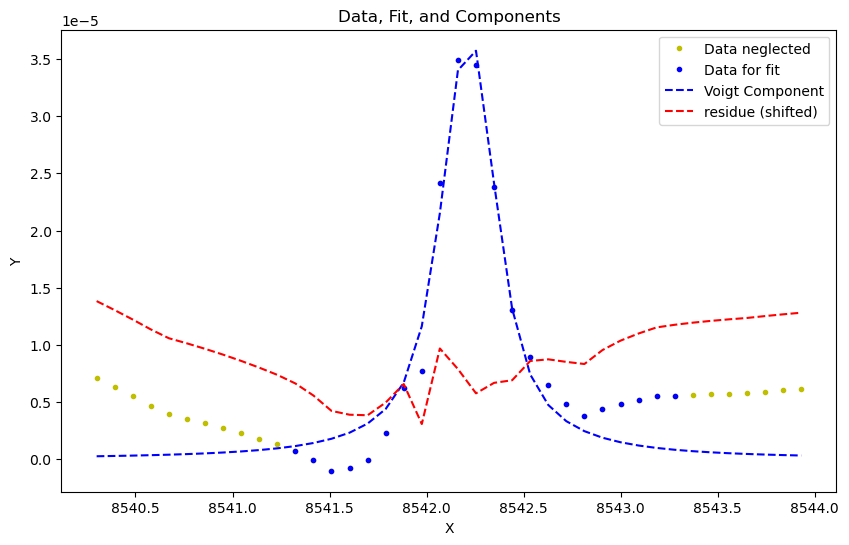

frame 50 at time 33.85000000000002 with param_fit[-1] = (array([ 6.41835348e-05,  8.54212765e+03,  1.47896647e-01, -4.47662199e-04]), array([1.65955353e-02, 2.12445709e-02, 1.88899009e-02, 6.31914792e+03])). Here comes the plot:


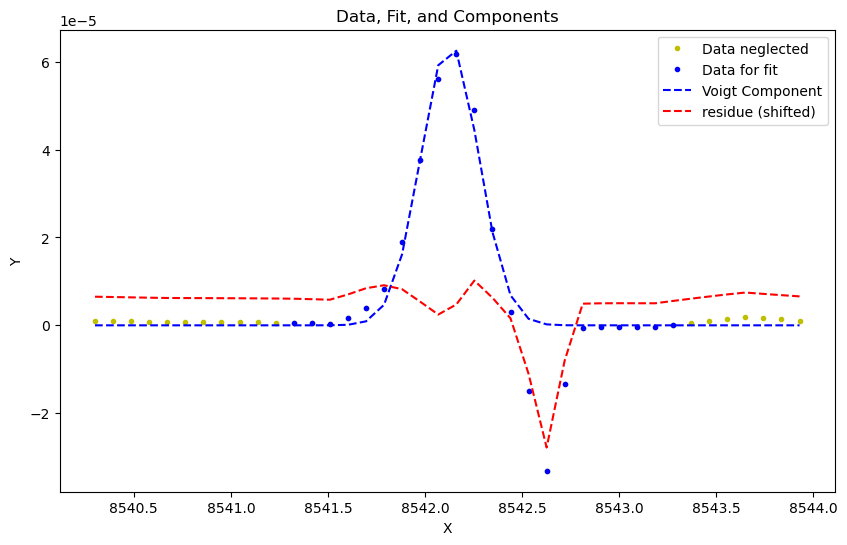

At frame 69 at time 45.23333333333335 the voigt fitting was not succesfull and average guess ([ 6.25914874e-05  8.54210357e+03 -7.33062663e-01 -4.30202902e-01]) is used as params and as std of params. 
At frame 74 at time 48.2166666666667 the voigt fitting was not succesfull and average guess ([ 6.91193569e-05  8.51964322e+03 -1.27884764e+00 -9.77726095e+00]) is used as params and as std of params. 
At frame 76 at time 49.41666666666663 the voigt fitting was not succesfull and average guess ([ 9.65929982e-04  1.68096828e+03  1.44767935e+01 -2.88366175e+02]) is used as params and as std of params. 
At frame 77 at time 50.01666666666665 the voigt fitting was not succesfull and average guess ([ 1.85523321e-03 -5.13488511e+03  3.06998832e+01 -5.58529441e+02]) is used as params and as std of params. 
At frame 83 at time 53.60000000000002 the voigt fitting was not succesfull and average guess ([ 8.45616243e-03 -4.11102998e+04 -2.43221868e+00 -1.60799209e+03]) is used as params and as std of 

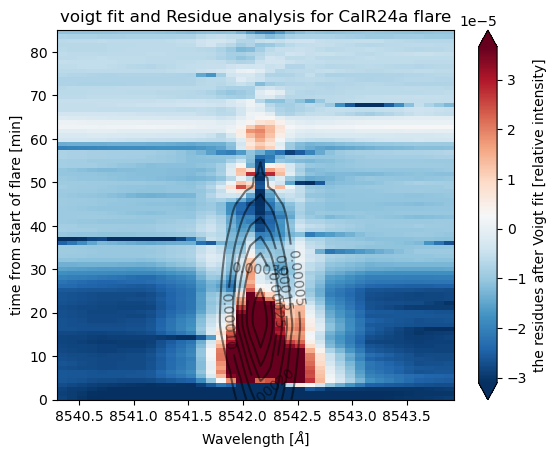

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [4]:
reload(un)
reload(un2)
reload(vf)
lines = ["CaIR24a"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) 
print(data.keys())
# un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':50, 'Hbeta':200,  "CaK":1, "CaK(2)":200,  "CaIR":5,  "Fe6173":20, "He":2}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 3.21357768e-04, 8.54218041e+03, 2.07115523e-01, 1.10242561e-01],
                   "Fe6173":[4.13090273e-06, 6.17348106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-7.04217575e-06,  5.87645793e+03, -2.32074350e-01,  1.18592840e+00]}
np=vf.exc_wings(10, -7)

offsets= [[0, 3.5e-5],
          [3, 1e-5]
          ]

vf.make_analysis(lines[0], data, offset=offsets, plot_rate=50, initial_guess=initial_guesses["CaIR"], neglect_points=np)

In [5]:
reload(un)
reload(un2)
reload(vf)
lines = [ "Ha22a", "CaIR22a"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) 
print(data.keys())
# un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':50, 'Hbeta':200,  "CaK":1, "CaK(2)":200,  "CaIR":50,  "Fe6173":20, "He":2}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-06, 6.17348106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-7.04217575e-06,  5.87645793e+03, -2.32074350e-01,  1.18592840e+00]}
lnp=[vf.exc_wings(15, -0), vf.exc_wings(0,-0),[], [], vf.exc_wings(10,-10)]
ofs = [1e-5,0,0,0,0]



dict_keys(['area_theta_Ha22a', 'FOV_Ha22a', 'quiet_sun_Ha22a', 'nessi_Ha22a', 'True_nessi_Ha22a', 'TIME_Ha22a', 'area_theta_CaIR22a', 'FOV_CaIR22a', 'quiet_sun_CaIR22a', 'nessi_CaIR22a', 'True_nessi_CaIR22a', 'TIME_CaIR22a'])


The average is 1.0000032573314028
frame 0 at time -22.96666666666664 with param_fit[-1] = (array([ 5.95764375e-05,  6.56285818e+03,  2.58868638e-01, -2.74958970e-05]), array([1.36177988e-05, 1.59052756e-02, 1.58847286e-02, 2.67874895e+02])). Here comes the plot:


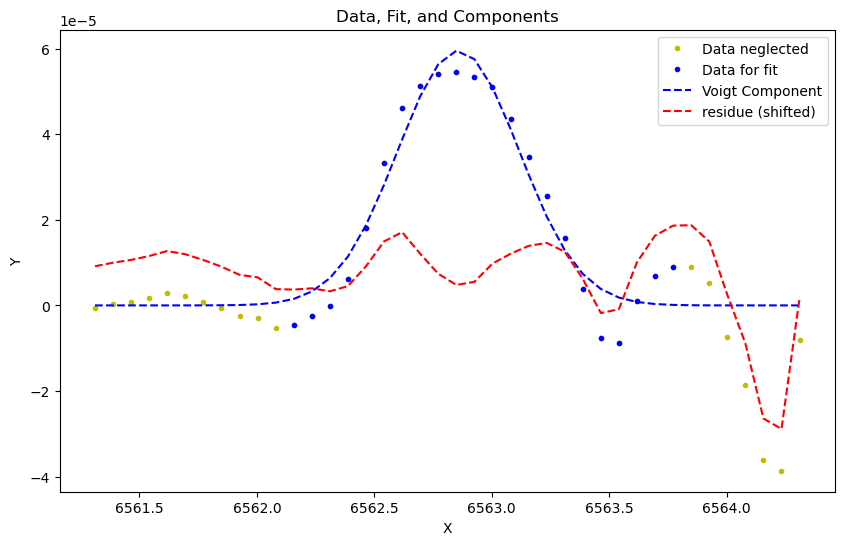

e:\solar flares\data\voigt_fitting\voigt_fit.py:42: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(voigt, x_data, y_data, p0=initial_guess)


frame 50 at time 10.600000000000023 with param_fit[-1] = (array([ 3.86846553e-04,  6.56282423e+03,  3.63601609e-01, -6.35038512e-04]), array([5.41473970e-03, 7.83019944e-03, 7.27164515e-03, 1.45943965e+03])). Here comes the plot:


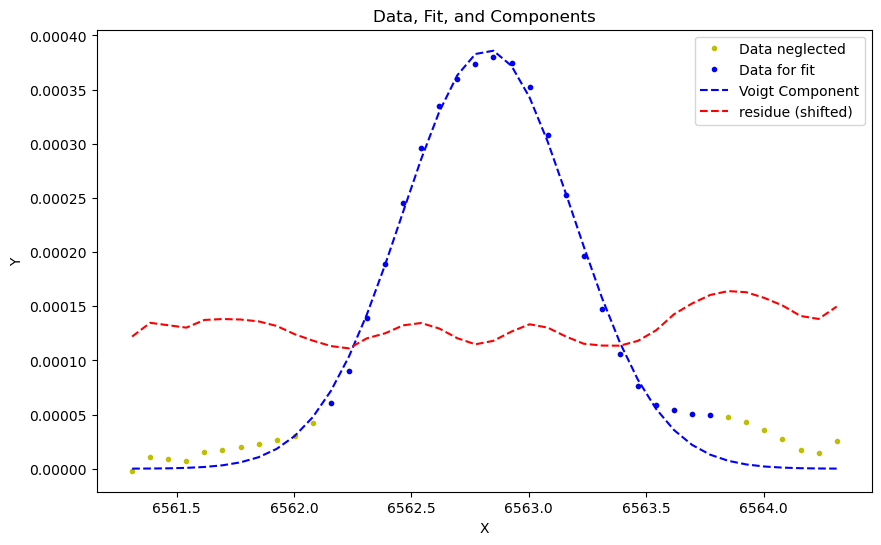

frame 100 at time 44.200000000000045 with param_fit[-1] = (array([ 2.59513327e-05,  6.56267632e+03,  2.18137825e-01, -2.48874967e-04]), array([2.46614858e-03, 6.30246982e-02, 6.24083927e-02, 9.10289304e+03])). Here comes the plot:


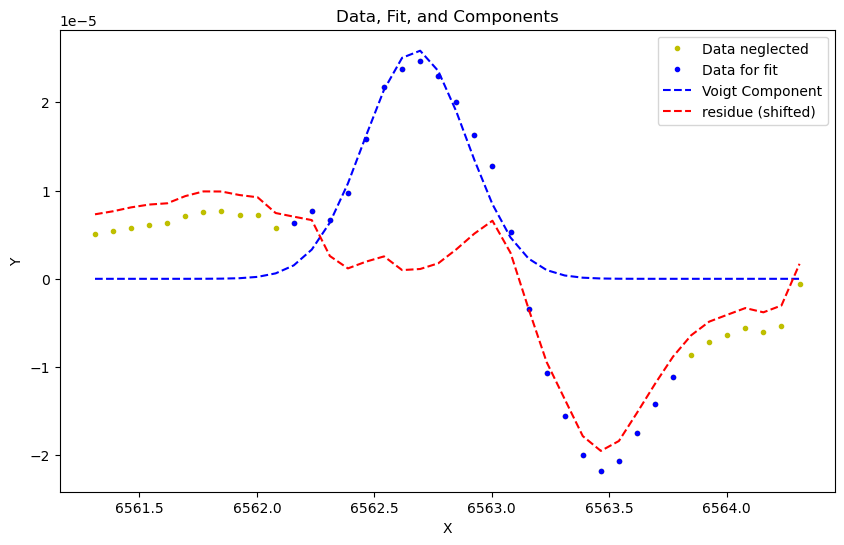

vmax = 6.6456404270837925e-06, vmin = -0.0001658933241960097


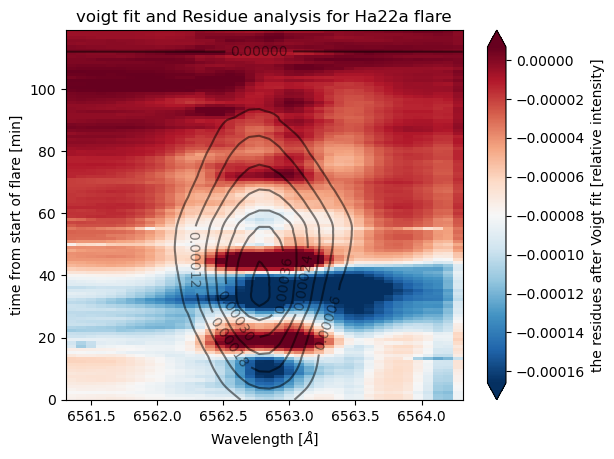

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [6]:

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 3.21357768e-04, 8.54218041e+03, 2.07115523e-01, 1.10242561e-01],
                   "Fe6173":[4.13090273e-06, 6.17348106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-7.04217575e-06,  5.87645793e+03, -2.32074350e-01,  1.18592840e+00]}

offsets= [[0, 7.5e-5],
          [25, 8.5e-5],
          [30, 14.5e-5],
          [40, 10.5e-5],
          [45, 7.3e-5],
          [55, 6.3e-5],
          [60, 5.3e-5],
          [65, 4.3e-5],
          [75, 3.3e-5],
          [80, 1e-5],
          [100, 0e-5],
          [105, -0.5e-5],
          [112, 0e-5],
          ]

vf.make_analysis(lines[0], data, offset=offsets, plot_rate=50, initial_guess=initial_guesses["Ha"], neglect_points=vf.exc_wings(10, -7))
# vf.make_analysis(lines[0], data, offset=offsets, plot_rate=5, initial_guess=initial_guesses["Ha"], 
                #  neglect_points=vf.exc_wings(10, -7), frame_range=[110, 140])
# vf.make_analysis(lines[0], data, offset=offsets, plot_rate=5, initial_guess=initial_guesses["Ha"], 
#                  neglect_points=vf.exc_wings(3, -7), frame_range=[80, 120])

The average is 0.9999959485474497
frame 0 at time -23.19999999999999 with param_fit[-1] = (array([ 4.24679875e-05,  8.54214106e+03,  1.98252959e-01, -1.47880843e-01]), array([2.49153852e-06, 1.20690592e-02, 2.05366475e-02, 7.07670176e-02])). Here comes the plot:


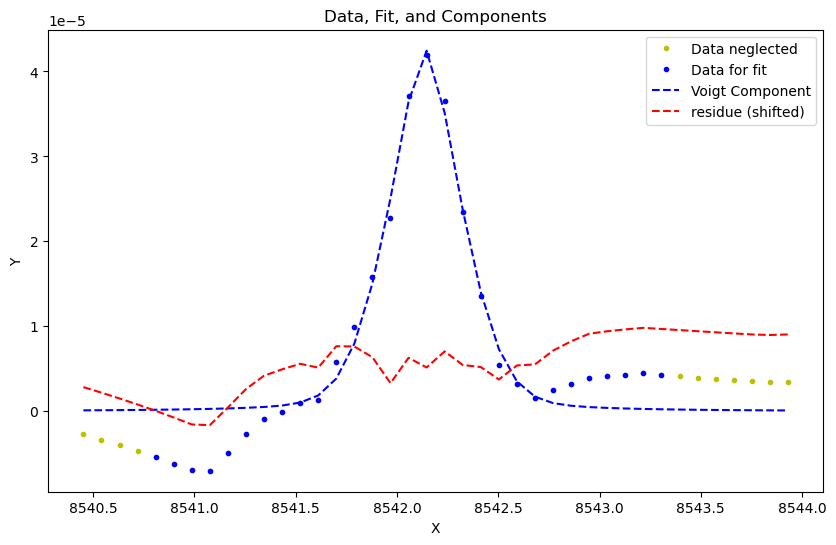

frame 50 at time 10.383333333333326 with param_fit[-1] = (array([ 4.40653585e-04,  8.54211987e+03,  1.44533606e-01, -2.40058940e-01]), array([7.26723790e-06, 3.25699066e-03, 1.31323882e-02, 5.14324724e-03])). Here comes the plot:


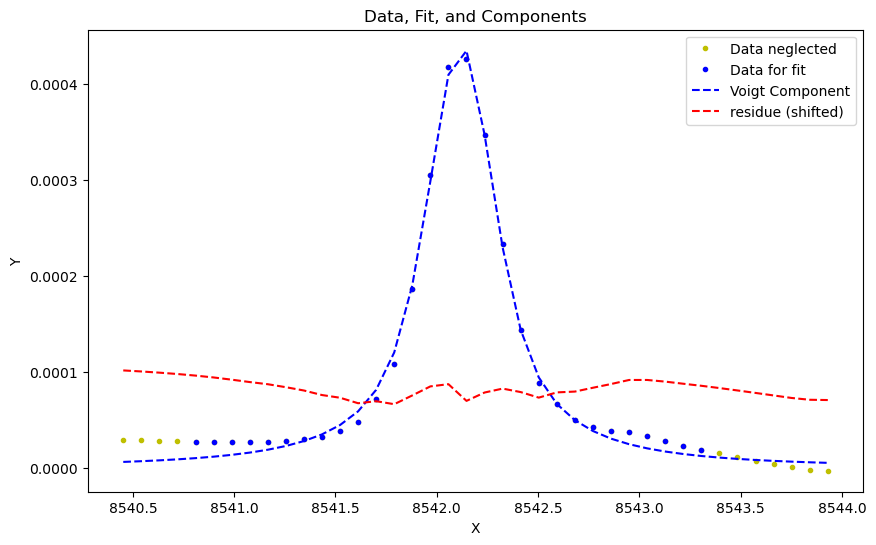

frame 100 at time 43.98333333333335 with param_fit[-1] = (array([ 1.57928432e-05,  8.54204429e+03,  1.76139737e-01, -3.74201754e-04]), array([1.44268922e-03, 1.87403350e-02, 1.83887274e-02, 3.79117019e+03])). Here comes the plot:


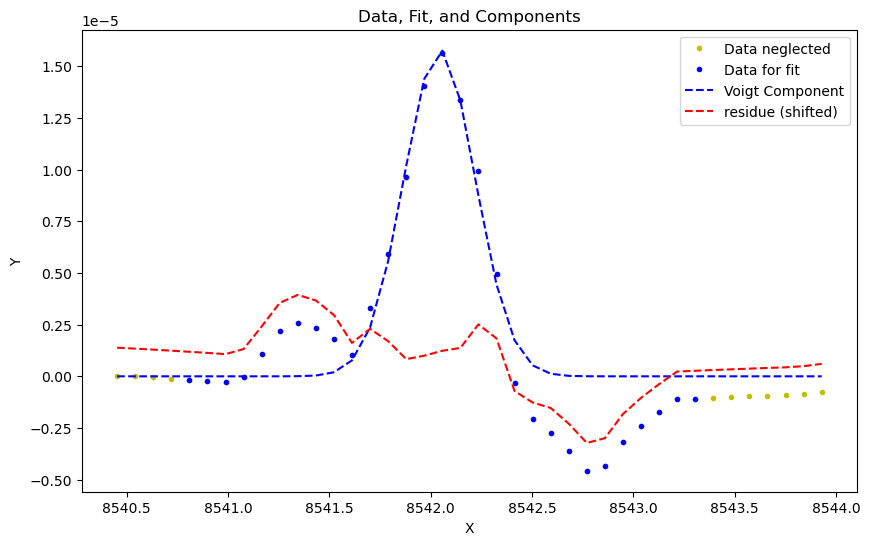

At frame 118 at time 56.06666666666672 the voigt fitting was not succesfull and average guess ([-1.40988371e-05  8.54206765e+03  5.45174398e-02 -9.25382157e-02]) is used as params and as std of params. 
frame 150 at time 77.54999999999995 with param_fit[-1] = (array([-4.55468360e-05,  8.54214318e+03, -1.24298017e-01, -2.37789107e-01]), array([1.31723921e-06, 5.32945651e-03, 2.59837349e-02, 1.00487029e-02])). Here comes the plot:


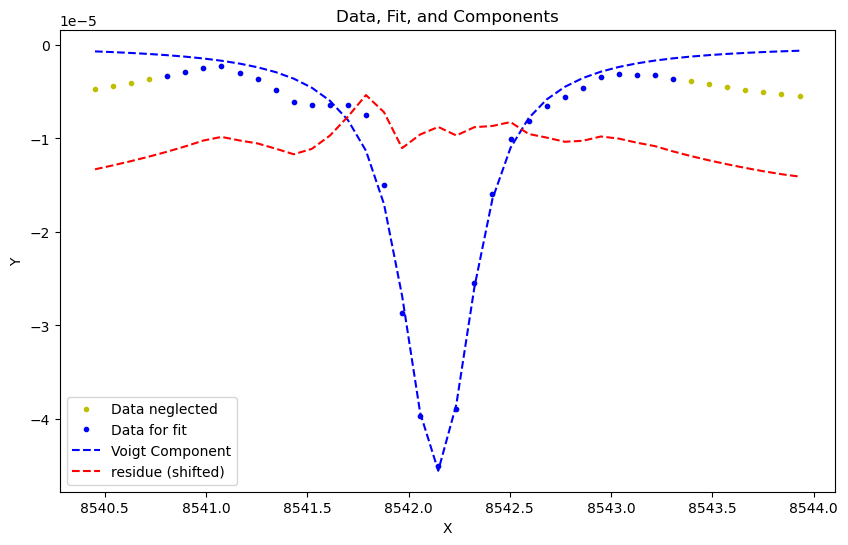

vmax = 5.916600545821676e-05, vmin = -9.673173615318377e-05


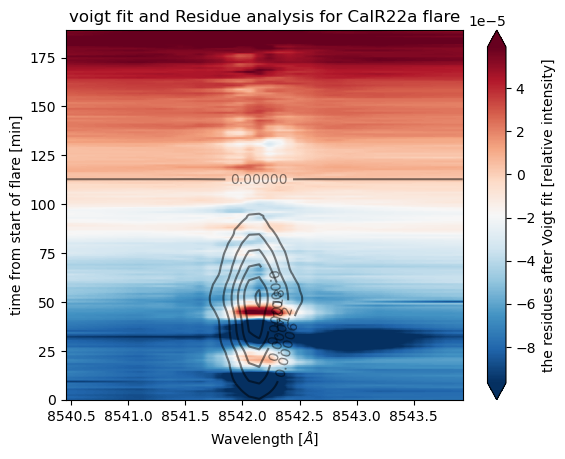

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [7]:
initial_guess=[[0,  [3.66838658e-06,  8.54202758e+03,  1.34011123e-01, -4.85887453e-01]],
               [111, [-3.97122002e-05,  8.54200014e+03, -8.57122223e-02, -2.36019913e-01]],
               [400, [-6e-5, 8.5420e+3 , 1.34011123e-01, -4.85887453e-01]],
               [450, [5.47474574e-04,  8.54204524e+03,  1.47430464e-01, -3.66873927e-01]] #[3.66838658e-05,  8.54202758e+03,  1.34011123e-01, -4.85887453e-01]]
              ]



offsets= [[0, 8e-5],
          [55, 5e-5],
          [65, 4e-5],
          [75, 3e-5],
          [85, 2e-5],
          [100, 1.2e-5],
          [105, 1.1e-5],
          [110, 0.5e-5],
          [111, 0.2e-5],
          [112, -0.2e-5],
          [114, -0.4e-5],
          [116, -0.6e-5],
          [133, -1.6e-5],
          [139, -2.6e-5],
          [155, -3.5e-5],
          [165, -4e-5],
          [170, -4.5e-5],
          [175, -5.5e-5],
          [185, -6e-5],

          ]

vf.make_analysis(lines[1], data, offset=offsets, plot_rate=50, initial_guess=initial_guess, 
                 neglect_points=vf.exc_wings(3, -7))

## 21a

dict_keys(['area_theta_Fe21a', 'FOV_Fe21a', 'quiet_sun_Fe21a', 'nessi_Fe21a', 'True_nessi_Fe21a', 'TIME_Fe21a', 'area_theta_CaIR21a', 'FOV_CaIR21a', 'quiet_sun_CaIR21a', 'nessi_CaIR21a', 'True_nessi_CaIR21a', 'TIME_CaIR21a'])
The average is 1.0000740214728996
frame 0 at time 14.93333333333328 with param_fit[-1] = (array([ 5.97615436e-04,  8.54213453e+03,  2.05438877e-01, -1.41557631e-01]), array([5.86139409e-06, 2.46451100e-03, 4.01495815e-03, 1.96194975e-02])). Here comes the plot:


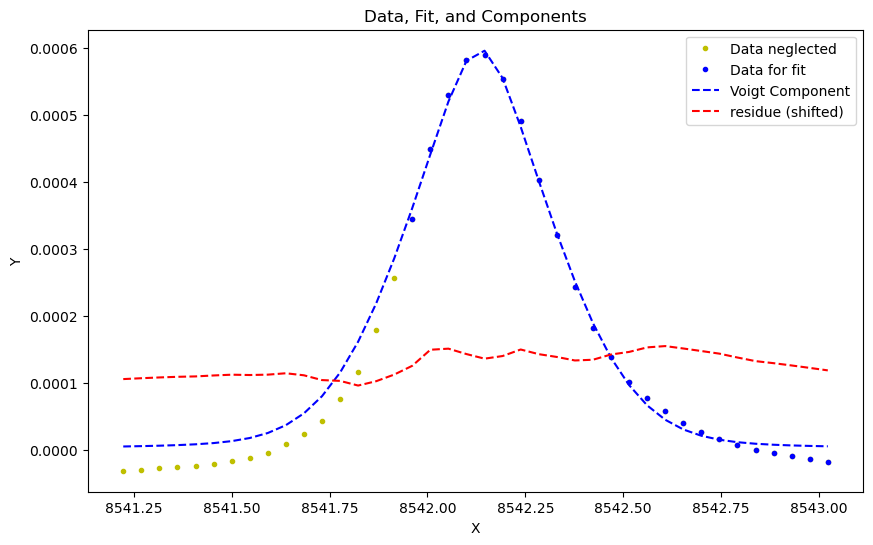

frame 50 at time 32.91666666666663 with param_fit[-1] = (array([ 3.32427511e-04,  8.54212743e+03,  1.89770249e-01, -8.14917890e-02]), array([2.89262466e-06, 2.04181073e-03, 3.61569286e-03, 1.47535957e-02])). Here comes the plot:


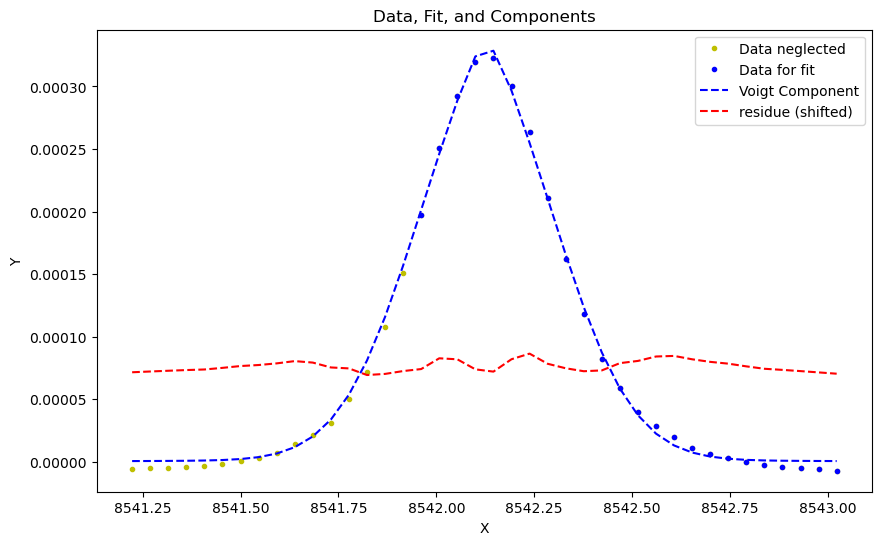

At frame 91 at time 47.64999999999998 the voigt fitting was not succesfull and average guess ([ 1.86554237e-05  8.54215814e+03  9.24231171e-02 -4.93992484e-01]) is used as params and as std of params. 
At frame 92 at time 48.01666666666665 the voigt fitting was not succesfull and average guess ([ 1.76895684e-05  8.54212145e+03  1.18572807e-01 -5.90651619e-01]) is used as params and as std of params. 
vmax = 1.553530730050316e-05, vmin = -3.869803710373747e-05


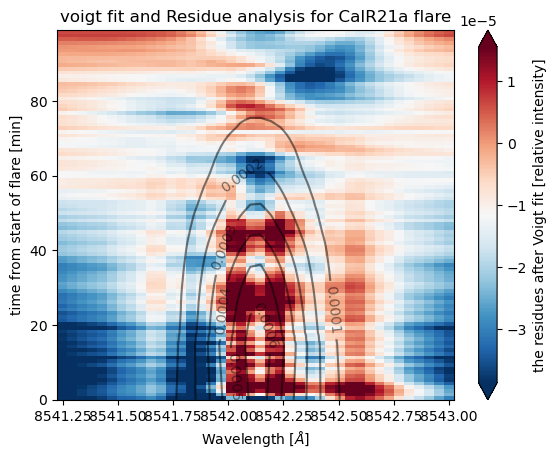

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [11]:
reload(un)
reload(un2)
reload(vf)
lines = [ "Fe21a", "CaIR21a"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) 
print(data.keys())
# un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':50, 'Hbeta':200,  "CaK":1, "CaK(2)":200,  "CaIR":50,  "Fe6173":20, "He":2}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-06, 6.17348106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-7.04217575e-06,  5.87645793e+03, -2.32074350e-01,  1.18592840e+00]}
lnp=[vf.exc_wings(15, -0), vf.exc_wings(0,-0),[], [], vf.exc_wings(10,-10)]
ofs = [1e-5,0,0,0,0]

vf.make_full_analysis(data, [lines[1]], offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

Assuming that Fe21a is spectral line Fe6173.
The average is 1.000002949598862
frame 0 at time 14.850000000000023 with param_fit[-1] = (array([ 1.85690811e-05,  6.17339117e+03,  5.08888286e-02, -4.85930824e-02]), array([1.46850836e-06, 4.06898371e-03, 3.78982474e-02, 7.63381642e-02])). Here comes the plot:


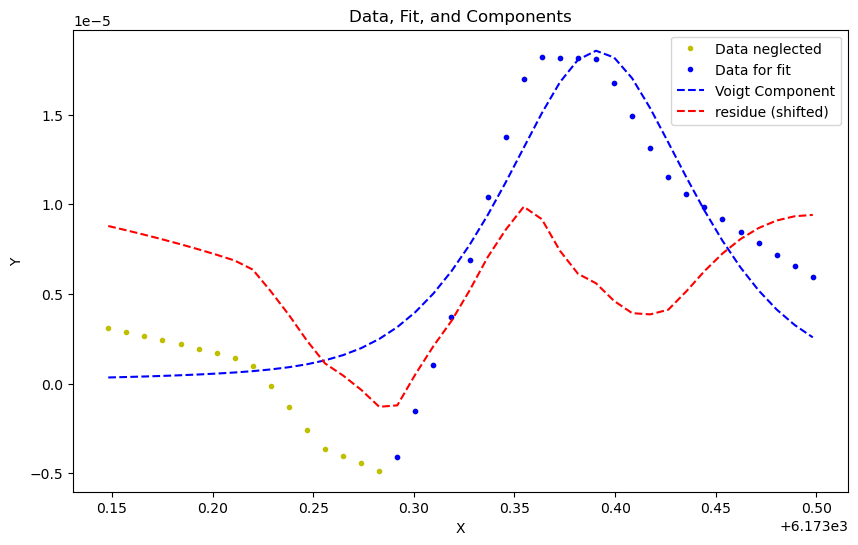

frame 20 at time 22.049999999999955 with param_fit[-1] = (array([-1.60905088e-05,  6.17329393e+03,  2.21861844e-02,  3.88178653e-03]), array([1.26058212e-05, 6.80461306e-02, 2.51376324e-02, 1.91491734e-01])). Here comes the plot:


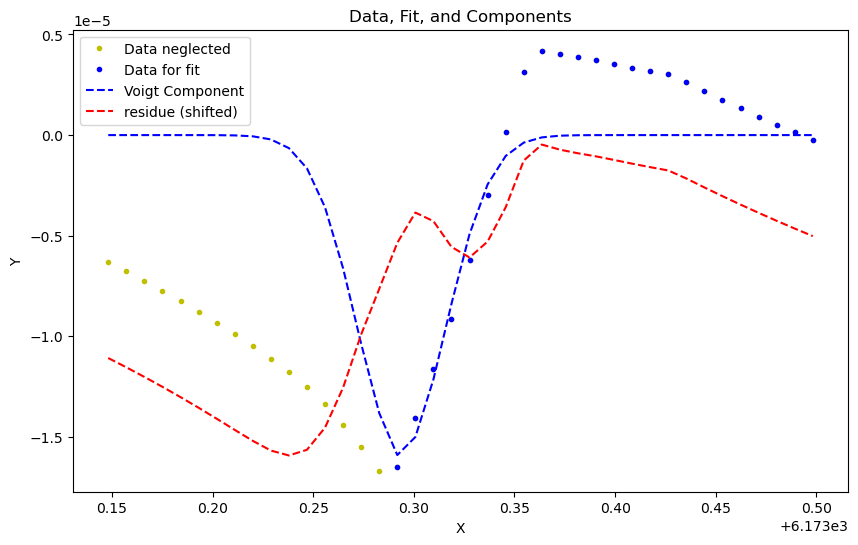

frame 40 at time 29.23333333333335 with param_fit[-1] = (array([2.73629526e-05, 6.17341737e+03, 1.58511146e-01, 6.10759151e-02]), array([8.18794820e-08, 5.27663223e-04, 7.56605579e-03, 1.57870389e-02])). Here comes the plot:


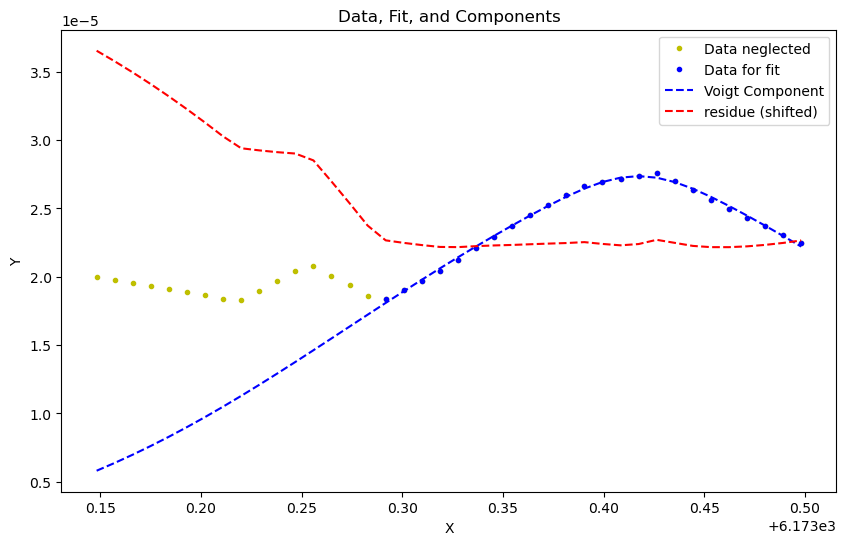

At frame 48 at time 32.116666666666674 the voigt fitting was not succesfull and average guess ([1.52151306e-05 6.17341371e+03 1.14944574e-01 1.18025289e-02]) is used as params and as std of params. 
At frame 49 at time 32.4666666666667 the voigt fitting was not succesfull and average guess ([ 1.49118047e-05  6.17341760e+03  1.17309151e-01 -1.60611377e-02]) is used as params and as std of params. 
At frame 50 at time 32.83333333333337 the voigt fitting was not succesfull and average guess ([ 1.41170394e-05  6.17342069e+03  1.28675777e-01 -3.50402276e-02]) is used as params and as std of params. 
At frame 51 at time 33.18333333333328 the voigt fitting was not succesfull and average guess ([ 1.30015817e-05  6.17342538e+03  1.24389861e-01 -6.04934143e-02]) is used as params and as std of params. 
At frame 53 at time 33.89999999999998 the voigt fitting was not succesfull and average guess ([ 6.29738340e-05  6.17324121e+03  1.17106739e-01 -2.38848118e-02]) is used as params and as std of par

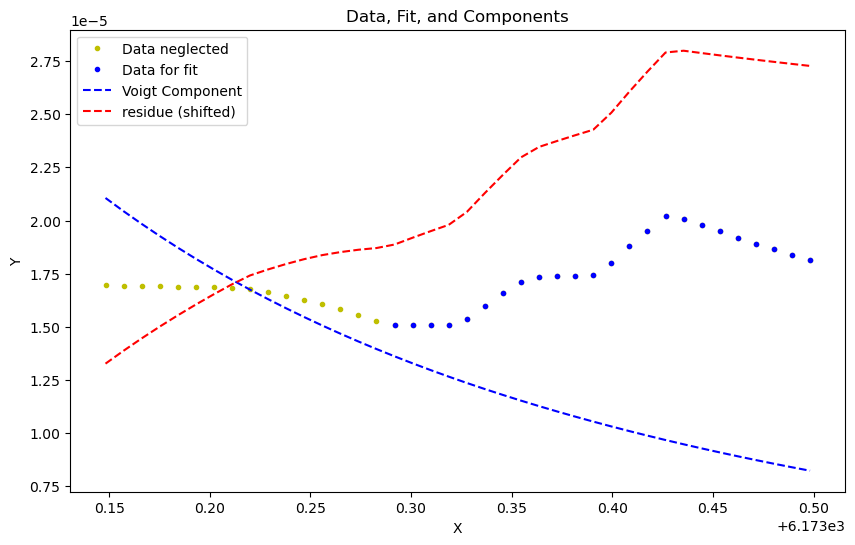

At frame 64 at time 37.866666666666674 the voigt fitting was not succesfull and average guess ([ 1.77205428e-04  6.17279986e+03 -5.15569836e-04  1.44433349e-01]) is used as params and as std of params. 
At frame 65 at time 38.2166666666667 the voigt fitting was not succesfull and average guess ([ 1.68888519e-04  6.17283259e+03 -5.65490609e-04  1.39539769e-01]) is used as params and as std of params. 
At frame 78 at time 42.89999999999998 the voigt fitting was not succesfull and average guess ([ 8.32563726e-05  6.17316967e+03 -4.34616610e-04  8.91537739e-02]) is used as params and as std of params. 
At frame 79 at time 43.25 the voigt fitting was not succesfull and average guess ([ 7.94762966e-05  6.17318454e+03 -4.82845667e-04  8.69296553e-02]) is used as params and as std of params. 
frame 80 at time 43.616666666666674 with param_fit[-1] = (array([ 6.68209420e-04,  6.17035858e+03, -3.67321845e-04,  3.77068872e-01]), array([   4.53840878,  318.65587222,  979.54827613, 1260.9826489 ])).

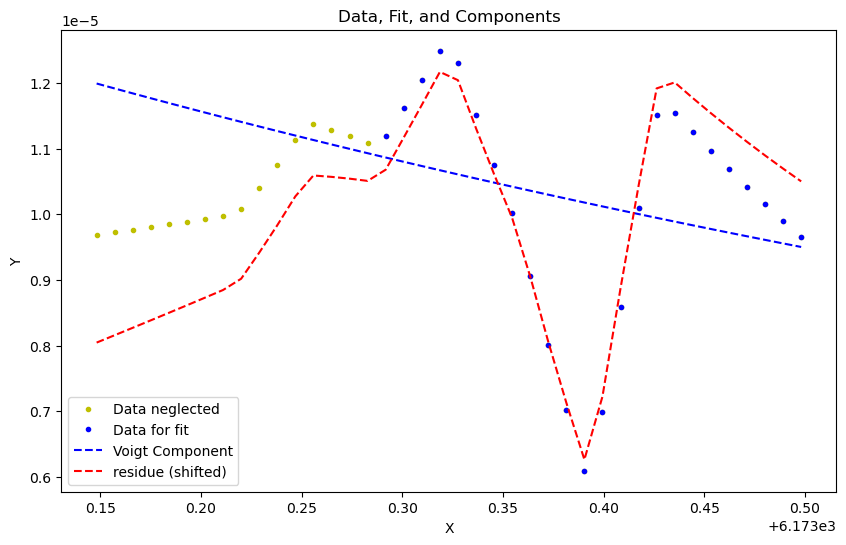

At frame 81 at time 43.9666666666667 the voigt fitting was not succesfull and average guess ([ 1.71612702e-04  6.17273711e+03 -5.56181150e-04  1.31764305e-01]) is used as params and as std of params. 
At frame 85 at time 45.41666666666663 the voigt fitting was not succesfull and average guess ([5.32439896e-04 6.17000455e+03 5.83791440e-02 3.64994609e-01]) is used as params and as std of params. 
At frame 86 at time 45.76666666666665 the voigt fitting was not succesfull and average guess ([6.82795744e-04 6.16830111e+03 6.36038630e-02 5.15496230e-01]) is used as params and as std of params. 
At frame 87 at time 46.133333333333326 the voigt fitting was not succesfull and average guess ([8.33151592e-04 6.16659767e+03 6.88285820e-02 6.65997851e-01]) is used as params and as std of params. 
At frame 88 at time 46.5 the voigt fitting was not succesfull and average guess ([1.05029902e-03 6.16457482e+03 7.40876056e-02 8.49547229e-01]) is used as params and as std of params. 
At frame 89 at time

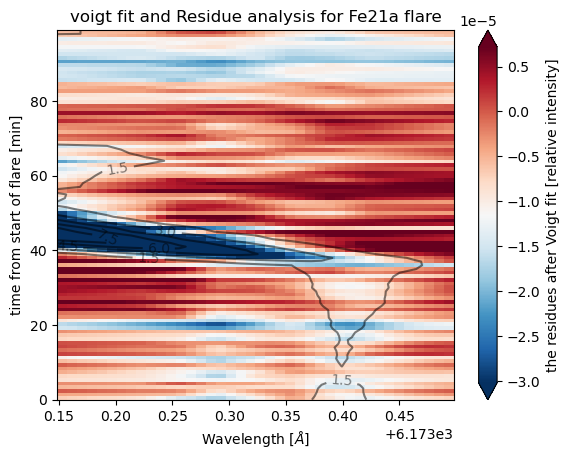

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0000740214728996
frame 0 at time 14.93333333333328 with param_fit[-1] = (array([5.89860476e-04, 8.54214132e+03, 1.81100158e-01, 4.81215286e-02]), array([1.52012041e-05, 3.58314605e-03, 5.01455503e-03, 2.46097933e-02])). Here comes the plot:


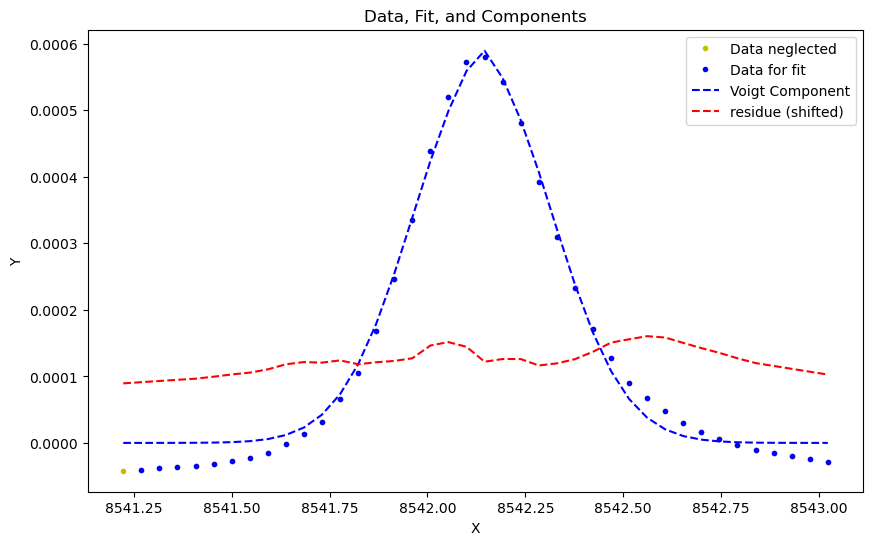

frame 50 at time 32.91666666666663 with param_fit[-1] = (array([ 3.17757405e-04,  8.54212912e+03,  1.72004855e-01, -3.27572619e-02]), array([7.15992803e-06, 2.65124260e-03, 3.36768802e-03, 2.00703297e-02])). Here comes the plot:


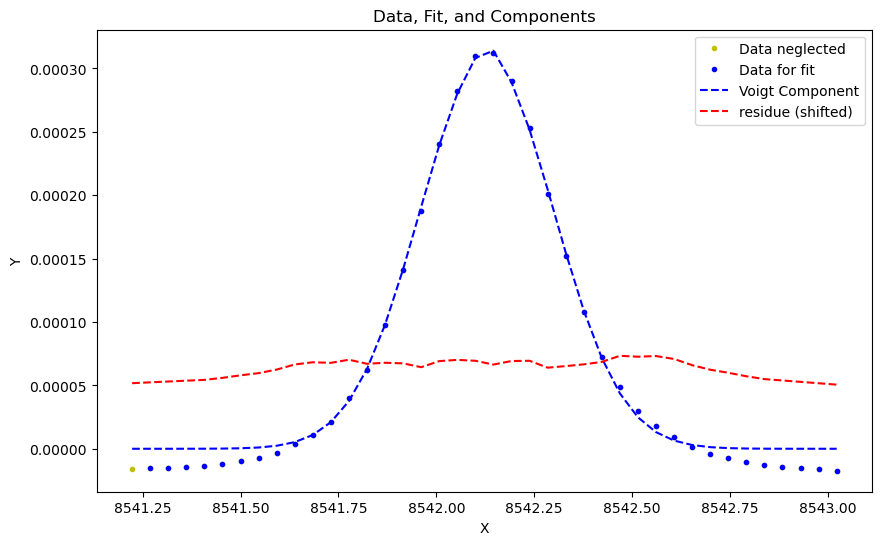

vmax = 5.506432238707457e-05, vmin = -3.373513387782751e-05


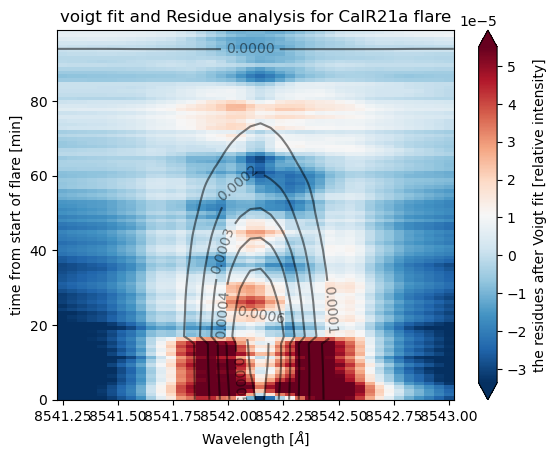

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [9]:

plot_rates = {'Ha':50, 'Hbeta':200,  "CaK":1, "CaK(2)":200,  "CaIR":50,  "Fe6173":20, "He":2}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-06, 6.17348106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-7.04217575e-06,  5.87645793e+03, -2.32074350e-01,  1.18592840e+00]}
lnp=[vf.exc_wings(15, -0), vf.exc_wings(0,-0),[], [], vf.exc_wings(10,-10)]
ofs = [1e-5,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

The average is 1.000002949598862
frame 0 at time 14.850000000000023 with param_fit[-1] = (array([-1.49137547e-05,  6.17325487e+03,  4.34012449e-02, -6.93649763e-05]), array([5.37141497e-04, 7.13887774e-03, 7.63653534e-03, 4.90237062e+02])). Here comes the plot:


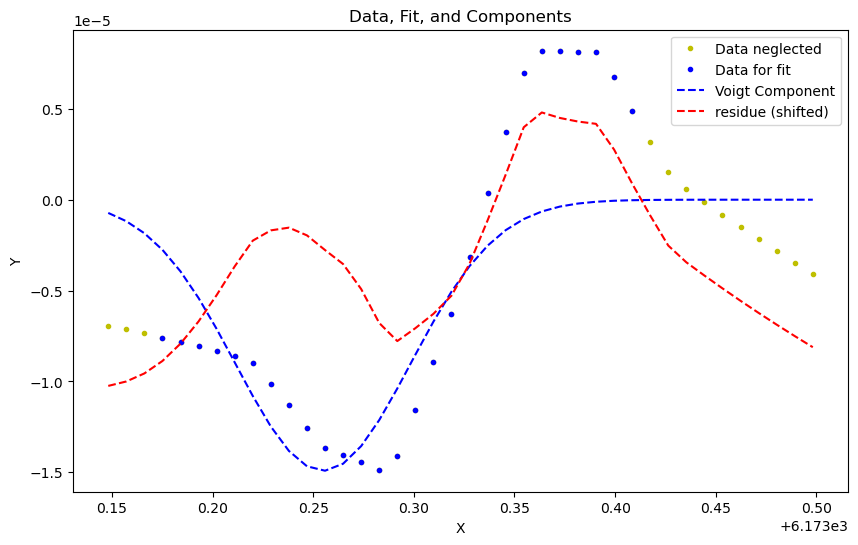

e:\solar flares\data\voigt_fitting\voigt_fit.py:42: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(voigt, x_data, y_data, p0=initial_guess)


frame 5 at time 16.649999999999977 with param_fit[-1] = (array([-1.14164057e-05,  6.17323813e+03,  5.82156161e-02, -3.13087848e-05]), array([4.58091574e-05, 6.00250606e-03, 7.04110121e-03, 2.21028599e+02])). Here comes the plot:


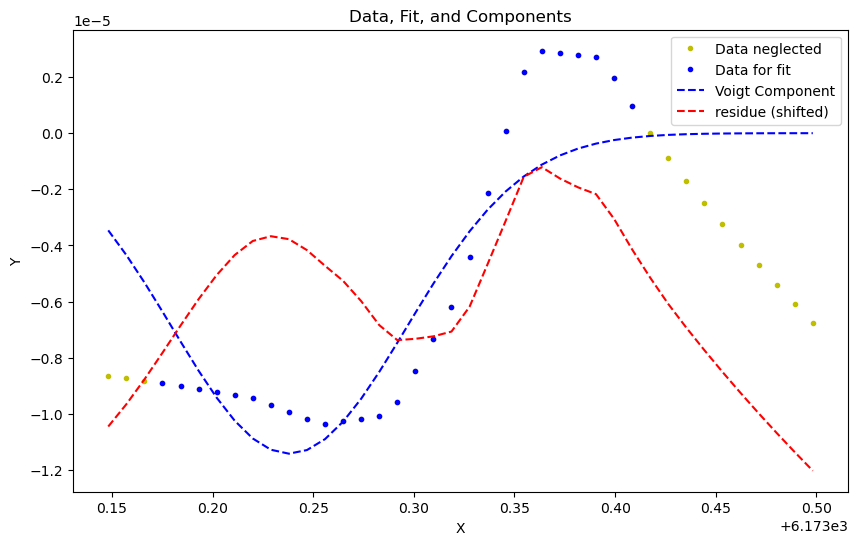

frame 10 at time 18.450000000000045 with param_fit[-1] = (array([-1.39047979e-05,  6.17326154e+03, -5.07136541e-02,  1.86461033e-06]), array([inf, inf, inf, inf])). Here comes the plot:


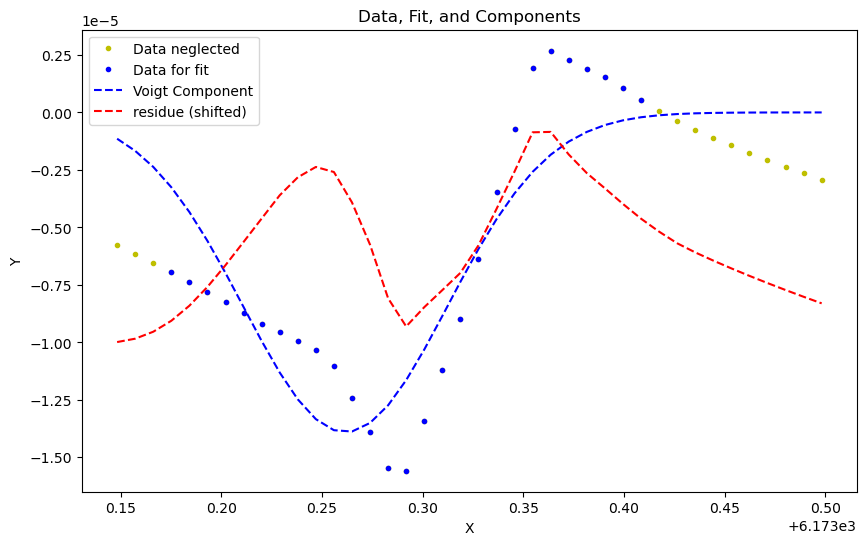

frame 15 at time 20.25 with param_fit[-1] = (array([ 7.29084955e-06,  6.17338510e+03,  2.82266178e-02, -2.96253701e-04]), array([2.07423818e-04, 6.38313006e-03, 6.23182963e-03, 5.24914749e+02])). Here comes the plot:


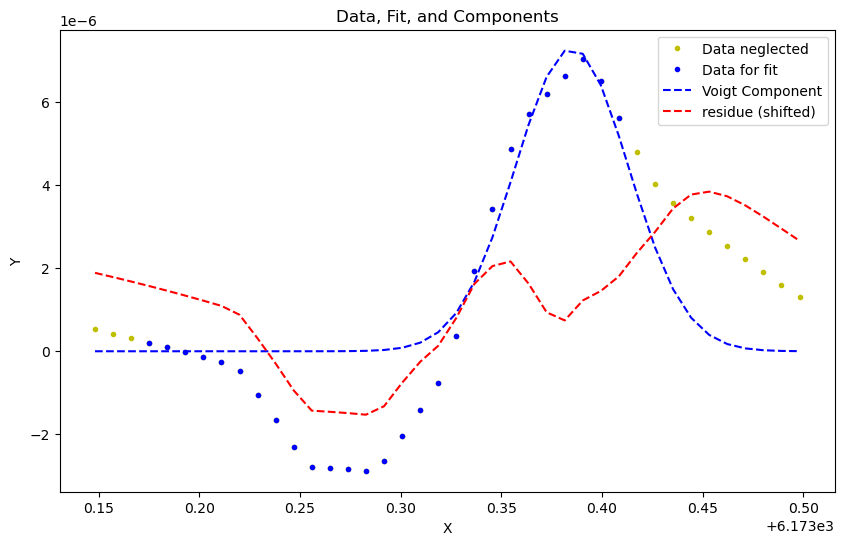

frame 20 at time 22.049999999999955 with param_fit[-1] = (array([-2.55599158e-05,  6.17325664e+03,  7.16297624e-02, -8.95737663e-02]), array([9.65180191e-07, 3.62331339e-03, 4.51305566e-02, 3.94731463e-02])). Here comes the plot:


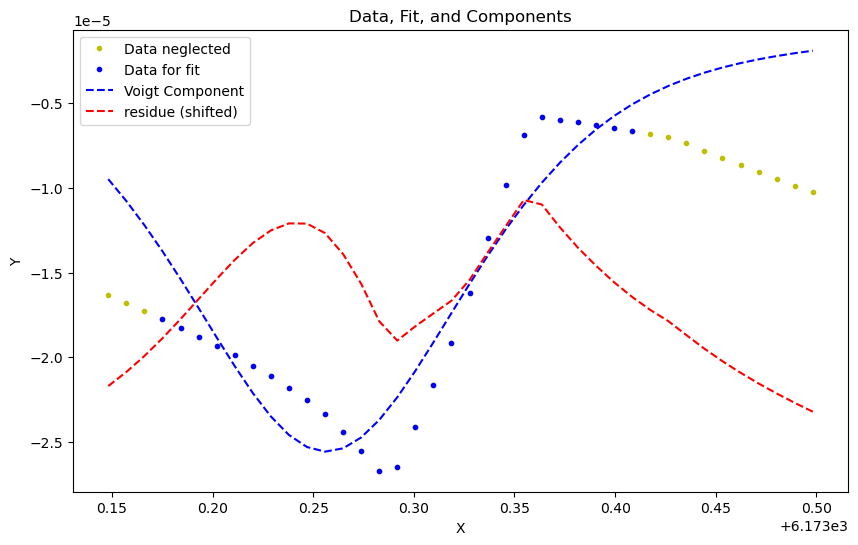

At frame 24 at time 23.48333333333335 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
frame 25 at time 23.83333333333337 with param_fit[-1] = (array([-1.15985683e-05,  6.17326607e+03, -4.53446411e-02, -1.42444948e-06]), array([inf, inf, inf, inf])). Here comes the plot:


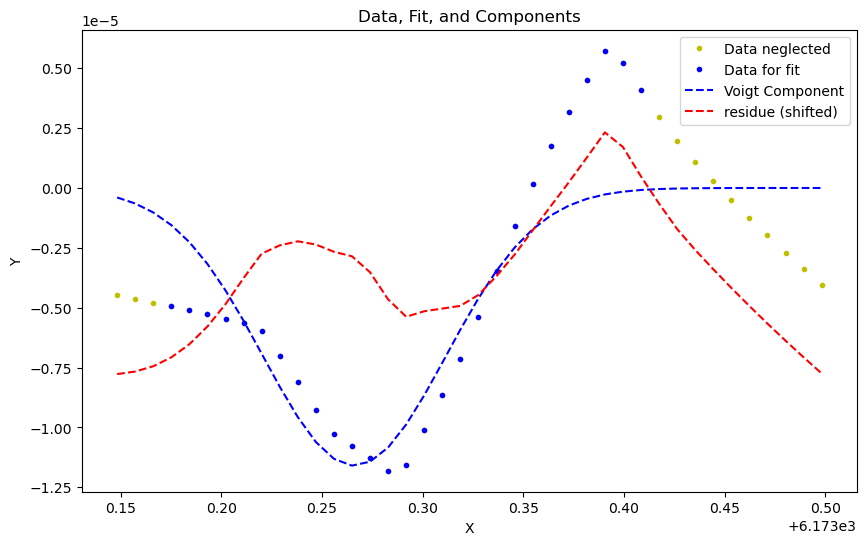

frame 30 at time 25.633333333333326 with param_fit[-1] = (array([-5.42091731e-06,  6.17328881e+03,  1.17295803e-02,  2.02324957e-02]), array([9.20664031e-07, 2.77844431e-03, 1.17027925e-02, 4.52279944e-03])). Here comes the plot:


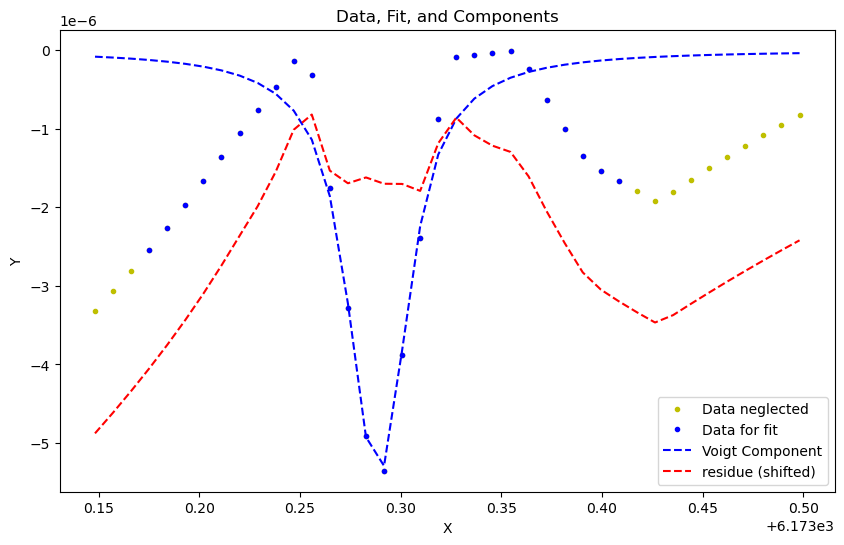

frame 35 at time 27.43333333333328 with param_fit[-1] = (array([ 9.19277881e-06,  6.17339352e+03, -3.33619679e-02,  1.00302076e-02]), array([1.31977380e-06, 7.89390063e-03, 8.71774806e-03, 3.20215895e-02])). Here comes the plot:


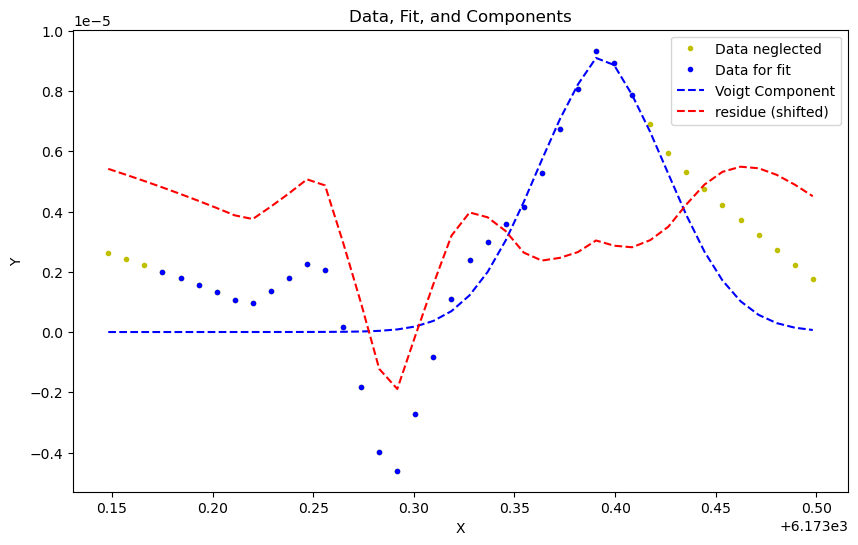

At frame 37 at time 28.149999999999977 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
frame 40 at time 29.23333333333335 with param_fit[-1] = (array([9.12491585e-06, 6.17340416e+03, 3.93809458e-02, 6.62457774e-02]), array([4.84148122e-07, 1.08622924e-02, 2.06424262e-02, 9.20563178e-03])). Here comes the plot:


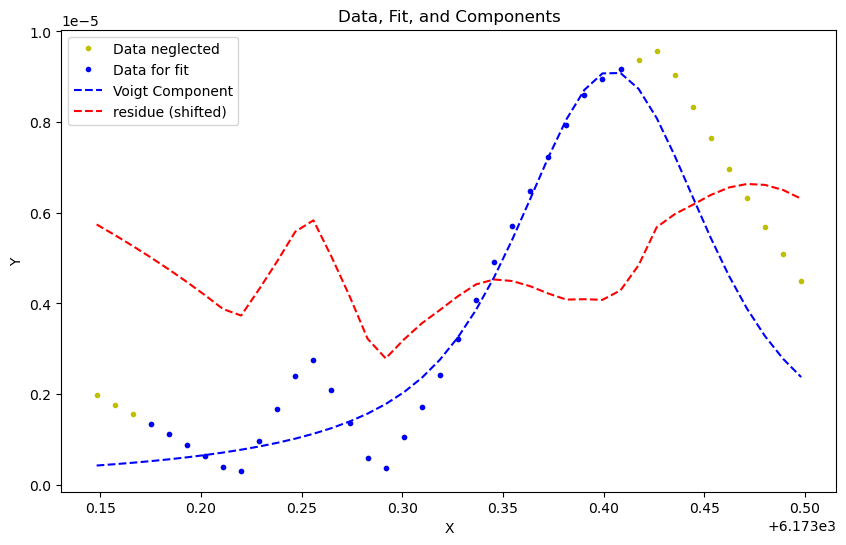

At frame 45 at time 31.033333333333303 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
At frame 47 at time 31.75 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
frame 50 at time 32.83333333333337 with param_fit[-1] = (array([ 1.37836556e-06,  6.17325860e+03, -7.97631140e-03, -3.30458149e-05]), array([9.74380460e-03, 4.17574683e-02, 4.87241678e-02, 2.74395667e+03])). Here comes the plot:


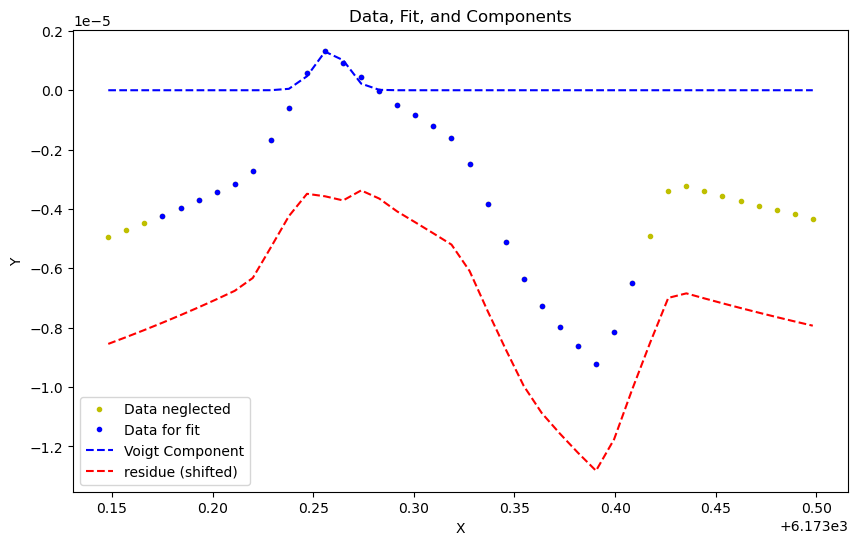

At frame 55 at time 34.633333333333326 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
At frame 57 at time 35.35000000000002 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
At frame 60 at time 36.41666666666663 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
frame 65 at time 38.2166666666667 with param_fit[-1] = (array([ 8.56720965e-06,  6.17325385e+03,  5.60269804e-02, -9.00938681e-03]), array([7.34516487e-07, 3.23776502e-03, 4.52334193e-03, 2.70746766e-02])). Here comes the plot:


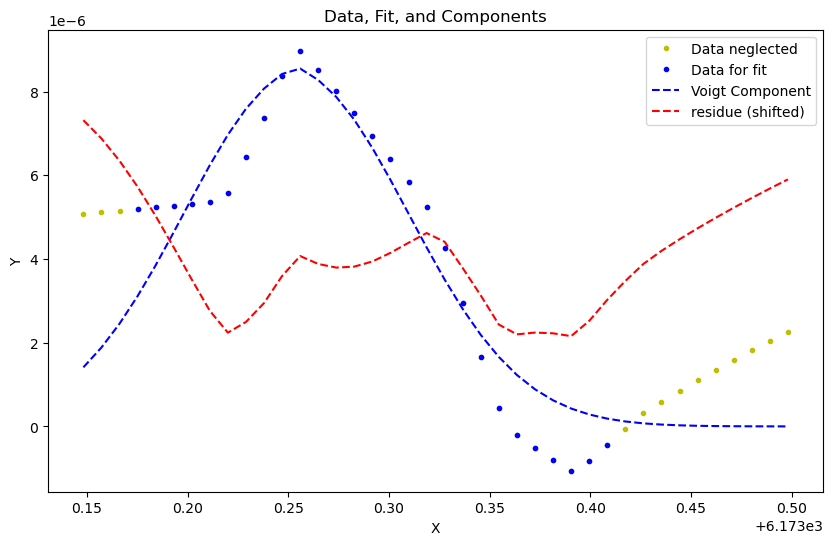

At frame 70 at time 40.01666666666665 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
At frame 71 at time 40.383333333333326 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
At frame 73 at time 41.10000000000002 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
At frame 75 at time 41.81666666666672 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
At frame 76 at time 42.18333333333328 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std o

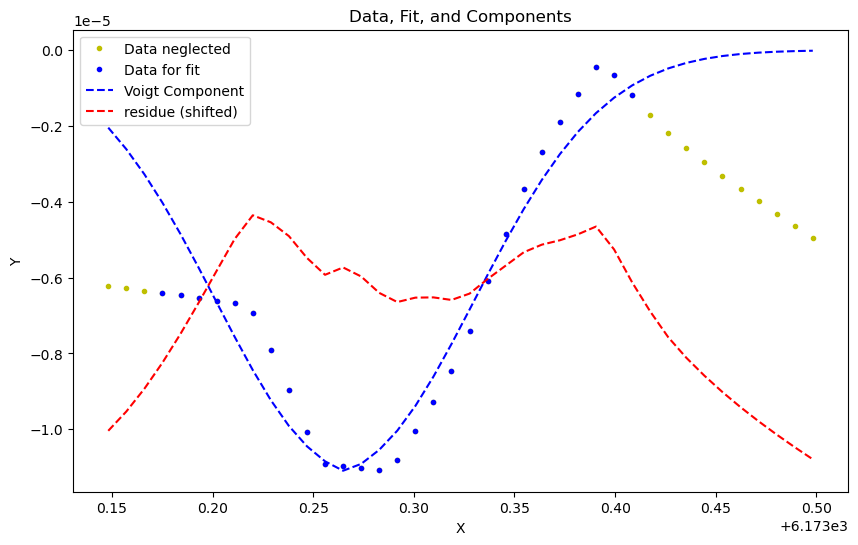

At frame 93 at time 48.2833333333333 the voigt fitting was not succesfull and average guess ([ 4.13090273e-06  6.17326060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
frame 95 at time 49.0 with param_fit[-1] = (array([ 3.17414090e-06,  6.17327397e+03, -2.15336356e-02, -6.92427976e-05]), array([4.03766116e-06, 6.40691957e-03, 6.96285438e-03, 4.80807465e+00])). Here comes the plot:


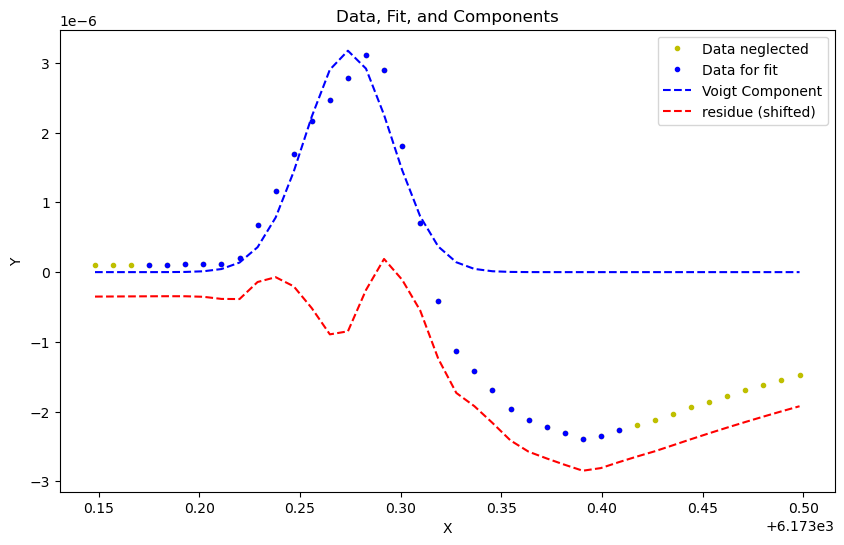

frame_range = range(0, 100)
vmax = 1.2801041038547231e-05, vmin = -1.0369082180405147e-05
[[6173.14818955 6173.15716391 6173.16613827 ... 6173.48024084
  6173.4892152  6173.49818955]
 [6173.14818955 6173.15716391 6173.16613827 ... 6173.48024084
  6173.4892152  6173.49818955]
 [6173.14818955 6173.15716391 6173.16613827 ... 6173.48024084
  6173.4892152  6173.49818955]
 ...
 [6173.14818955 6173.15716391 6173.16613827 ... 6173.48024084
  6173.4892152  6173.49818955]
 [6173.14818955 6173.15716391 6173.16613827 ... 6173.48024084
  6173.4892152  6173.49818955]
 [6173.14818955 6173.15716391 6173.16613827 ... 6173.48024084
  6173.4892152  6173.49818955]] [[ 0  0  0 ...  0  0  0]
 [ 1  1  1 ...  1  1  1]
 [ 2  2  2 ...  2  2  2]
 ...
 [97 97 97 ... 97 97 97]
 [98 98 98 ... 98 98 98]
 [99 99 99 ... 99 99 99]] [[-3.81084362e-11 -4.39118607e-11 -5.11610801e-11 ... -1.62364578e-11
  -1.48778393e-11 -1.36828732e-11]
 [-3.44268404e-11 -3.96538940e-11 -4.62192224e-11 ... -1.48172069e-11
  -1.35750186e-

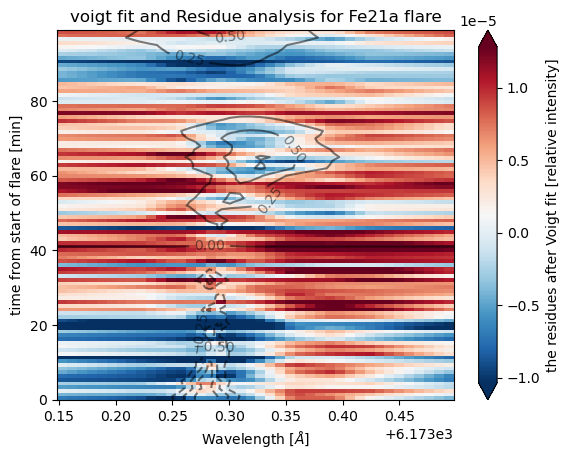

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [14]:
line = 'Fe21a'
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$'}

reload(vf)

data = un.load_for_further_analysis(lines)

initial_guess=[[0,  [4.13090273e-06, 6.1732606e+03, -1.55441909e-03, 4.25981451e-02]],
               [100, [3e-5,  6.562214340e+03,   3.47791771e-01, -6.80604117e-01]],
              ]

offsets= [[0, 0],
          [25, -0.8e-5],
          [47, -2e-6],
          [449, -6e-5]]

exf = [] #np.arange(315,375,1)
k= 100
vf.make_analysis(line, data, initial_guess=initial_guess,
              plot_rate=5, neglect_points=vf.exc_wings(2,-10), offset=offsets, fix_ind=[0,1,2,3], 
              exclude_frames=exf)


[2.         2.28333333 2.56666667 2.85       3.15       3.43333333
 3.71666667 4.         4.28333333 4.56666667 4.85       5.15
 5.43333333 5.71666667 6.        ]
dict_keys(['area_theta_He15b', 'FOV_He15b', 'quiet_sun_He15b', 'nessi_He15b', 'True_nessi_He15b', 'TIME_He15b'])
The average is 0.9999948053738351
frame 0 at time 2.0 with param_fit[-1] = (array([-7.65108895e-05,  5.87751221e+03,  1.33123273e-01,  2.20944829e+00]), array([1.82928149e-01, 8.89737881e-01, 4.39984319e+04, 6.13221355e-01])). Here comes the plot:


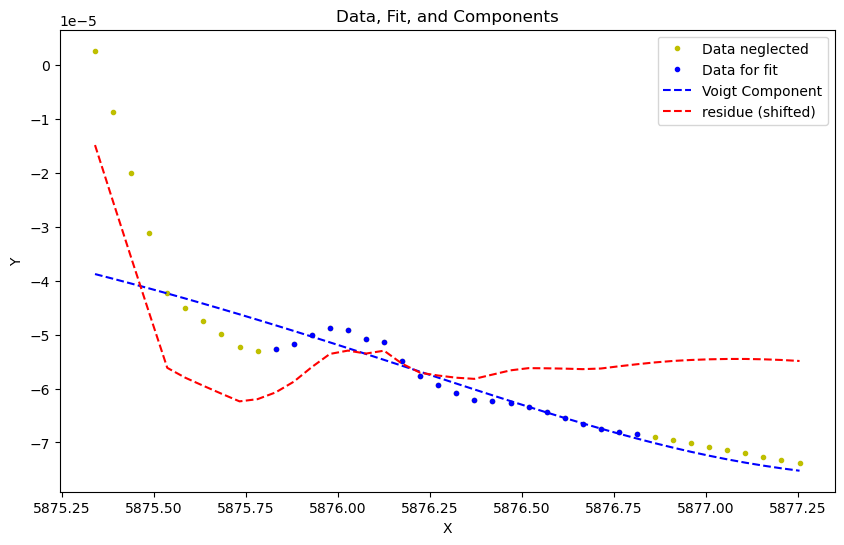

At frame 2 at time 2.5666666666667197 the voigt fitting was not succesfull and average guess ([-3.03931264e-05  5.87691399e+03 -2.09433303e-01  1.15033306e+00]) is used as params and as std of params. 
frame 4 at time 3.1499999999999773 with param_fit[-1] = (array([-7.83052642e-06,  5.87643409e+03,  5.37905096e-01,  2.94441451e-01]), array([5.55533723e-07, 3.20086365e-02, 1.63927297e-01, 8.86888045e-01])). Here comes the plot:


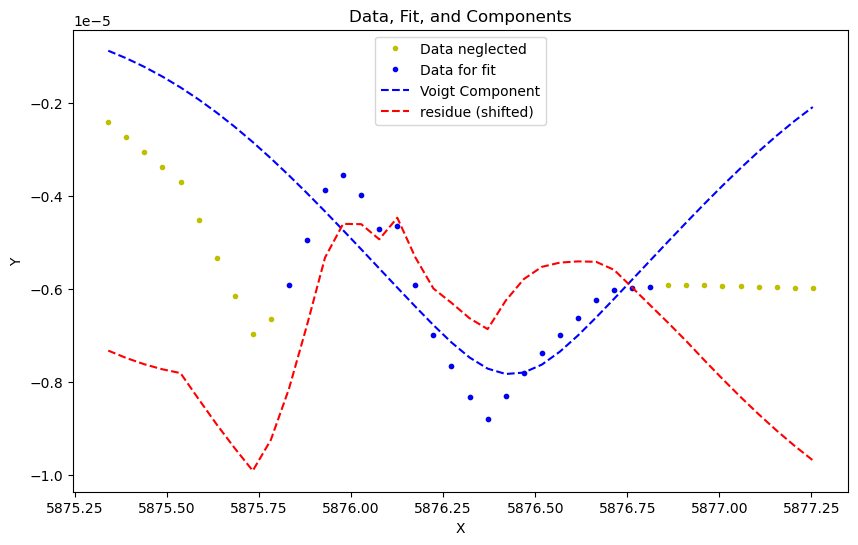

frame 6 at time 3.716666666666697 with param_fit[-1] = (array([-7.63143190e-06,  5.87629849e+03, -1.48538693e-01,  9.53347895e-01]), array([3.28043667e-07, 4.73394284e-02, 1.40231695e+00, 1.03706615e+00])). Here comes the plot:


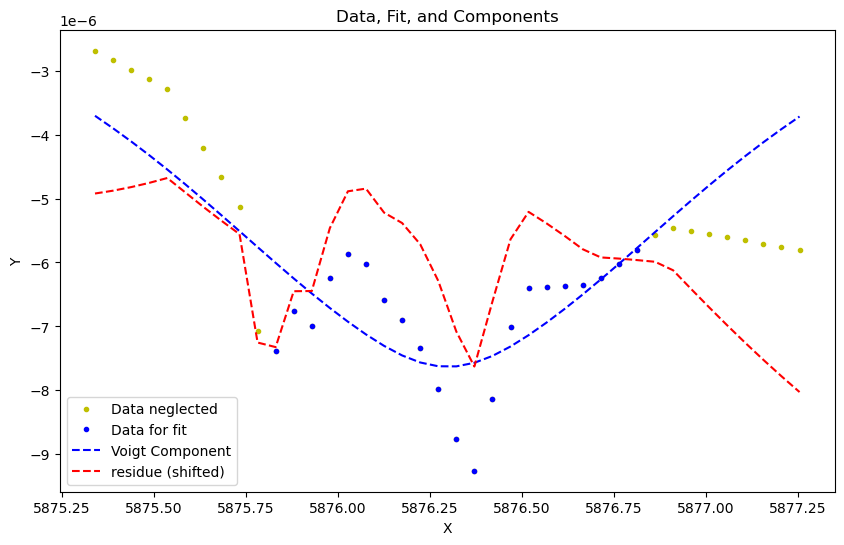

frame 8 at time 4.283333333333303 with param_fit[-1] = (array([-8.59853174e-06,  5.87625227e+03, -6.24524863e-01,  6.59457958e-04]), array([6.20169461e-05, 3.50615706e-02, 7.41477370e-02, 2.13549923e+03])). Here comes the plot:


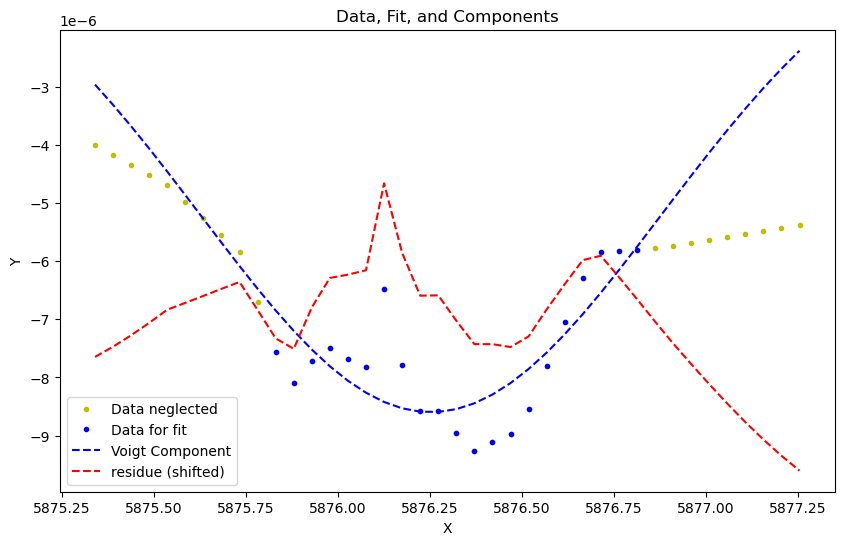

frame 10 at time 4.850000000000023 with param_fit[-1] = (array([-7.43563968e-06,  5.87610394e+03, -7.54029205e-01,  3.36544223e-01]), array([1.76184538e-07, 2.53227931e-02, 1.79233376e-01, 5.30810639e-01])). Here comes the plot:


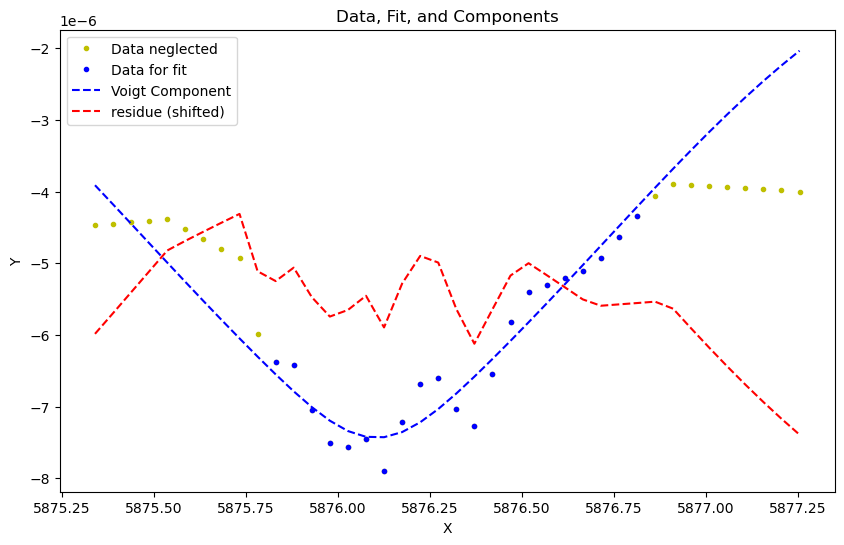

frame 12 at time 5.43333333333328 with param_fit[-1] = (array([-6.26674010e-06,  5.87623781e+03, -4.77025922e-01, -2.08997126e-01]), array([2.21308537e-07, 1.99301841e-02, 1.31618204e-01, 4.06151755e-01])). Here comes the plot:


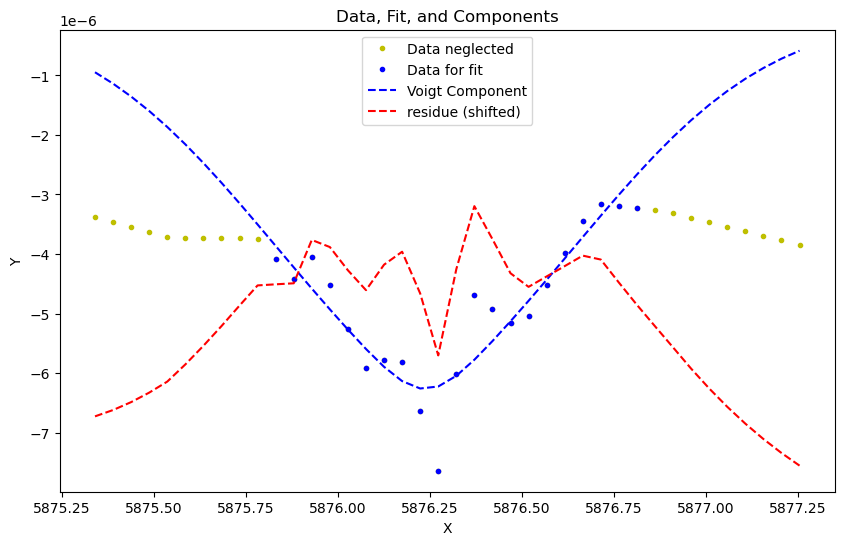

At frame 13 at time 5.716666666666697 the voigt fitting was not succesfull and average guess ([-7.74357903e-06  5.87620445e+03 -3.34483747e-01  1.18255971e-01]) is used as params and as std of params. 
frame 14 at time 6.0 with param_fit[-1] = (array([-3.14828187e-06,  5.87674432e+03,  2.90509735e-03,  1.15936207e-01]), array([1.06204893e-01, 2.00701465e-02, 7.80891162e+04, 3.09165116e-02])). Here comes the plot:


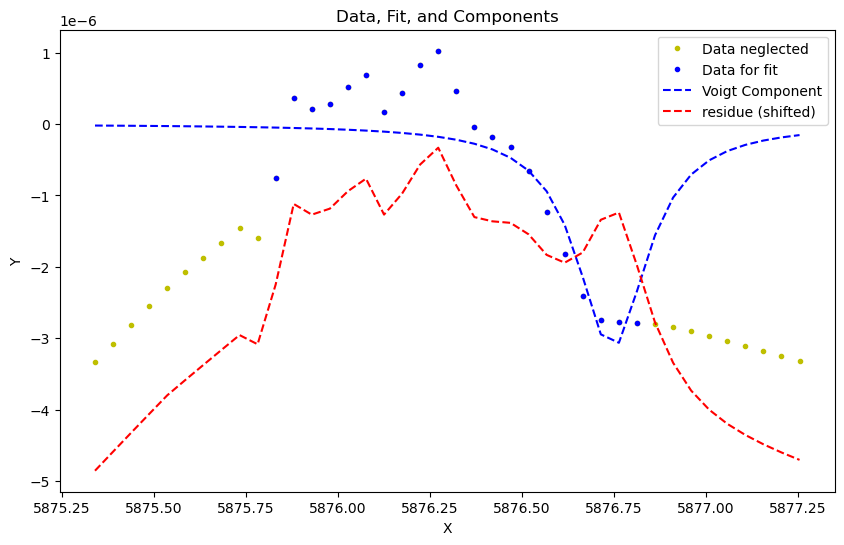

vmax = 3.1488057691184716e-05, vmin = -2.4471860324472134e-05


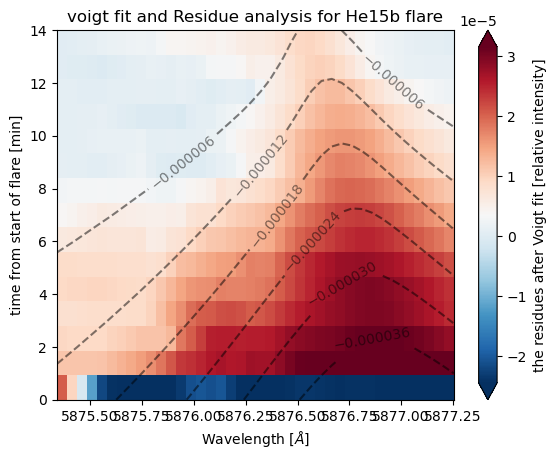

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [4]:
reload(un)
reload(un2)
reload(vf)
lines = [ "He15b"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) 
print(data["TIME_He15b"])
print(data.keys())
# un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':50, 'Hbeta':200,  "CaK":1, "CaK(2)":200,  "CaIR":50,  "Fe6173":500, "He":2}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-7.04217575e-06,  5.87645793e+03, -2.32074350e-01,  1.18592840e+00]}
lnp=[vf.exc_wings(9, -9), vf.exc_wings(10,-9),[], [], vf.exc_wings(10,-10)]
ofs = [-3.5e-6,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

dict_keys(['area_theta_CaIR22', 'FOV_CaIR22', 'quiet_sun_CaIR22', 'nessi_CaIR22', 'True_nessi_CaIR22', 'TIME_CaIR22'])
The average is 1.0000151812638085
frame 0 at time 9.866666666666674 with param_fit[-1] = (array([ 4.93284774e-04,  8.54216270e+03, -2.29088138e-01,  2.40654903e-01]), array([1.79864199e-05, 9.26418331e-03, 2.84309456e-02, 3.12752473e-02])). Here comes the plot:


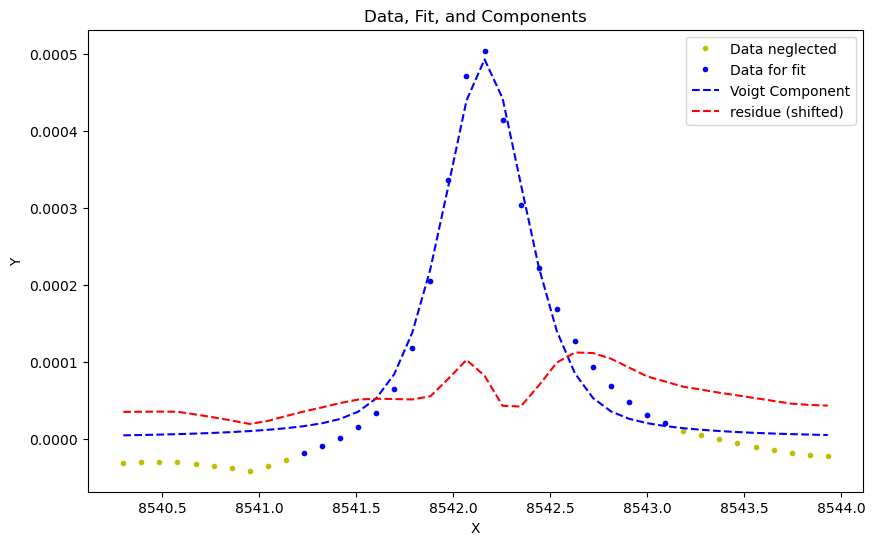

frame 50 at time 27.76666666666665 with param_fit[-1] = (array([1.49864356e-04, 8.54215754e+03, 1.94141037e-01, 1.80525498e-02]), array([9.00766720e-06, 8.63149605e-03, 9.75429920e-03, 8.95236317e-02])). Here comes the plot:


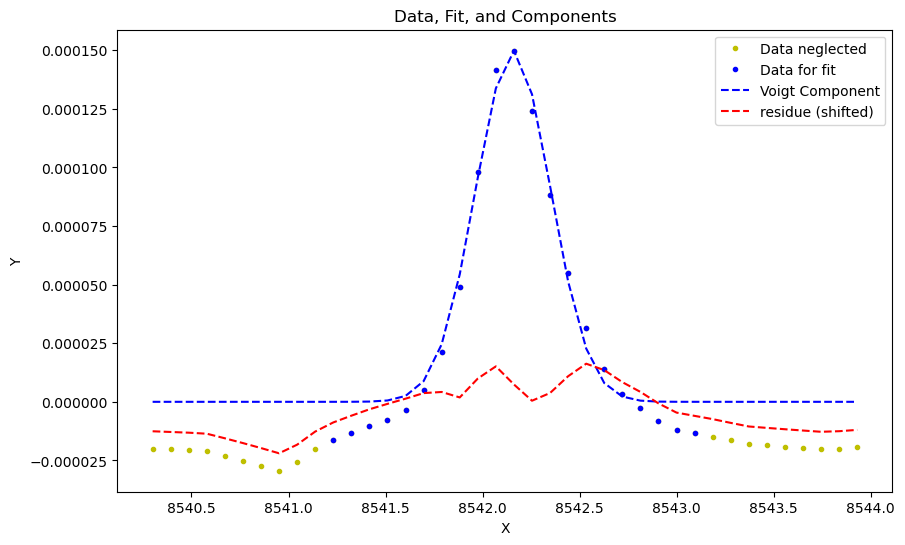

frame 100 at time 45.68333333333334 with param_fit[-1] = (array([ 7.47425771e-05,  8.54215602e+03,  1.96566221e-01, -7.28192991e-02]), array([3.20529124e-06, 7.36819947e-03, 1.12633521e-02, 5.52841004e-02])). Here comes the plot:


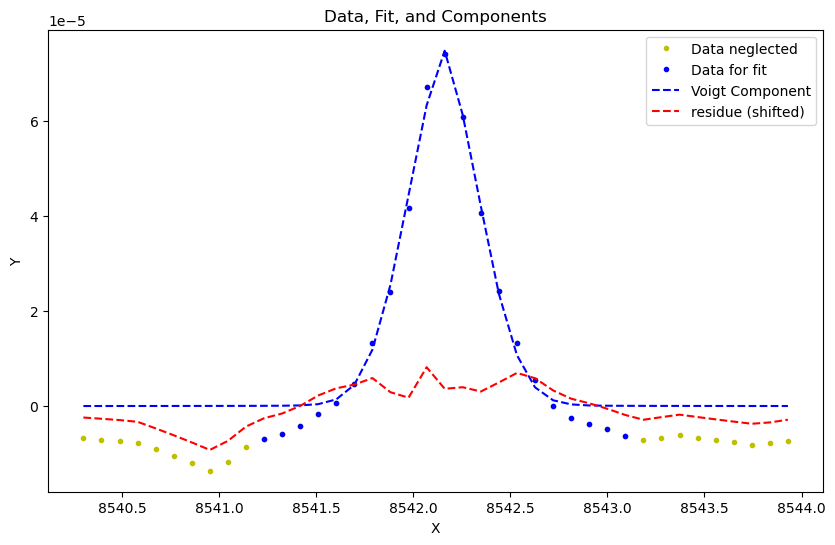

frame 150 at time 63.58333333333337 with param_fit[-1] = (array([-3.00426184e-05,  8.54208792e+03, -1.83936564e-01, -2.05397203e-01]), array([1.12492449e-06, 7.79475069e-03, 2.35818972e-02, 2.10912312e-02])). Here comes the plot:


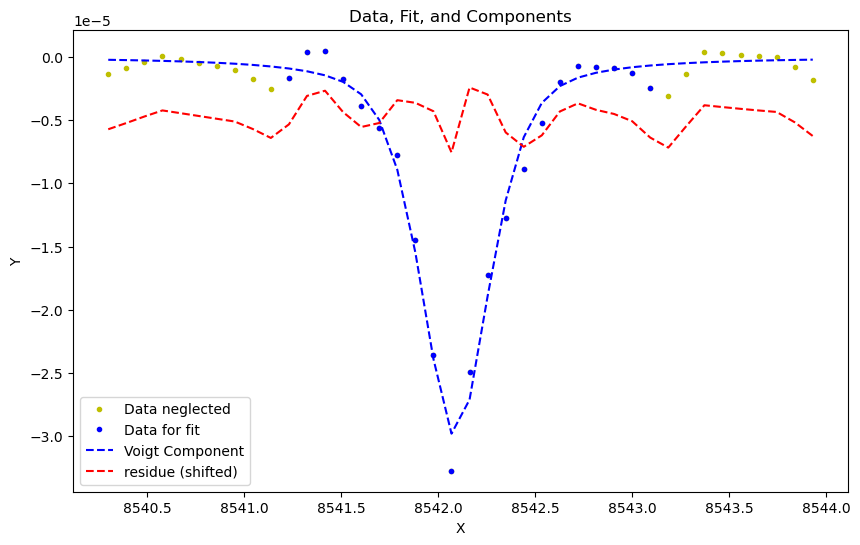

vmax = 2.2253239887451102e-05, vmin = -3.3272565719376254e-05


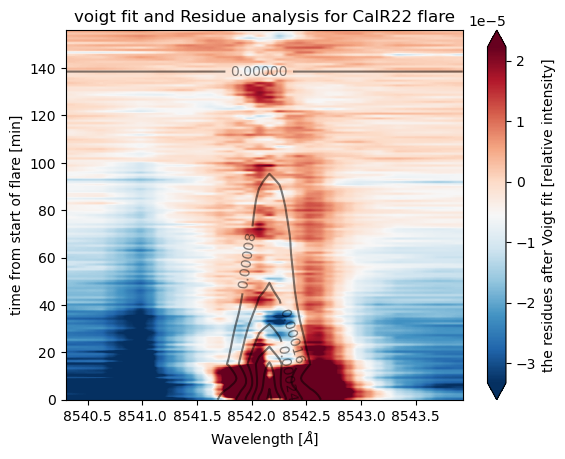

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [5]:
reload(un)
reload(un2)
reload(vf)
lines = [ "CaIR22"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())
# un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':50, 'Hbeta':200,  "CaK":1, "CaK(2)":200,  "CaIR":50,  "Fe6173":500, "He":20}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-8.41204361e-06,  5.87614596e+03, -1.10863891e-01,  8.69928093e-05]}
lnp=[vf.exc_wings(9, -9), vf.exc_wings(10,-9),[], [], vf.exc_wings(10,-10)]
ofs = [-3.5e-6,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

dict_keys(['area_theta_Ha23a', 'FOV_Ha23a', 'quiet_sun_Ha23a', 'nessi_Ha23a', 'True_nessi_Ha23a', 'TIME_Ha23a', 'area_theta_CaIR23a', 'FOV_CaIR23a', 'quiet_sun_CaIR23a', 'nessi_CaIR23a', 'True_nessi_CaIR23a', 'TIME_CaIR23a', 'area_theta_CaK(2)23a', 'FOV_CaK(2)23a', 'quiet_sun_CaK(2)23a', 'nessi_CaK(2)23a', 'True_nessi_CaK(2)23a', 'TIME_CaK(2)23a', 'area_theta_Hbeta23a', 'FOV_Hbeta23a', 'quiet_sun_Hbeta23a', 'nessi_Hbeta23a', 'True_nessi_Hbeta23a', 'TIME_Hbeta23a', 'area_theta_He23a', 'FOV_He23a', 'quiet_sun_He23a', 'nessi_He23a', 'True_nessi_He23a', 'TIME_He23a'])
The average is 1.0000042252241197
frame 0 at time 6.56666666666672 with param_fit[-1] = (array([7.66852514e-05, 6.56272122e+03, 3.14659081e-01, 4.96297650e-01]), array([1.69380164e-06, 9.19748754e-03, 4.46292432e-02, 1.64365384e-02])). Here comes the plot:


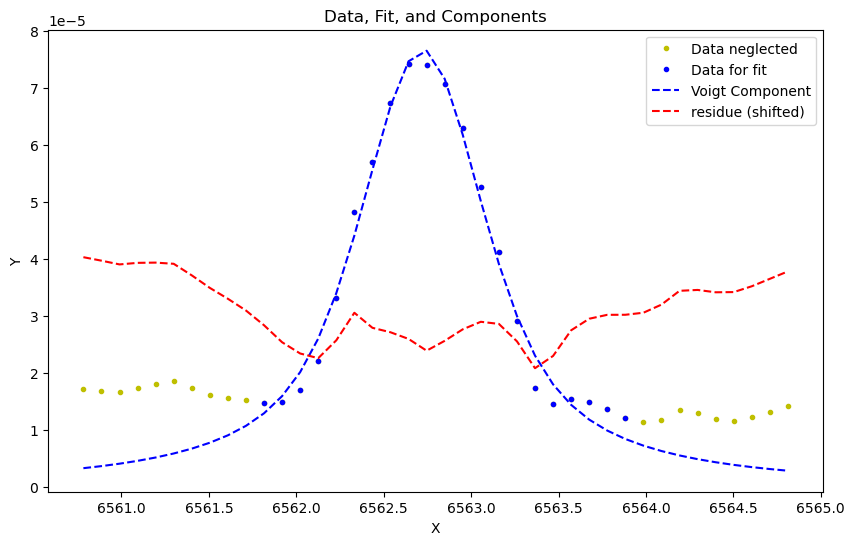

At frame 4 at time 10.133333333333326 the voigt fitting was not succesfull and average guess ([3.68291318e-05 6.56282628e+03 2.98056385e-01 1.89025879e-01]) is used as params and as std of params. 
vmax = 2.3986374826585538e-05, vmin = -2.45579560829697e-05


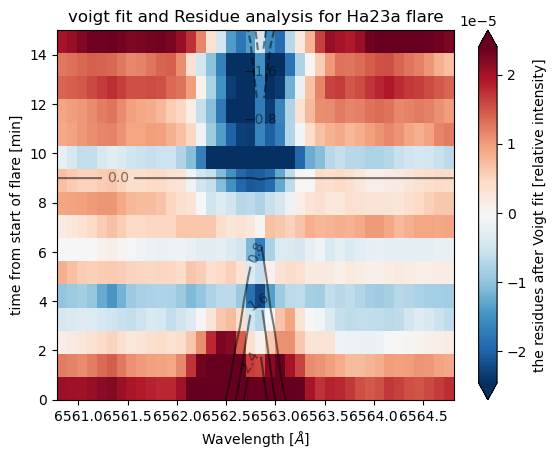

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0000013172883206
frame 0 at time 6.2333333333333485 with param_fit[-1] = (array([7.65343314e-05, 8.54208590e+03, 1.34746217e-01, 3.15253464e-01]), array([1.71814542e-06, 5.05127718e-03, 3.63819559e-02, 1.49988968e-02])). Here comes the plot:


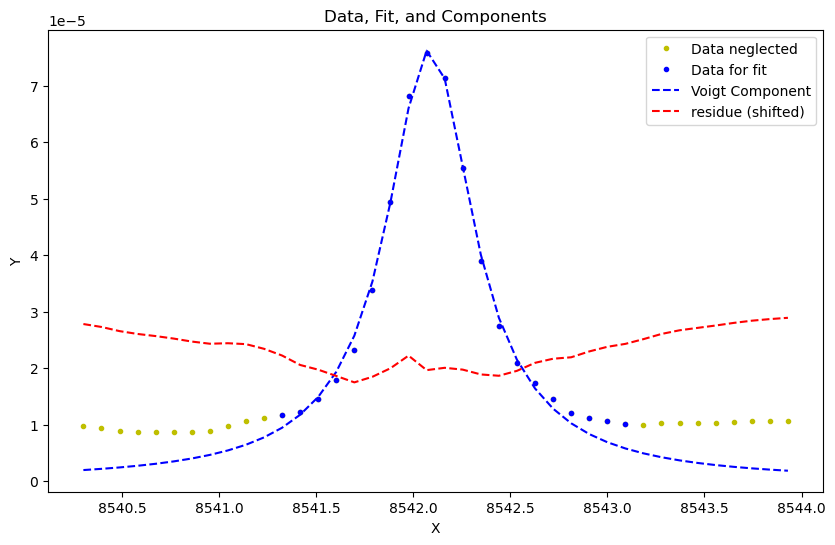

vmax = 1.4416586799425942e-05, vmin = -2.0189538535636366e-05


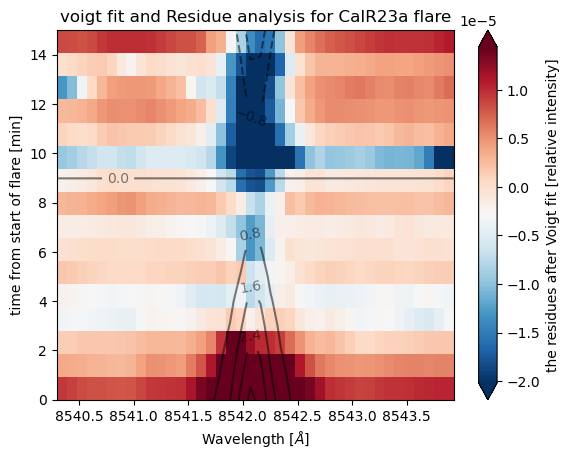

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0000068450405841
frame 0 at time 6.2000000000000455 with param_fit[-1] = (array([ 5.20843638e-04,  3.96848604e+03, -1.89412529e-01,  2.98148558e-01]), array([5.03800548e-06, 2.42788250e-03, 9.46378005e-03, 3.82290518e-03])). Here comes the plot:


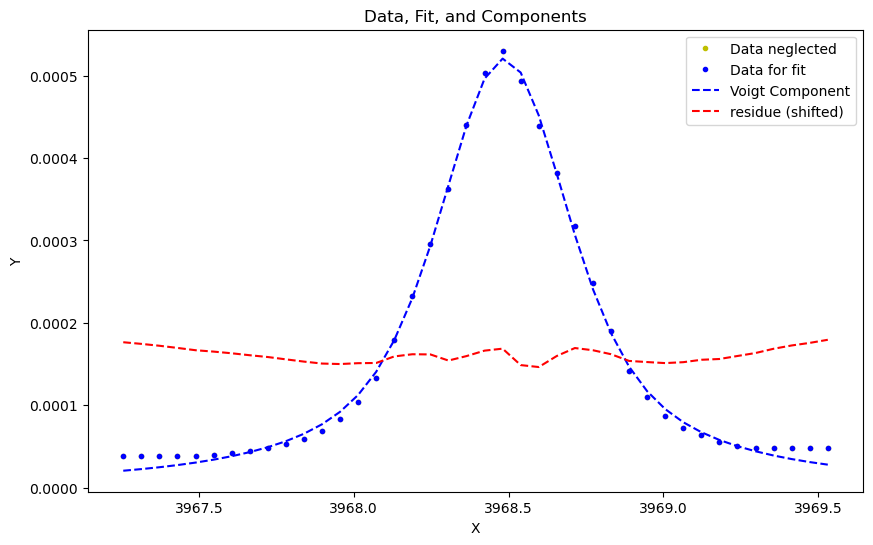

frame 20 at time 14.549999999999955 with param_fit[-1] = (array([-1.43617742e-04,  3.96848183e+03, -2.18070529e-01,  1.68903520e-01]), array([1.36420464e-06, 2.14962057e-03, 4.02548115e-03, 1.23570724e-02])). Here comes the plot:


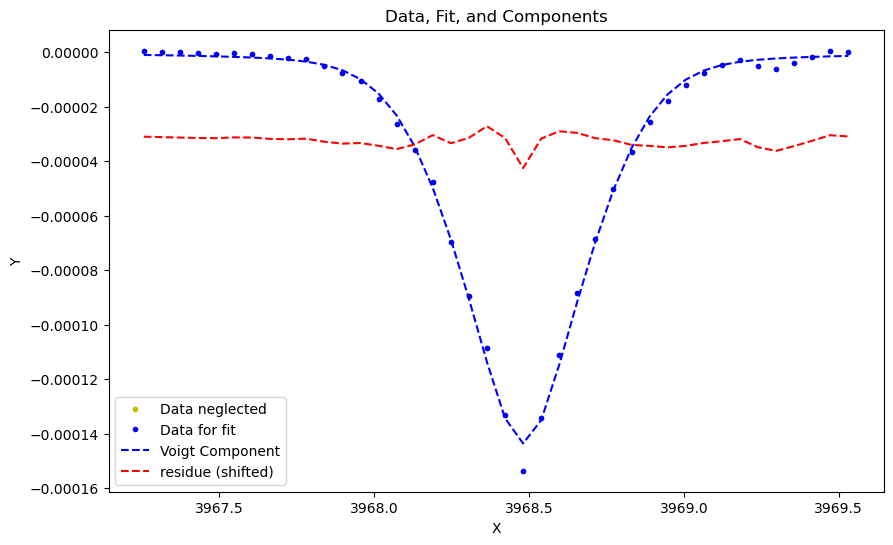

vmax = 5.500885106793924e-05, vmin = -5.9936287838695184e-05


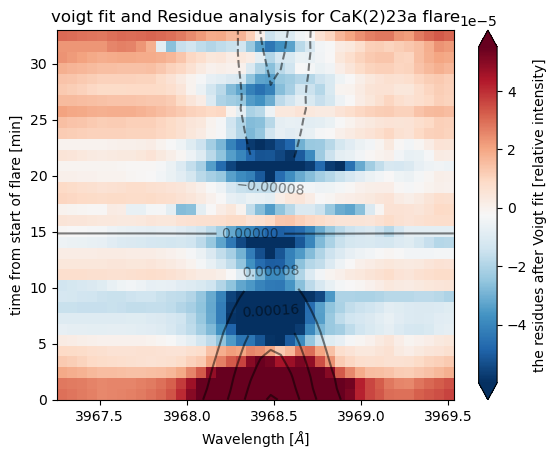

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0000077296971417
frame 0 at time 6.383333333333326 with param_fit[-1] = (array([1.28579124e-04, 4.86127536e+03, 1.39839804e-01, 3.73706591e-01]), array([4.69666571e-06, 9.26199237e-03, 9.23851851e-02, 3.98334129e-02])). Here comes the plot:


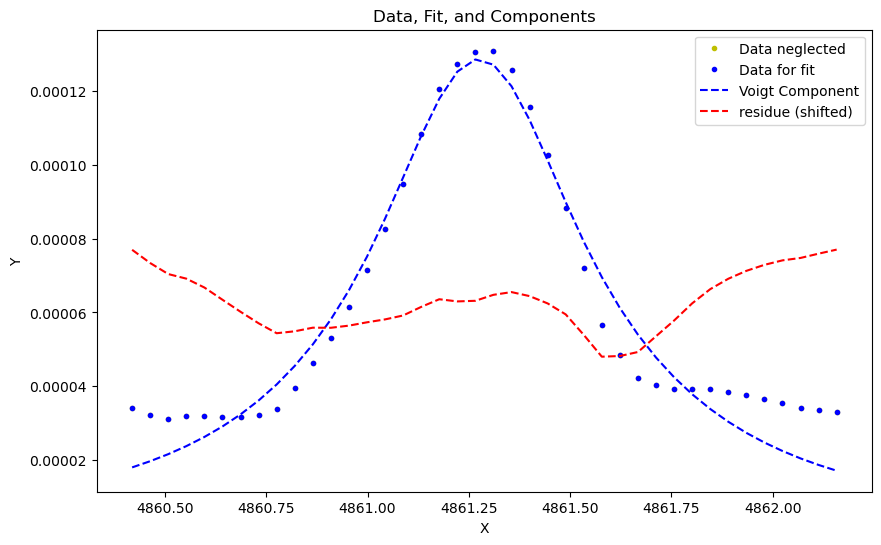

At frame 9 at time 10.133333333333326 the voigt fitting was not succesfull and average guess ([9.25684416e-02 4.86129717e+03 2.21461339e-01 1.17721342e-01]) is used as params and as std of params. 
At frame 12 at time 11.399999999999977 the voigt fitting was not succesfull and average guess ([9.25562567e-02 4.86122321e+03 2.86573968e-01 3.26010383e-01]) is used as params and as std of params. 
At frame 16 at time 13.049999999999955 the voigt fitting was not succesfull and average guess ([9.25423912e-02 4.86118442e+03 4.74805748e-01 4.96044414e-01]) is used as params and as std of params. 
vmax = 3.150452897733768e-05, vmin = -1.9092833164215915e-05


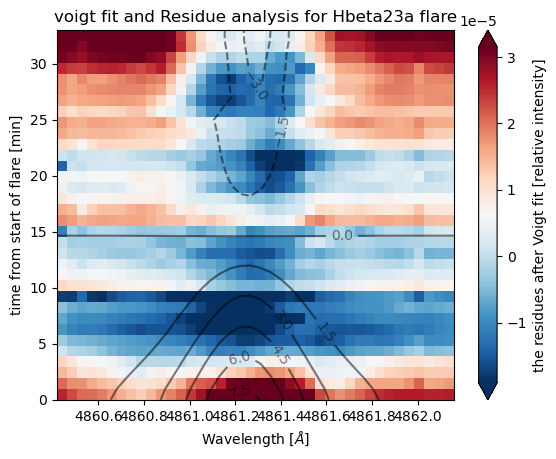

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0000084130765097
At frame 0 at time 6.7999999999999545 the voigt fitting was not succesfull and average guess ([-8.41204361e-06  5.87614596e+03 -1.10863891e-01  8.69928093e-05]) is used as params and as std of params. 
At frame 3 at time 9.483333333333348 the voigt fitting was not succesfull and average guess ([-6.63109859e-06  5.87656528e+03 -6.42347070e-01 -3.84377730e-01]) is used as params and as std of params. 
frame 5 at time 11.266666666666652 with par

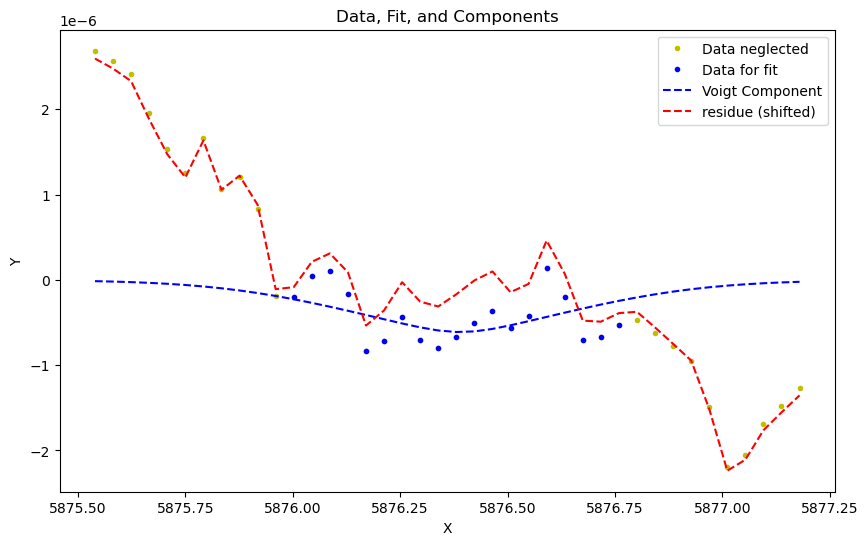

At frame 7 at time 13.049999999999955 the voigt fitting was not succesfull and average guess ([-6.39964088e-06  5.87697556e+03 -6.82673163e-01 -4.02797490e-01]) is used as params and as std of params. 
frame 10 at time 15.733333333333348 with param_fit[-1] = (array([ 6.71063468e-06,  5.87650229e+03,  3.48896419e-01, -4.36845440e-01]), array([6.12651309e-07, 4.64863150e-02, 3.13176438e+00, 3.06649065e+00])). Here comes the plot:


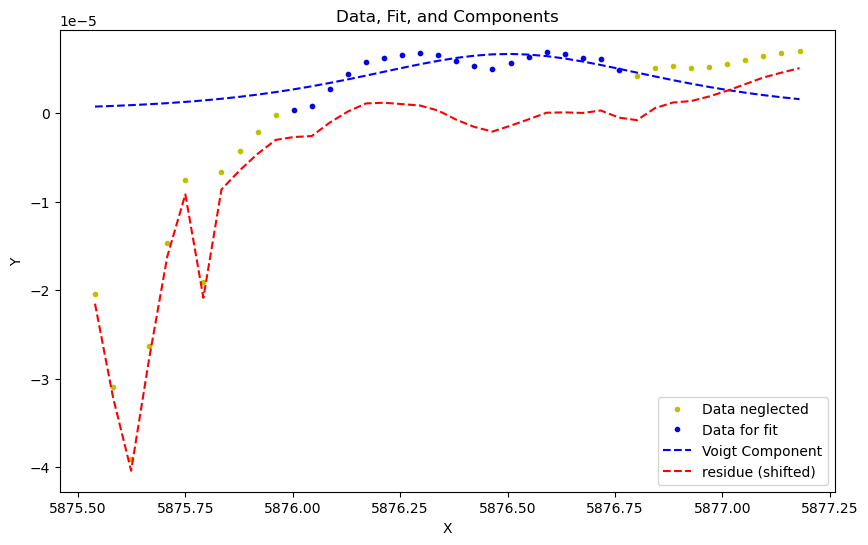

frame 15 at time 20.216666666666697 with param_fit[-1] = (array([ 3.53865451e-05,  5.87623045e+03, -9.79383814e-01,  3.12148609e-01]), array([4.29063320e-07, 2.12862423e-02, 3.23066470e-01, 4.76841392e-01])). Here comes the plot:


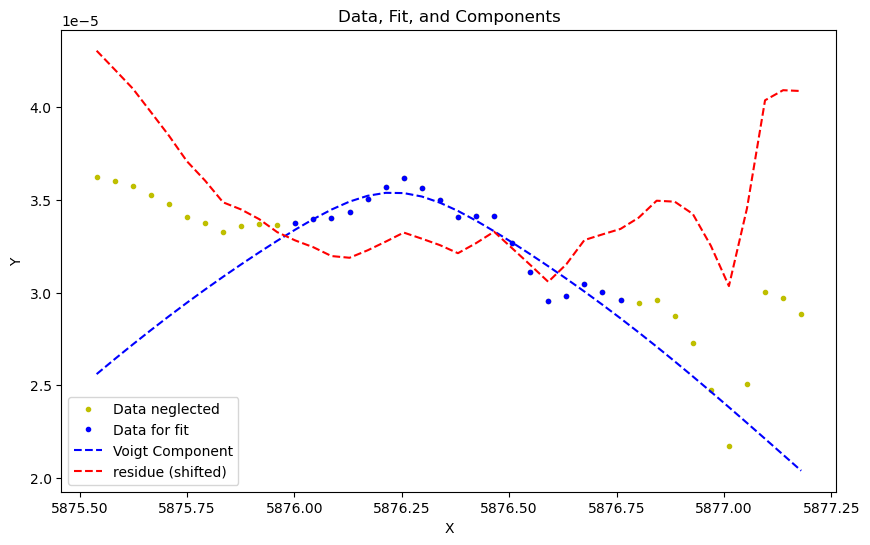

vmax = 1.5451908993914324e-05, vmin = -1.2633841865703381e-05


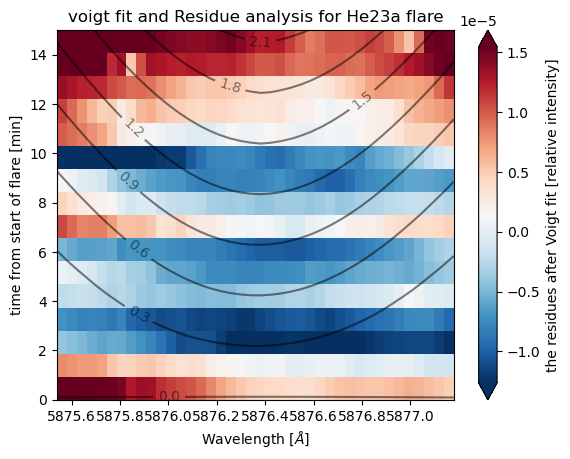

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [7]:
reload(un)
reload(un2)
reload(vf)
lines = ["Ha23a", "CaIR23a", "CaK(2)23a", "Hbeta23a", "He23a"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())
un2.disgard_cont_point("CaK(2)23a", data)

plot_rates = {'Ha':50, 'Hbeta':200,  "CaK":1, "CaK(2)":20,  "CaIR":50,  "Fe6173":500, "He":5}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-8.41204361e-06,  5.87614596e+03, -1.10863891e-01,  8.69928093e-05]}
lnp=[vf.exc_wings(9, -9), vf.exc_wings(10,-9),[], [], vf.exc_wings(10,-10)]
ofs = [-3.5e-6,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

dict_keys(['area_theta_Fe21', 'FOV_Fe21', 'quiet_sun_Fe21', 'nessi_Fe21', 'True_nessi_Fe21', 'TIME_Fe21', 'area_theta_CaIR21', 'FOV_CaIR21', 'quiet_sun_CaIR21', 'nessi_CaIR21', 'True_nessi_CaIR21', 'TIME_CaIR21', 'area_theta_CaK21', 'FOV_CaK21', 'quiet_sun_CaK21', 'nessi_CaK21', 'True_nessi_CaK21', 'TIME_CaK21'])
Assuming that Fe21 is spectral line Fe6173.
The average is 0.9999964604557852
frame 0 at time 2.8833333333333258 with param_fit[-1] = (array([-1.12499673e-05,  6.17310478e+03,  7.97972276e-02, -2.40908541e-01]), array([1.27899952e-05, 7.02035756e-01, 1.18448677e+00, 9.38927249e-01])). Here comes the plot:


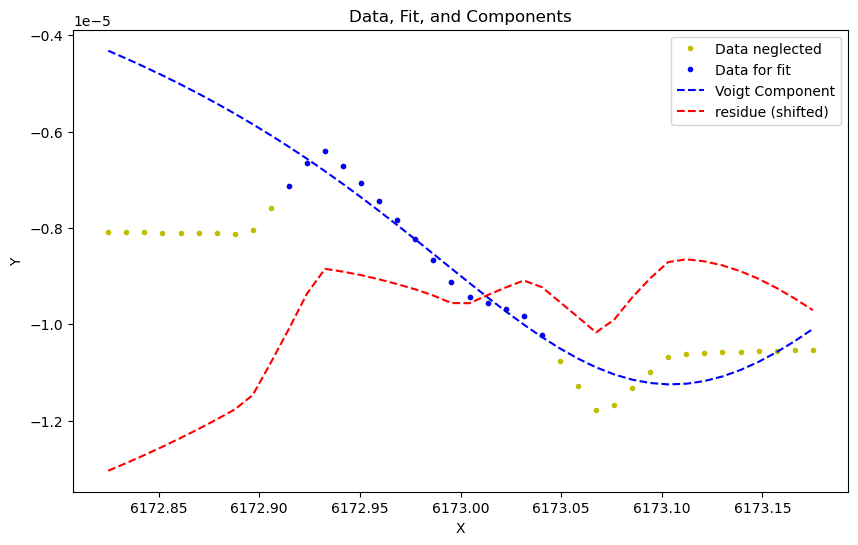

At frame 1 at time 3.2000000000000455 the voigt fitting was not succesfull and average guess ([-3.55953227e-06  6.17304769e+03 -3.78223407e-02 -9.91551979e-02]) is used as params and as std of params. 
At frame 2 at time 3.5166666666666515 the voigt fitting was not succesfull and average guess ([-6.12301060e-06  6.17306672e+03  1.38418210e-03 -1.46406312e-01]) is used as params and as std of params. 
At frame 3 at time 3.8333333333333712 the voigt fitting was not succesfull and average guess ([-7.40474977e-06  6.17307623e+03  2.09874435e-02 -1.70031869e-01]) is used as params and as std of params. 
At frame 5 at time 4.4833333333333485 the voigt fitting was not succesfull and average guess ([-8.76256908e-06  6.17306390e+03  2.32894821e-02 -2.09343839e-01]) is used as params and as std of params. 
At frame 7 at time 5.116666666666674 the voigt fitting was not succesfull and average guess ([-8.53964088e-06  6.17301997e+03  1.03055819e-02 -1.79129580e-01]) is used as params and as std of 

e:\solar flares\data\voigt_fitting\voigt_fit.py:42: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(voigt, x_data, y_data, p0=initial_guess)


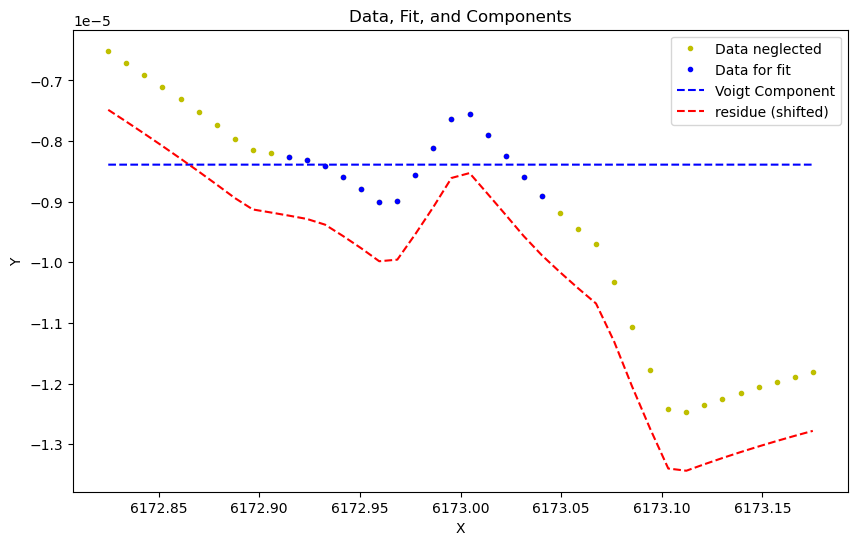

frame 40 at time 15.666666666666629 with param_fit[-1] = (array([-1.70278811e-03, -3.70261118e+05,  1.11357335e+05,  2.42824728e+04]), array([3.54433480e+04, 7.47822872e+11, 2.88763472e+11, 4.05958869e+11])). Here comes the plot:


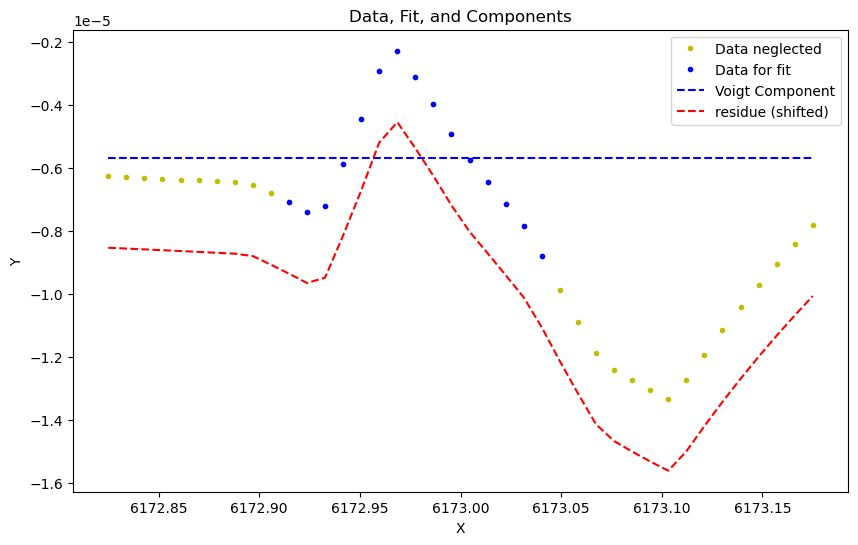

At frame 41 at time 15.983333333333348 the voigt fitting was not succesfull and average guess ([ 1.59535724e-03 -3.73171958e+05  9.72734528e+04 -9.71521467e+03]) is used as params and as std of params. 
frame 50 at time 18.866666666666674 with param_fit[-1] = (array([ 1.24933094e-05, -1.06673785e+06, -9.20297943e+05,  8.61024256e+04]), array([4.06833647e+01, 4.72002857e+12, 2.04454000e+12, 1.43789253e+12])). Here comes the plot:


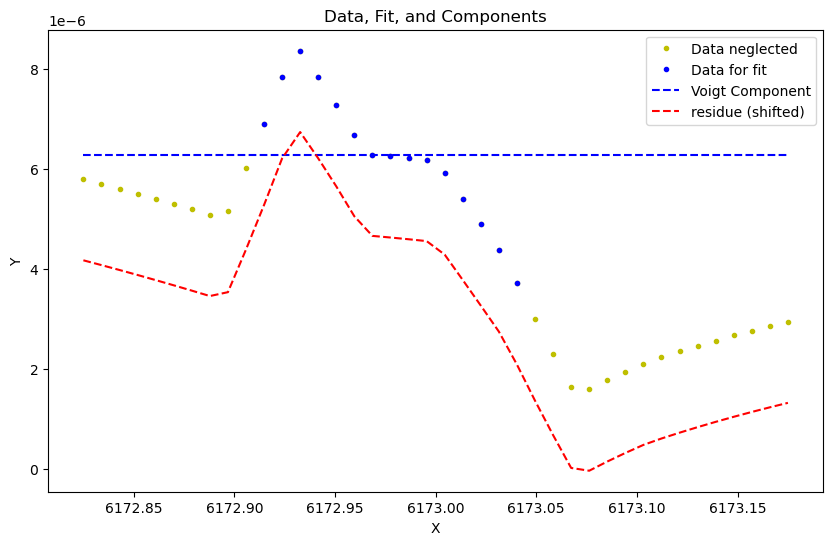

frame 60 at time 22.06666666666672 with param_fit[-1] = (array([ 2.90622843e-06, -7.78112769e+16, -4.91629424e+21, -5.33028305e+19]), array([inf, inf, inf, inf])). Here comes the plot:


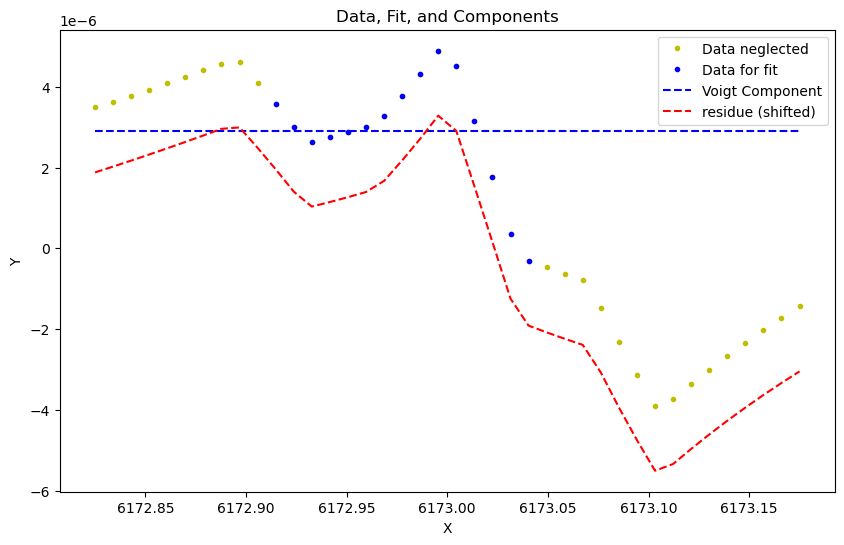

frame 70 at time 25.25 with param_fit[-1] = (array([ 9.32106090e-07,  8.14929642e+24, -3.21996888e+21, -3.49126246e+19]), array([inf, inf, inf, inf])). Here comes the plot:


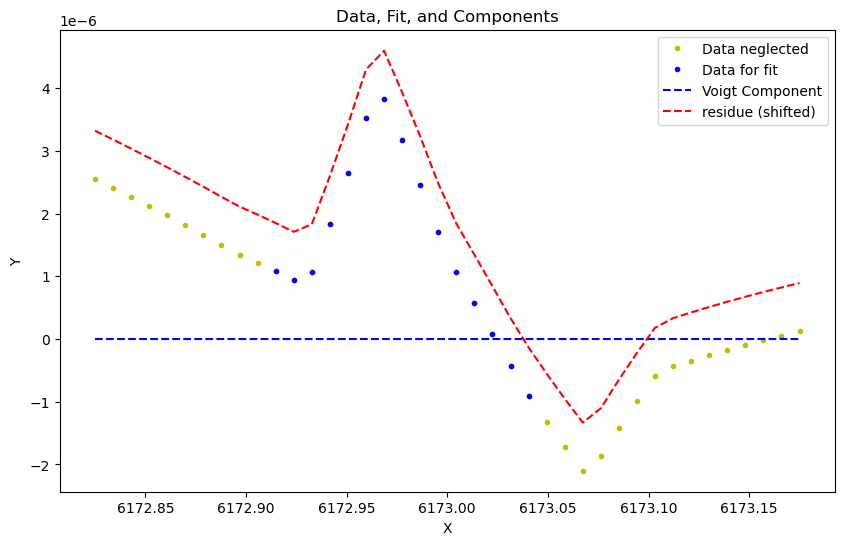

frame 80 at time 28.450000000000045 with param_fit[-1] = (array([ 2.44436835e-06,  4.31799795e+24, -1.76523703e+21, -1.91396512e+19]), array([inf, inf, inf, inf])). Here comes the plot:


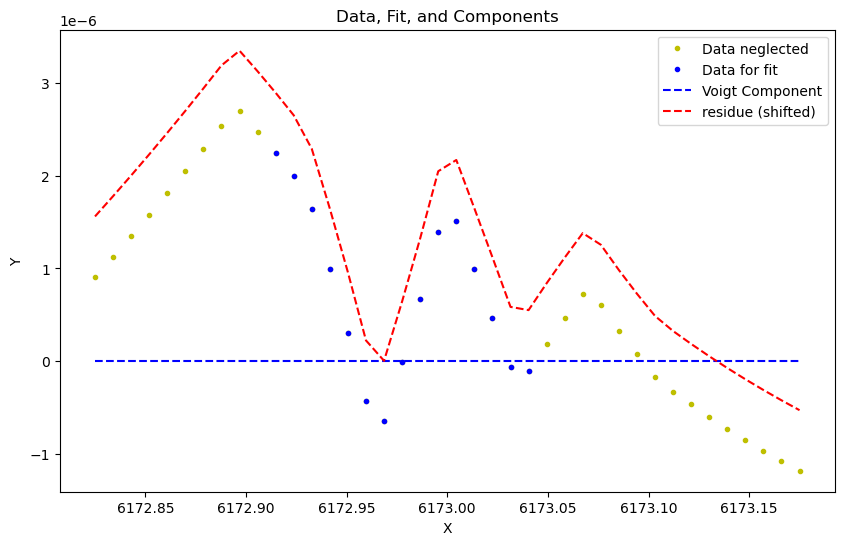

vmax = 0.005004942130906483, vmin = -0.00027595248009651337


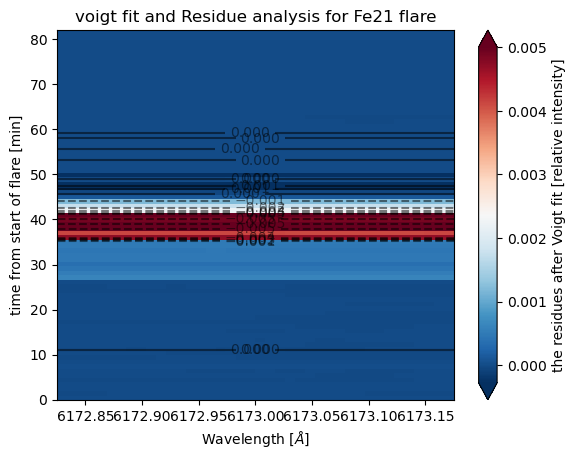

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.000015616075257
frame 0 at time 2.966666666666697 with param_fit[-1] = (array([9.07000042e-05, 8.54218941e+03, 1.83912390e-01, 9.73886549e-03]), array([4.60724073e-06, 5.23386914e-03, 5.58704692e-03, 1.05770902e-01])). Here comes the plot:


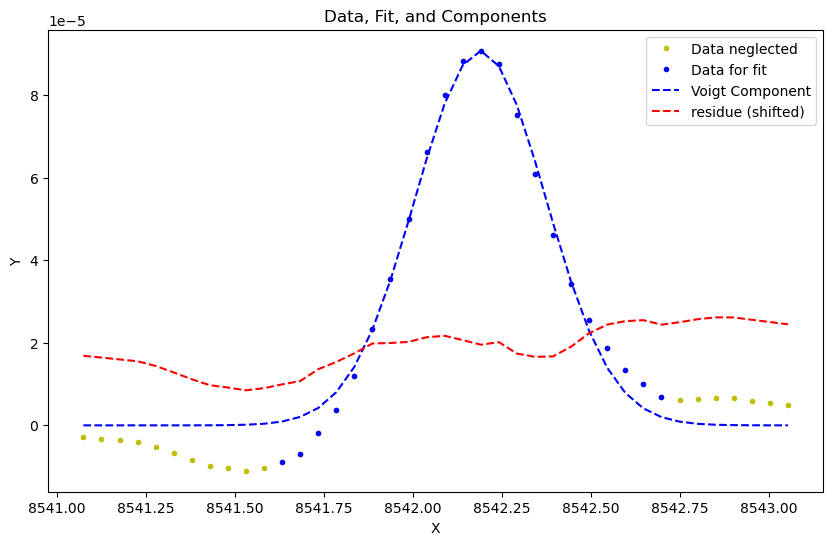

frame 50 at time 18.950000000000045 with param_fit[-1] = (array([ 4.21382724e-05,  8.54222737e+03,  1.78867262e-01, -1.15050189e-01]), array([8.92710460e-07, 3.88739457e-03, 5.10801133e-03, 3.80746225e-02])). Here comes the plot:


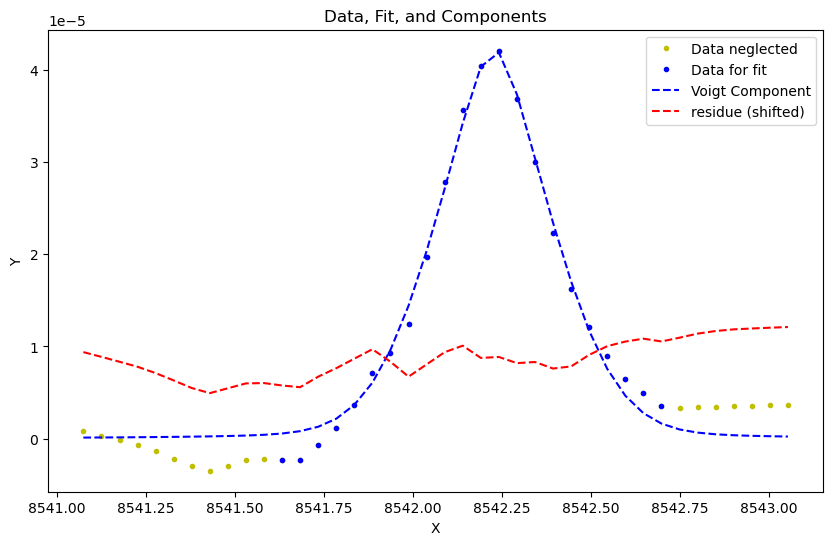

vmax = 1.897493178552735e-05, vmin = -1.3107697525746594e-05


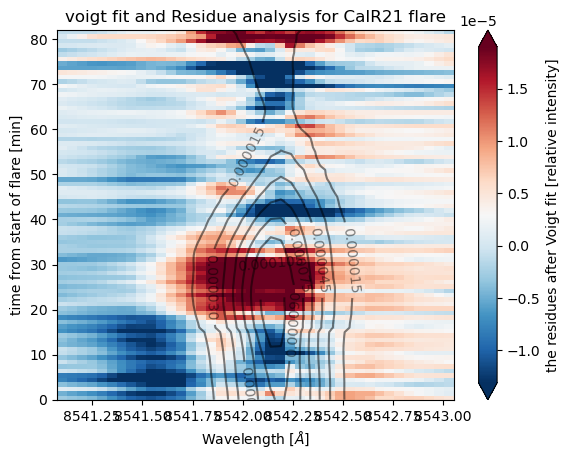

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0001521024265423
frame 0 at time 9.616666666666674 with param_fit[-1] = (array([2.11518081e-03, 3.93369838e+03, 1.05414484e-01, 2.95960494e-01]), array([1.22516282e-04, 1.16850282e-02, 1.31033559e-01, 5.63001924e-02])). Here comes the plot:


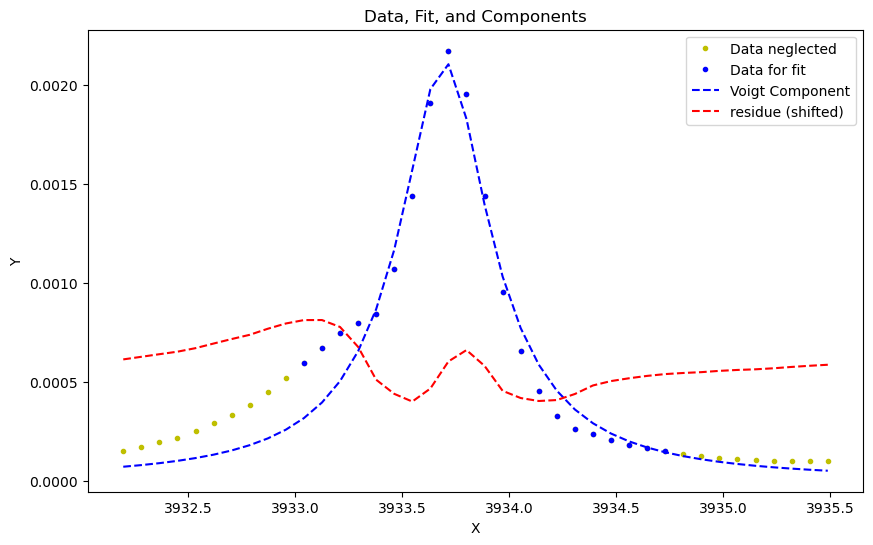

frame 50 at time 15.666666666666629 with param_fit[-1] = (array([ 7.21509548e-04,  3.93371145e+03,  1.32315798e-01, -5.54628698e-05]), array([5.57347328e-03, 8.43453855e-03, 6.92868469e-03, 1.25539317e+03])). Here comes the plot:


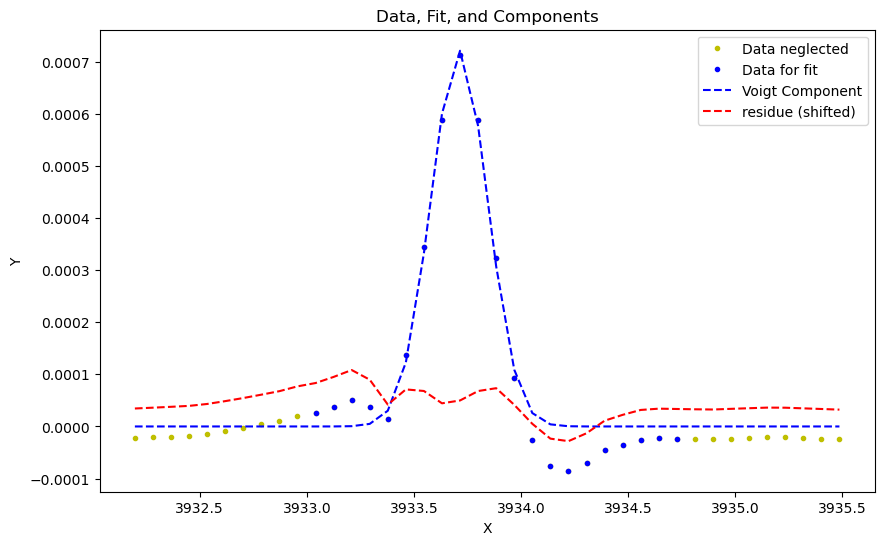

frame 100 at time 21.76666666666665 with param_fit[-1] = (array([4.33619917e-04, 3.93374653e+03, 1.11769800e-01, 2.85971541e-01]), array([2.46015453e-05, 1.11842698e-02, 1.00197792e-01, 4.24328421e-02])). Here comes the plot:


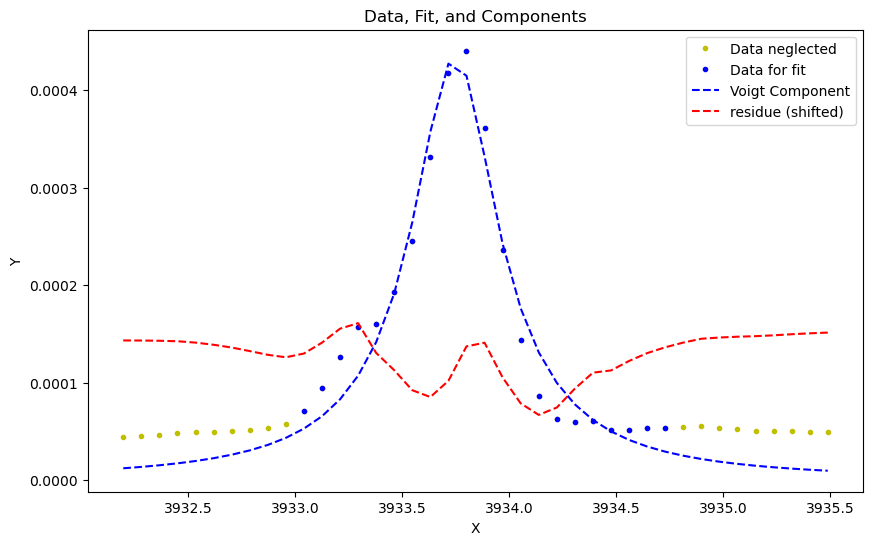

At frame 135 at time 26.033333333333303 the voigt fitting was not succesfull and average guess ([3.24088327e-04 3.93371630e+03 2.33157258e-02 1.86507655e-01]) is used as params and as std of params. 
frame 150 at time 27.83333333333337 with param_fit[-1] = (array([3.23441464e-04, 3.93370831e+03, 1.60127413e-03, 2.08463279e-01]), array([4.95177945e-02, 5.33179731e-03, 2.07794485e+03, 8.99508969e-03])). Here comes the plot:


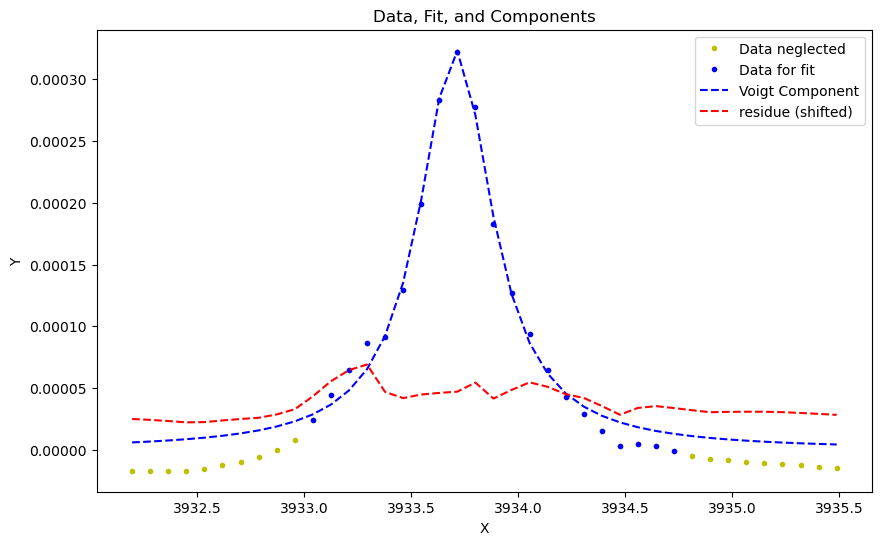

At frame 154 at time 28.31666666666672 the voigt fitting was not succesfull and average guess ([6.33042180e-04 3.93369835e+03 5.36224931e-02 1.71690073e-01]) is used as params and as std of params. 
vmax = 0.00025174296102865125, vmin = -0.0001853336503796701


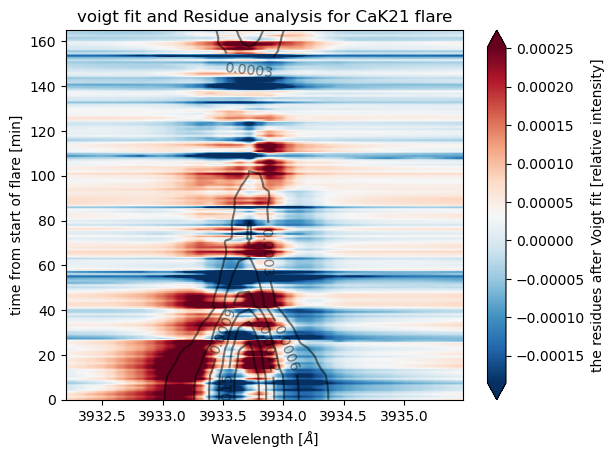

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [10]:
reload(un)
reload(un2)
reload(vf)
lines = ["Fe21", "CaIR21", "CaK21"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())
un2.disgard_cont_point("CaK21", data)

plot_rates = {'Ha':30, 'Hbeta':200,  "CaK":50, "CaK(2)":200,  "CaIR":50,  "Fe6173":10, "He":20}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[0.002, 3933.6, 2.70645889e-01, 1.09656846e-02], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-06, 6.1729906e+03, -1.55441909e-01, 4.25981451e-02],
                   "He":[-8.41204361e-06,  5.87614596e+03, -1.10863891e-01,  8.69928093e-05]}
lnp=[vf.exc_wings(9, -15), vf.exc_wings(10,-7), vf.exc_wings(9,-9), [], vf.exc_wings(10,-10)]
ofs = [0,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

The average is 0.9999964604557852
frame 0 at time 2.8833333333333258 with param_fit[-1] = (array([-2.51311364e-06,  6.17304806e+03,  3.40206971e-02,  7.08281530e-03]), array([7.07142846e-07, 7.08689568e-02, 2.81002821e-02, 1.40862592e-01])). Here comes the plot:


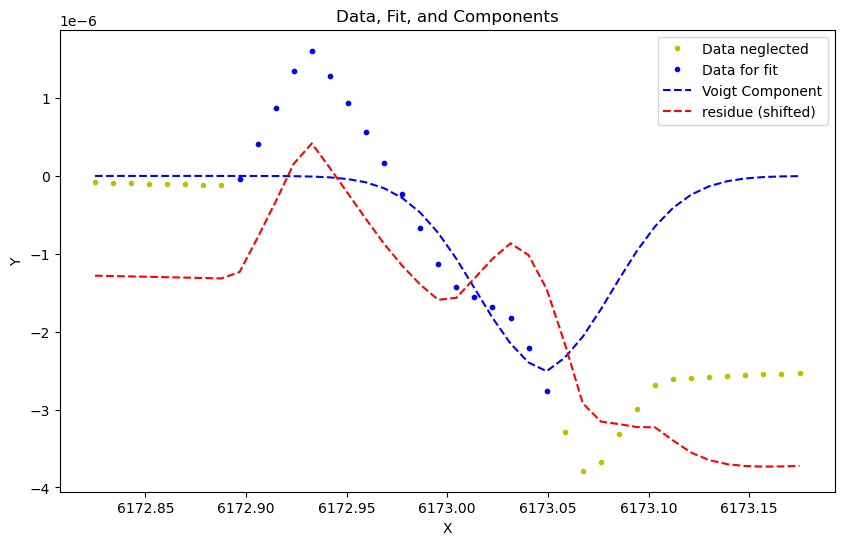

At frame 1 at time 3.2000000000000455 the voigt fitting was not succesfull and average guess ([ 8.08894544e-07  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
At frame 2 at time 3.5166666666666515 the voigt fitting was not succesfull and average guess ([-2.98441518e-07  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
At frame 5 at time 4.4833333333333485 the voigt fitting was not succesfull and average guess ([-3.82428852e-07  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
At frame 9 at time 5.75 the voigt fitting was not succesfull and average guess ([ 9.43523671e-07  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
At frame 10 at time 6.083333333333371 the voigt fitting was not succesfull and average guess ([ 2.86805483e-06  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
At f

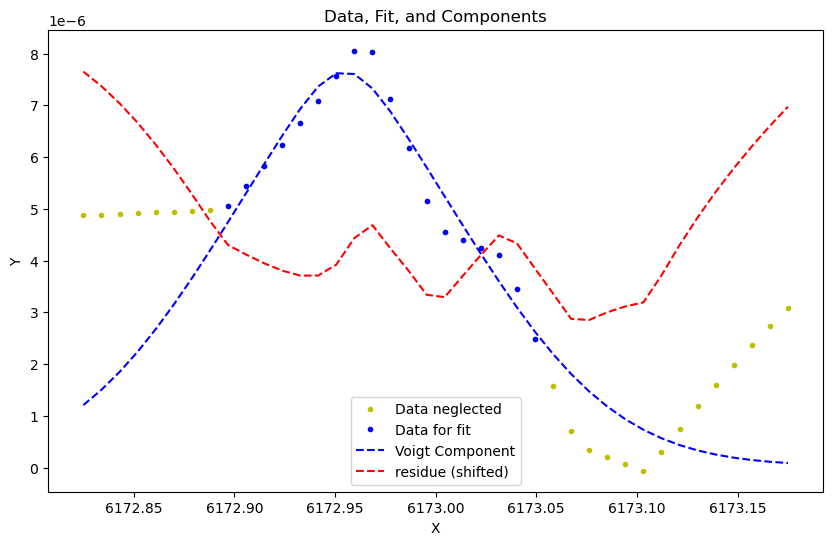

At frame 24 at time 10.549999999999955 the voigt fitting was not succesfull and average guess ([ 5.12961794e-06  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
frame 25 at time 10.866666666666674 with param_fit[-1] = (array([ 1.92584875e-06,  6.17298786e+03, -1.76405675e-02,  2.77597822e-06]), array([4.27133132e-06, 5.90929905e-03, 5.77992845e-03, 1.35804780e+02])). Here comes the plot:


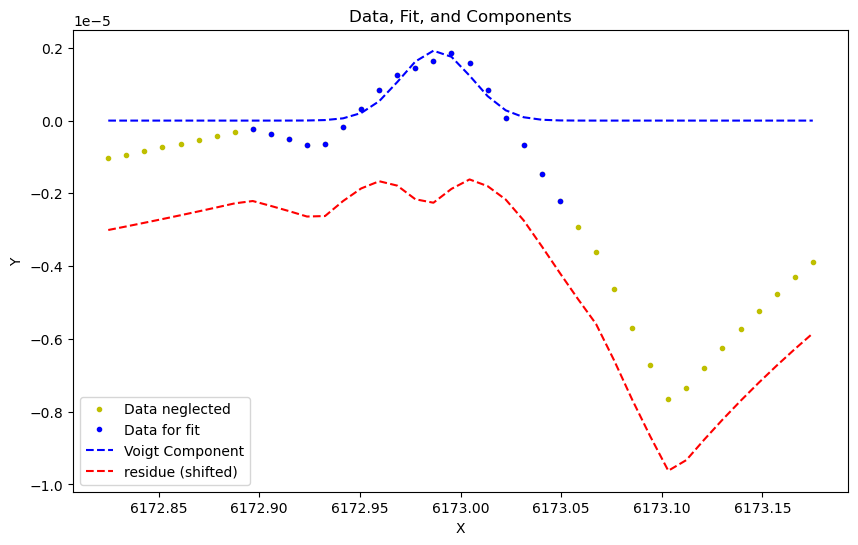

At frame 30 at time 12.466666666666697 the voigt fitting was not succesfull and average guess ([ 5.32710331e-06  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
frame 35 at time 14.06666666666672 with param_fit[-1] = (array([4.62852859e-06, 6.17295044e+03, 3.52787934e-02, 5.92707305e-05]), array([3.61075966e-06, 2.20215869e-03, 2.50997527e-03, 8.46545779e+00])). Here comes the plot:


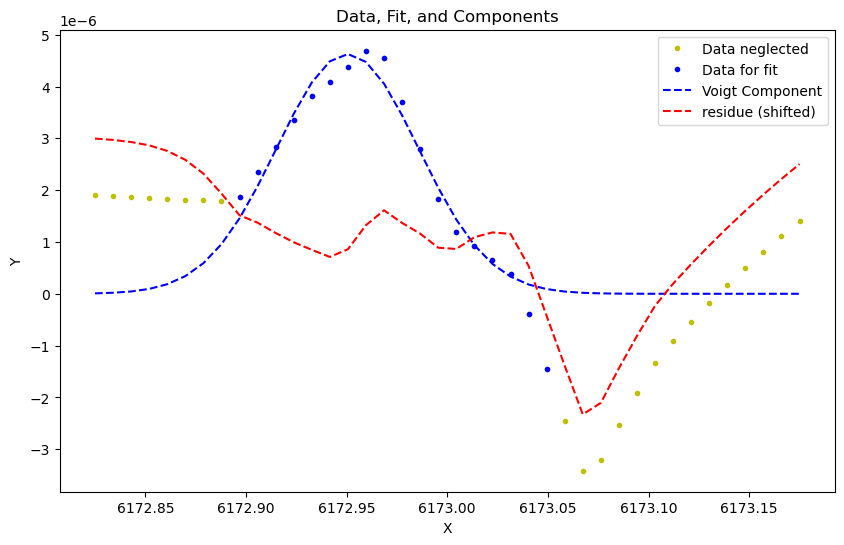

frame 40 at time 15.666666666666629 with param_fit[-1] = (array([ 5.62348907e-06,  6.17297105e+03, -2.51657561e-02,  1.49993081e-02]), array([4.96561758e-07, 2.29956681e-03, 2.73372519e-03, 2.21659595e-02])). Here comes the plot:


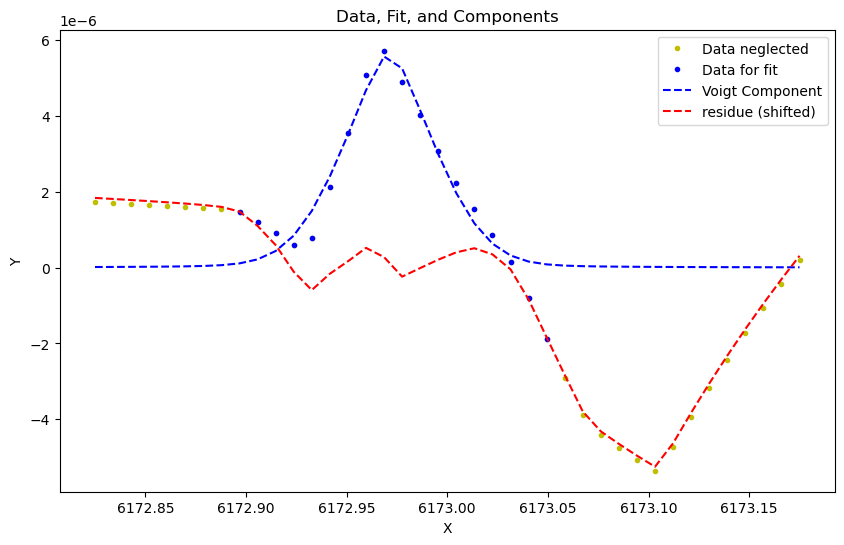

At frame 42 at time 16.299999999999955 the voigt fitting was not succesfull and average guess ([ 7.96225958e-06  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
frame 45 at time 17.26666666666665 with param_fit[-1] = (array([ 6.95798973e-06,  6.17300476e+03, -1.35172437e-02,  3.53148732e-02]), array([5.64566868e-07, 2.00458334e-03, 1.87486087e-02, 7.89959679e-03])). Here comes the plot:


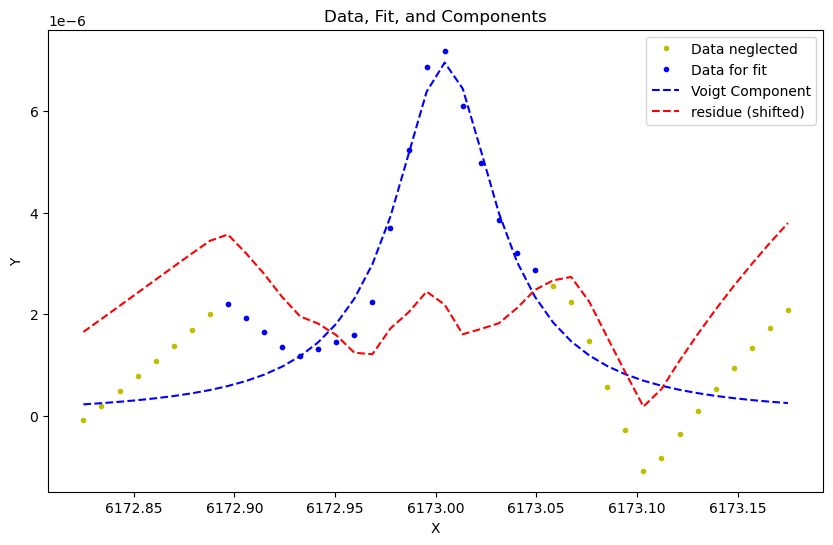

frame 50 at time 18.866666666666674 with param_fit[-1] = (array([ 1.54865325e-05,  6.17294409e+03,  1.43024231e-01, -3.69602757e-02]), array([2.06350211e-07, 4.64430753e-03, 3.11135442e-02, 4.59049768e-02])). Here comes the plot:


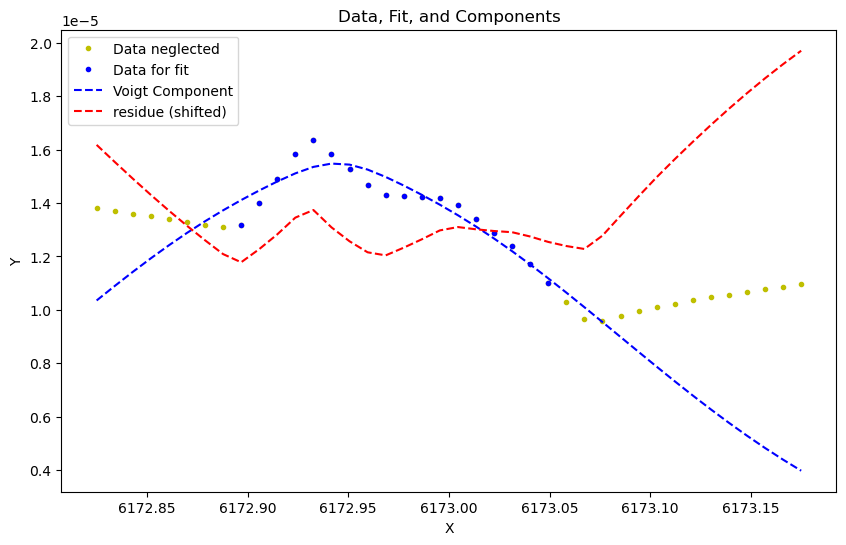

frame 55 at time 20.466666666666697 with param_fit[-1] = (array([ 1.76363353e-05,  6.17297613e+03,  1.07035144e-01, -3.93828135e-02]), array([3.69656677e-07, 2.13841804e-03, 4.06543288e-02, 7.76776859e-02])). Here comes the plot:


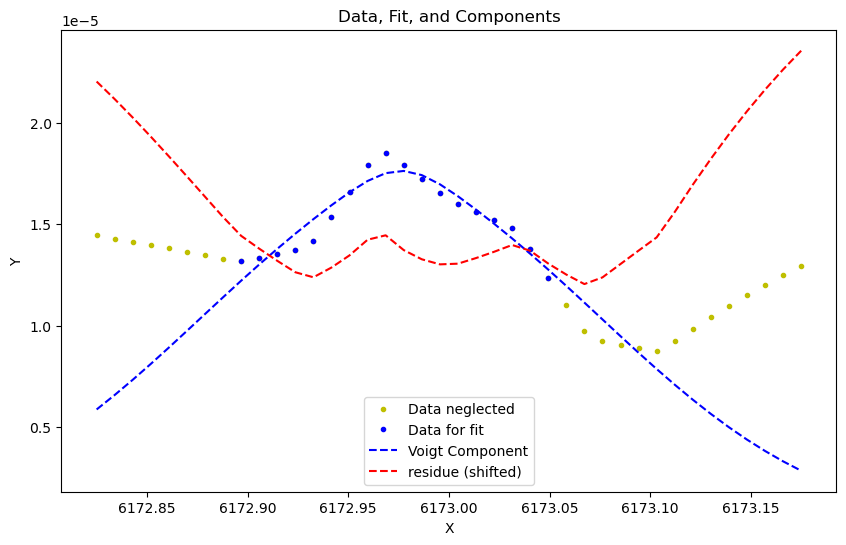

frame 60 at time 22.06666666666672 with param_fit[-1] = (array([ 1.19116003e-05,  6.17294406e+03, -1.15568038e-01,  1.76433576e-01]), array([4.37431761e-07, 1.54355963e-02, 8.45900409e+00, 5.66238357e+00])). Here comes the plot:


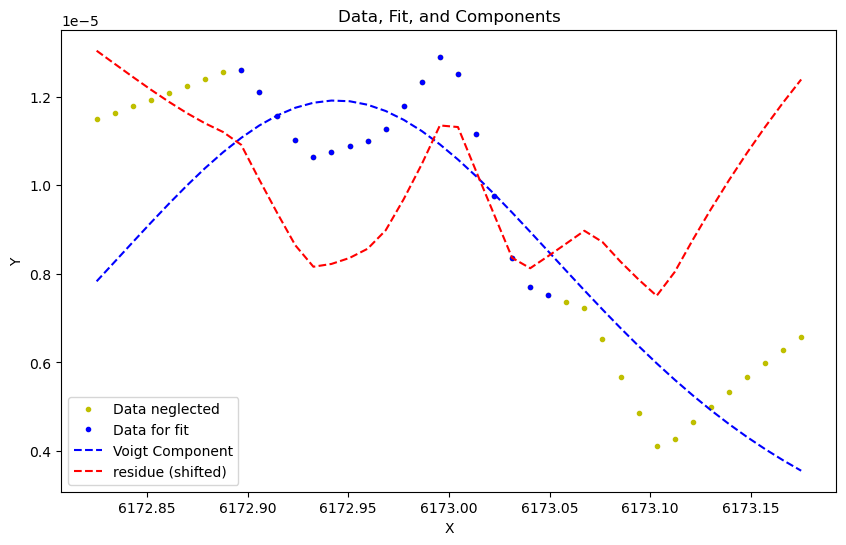

frame 65 at time 23.66666666666663 with param_fit[-1] = (array([ 6.91230841e-06,  6.17295661e+03,  6.60047858e-02, -8.42156192e-02]), array([1.24263142e-07, 1.48843926e-03, 1.30268306e-01, 1.23072704e-01])). Here comes the plot:


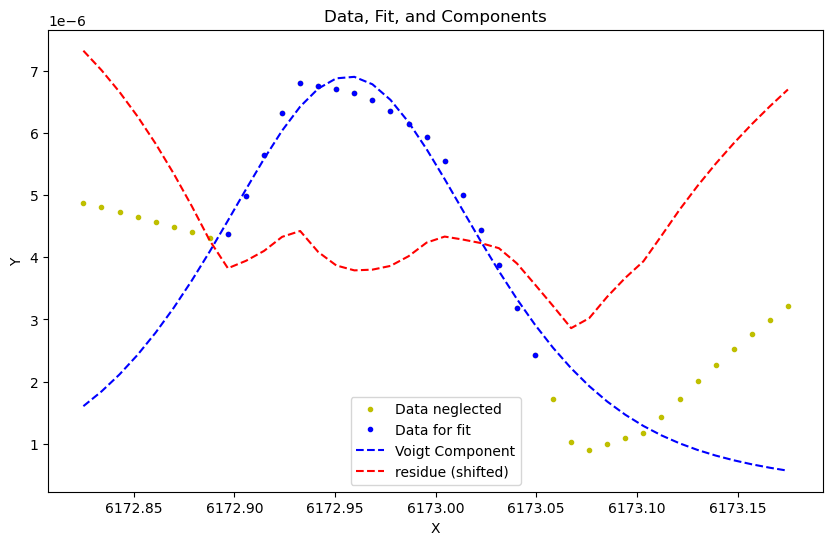

At frame 69 at time 24.93333333333328 the voigt fitting was not succesfull and average guess ([ 9.43346509e-06  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
frame 70 at time 25.25 with param_fit[-1] = (array([ 1.10280426e-05,  6.17296130e+03, -9.58102494e-02,  3.23347593e-02]), array([2.55177202e-07, 3.22131110e-03, 2.74702466e-02, 5.34778272e-02])). Here comes the plot:


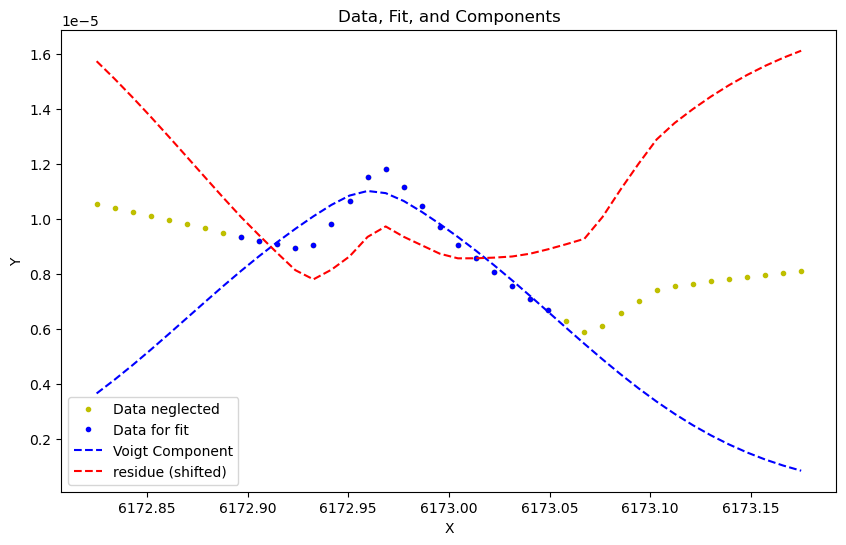

At frame 71 at time 25.58333333333337 the voigt fitting was not succesfull and average guess ([ 9.39721941e-06  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
At frame 72 at time 25.899999999999977 the voigt fitting was not succesfull and average guess ([ 9.09370993e-06  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
At frame 73 at time 26.216666666666697 the voigt fitting was not succesfull and average guess ([ 9.11649276e-06  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
At frame 74 at time 26.533333333333303 the voigt fitting was not succesfull and average guess ([ 9.49750602e-06  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
frame 75 at time 26.850000000000023 with param_fit[-1] = (array([ 7.77794592e-06,  6.17295578e+03, -1.07102836e-01,  1.84334845e-01]), array([1.84991682e-07, 6.70942868e-03, 1.60734928e+00,

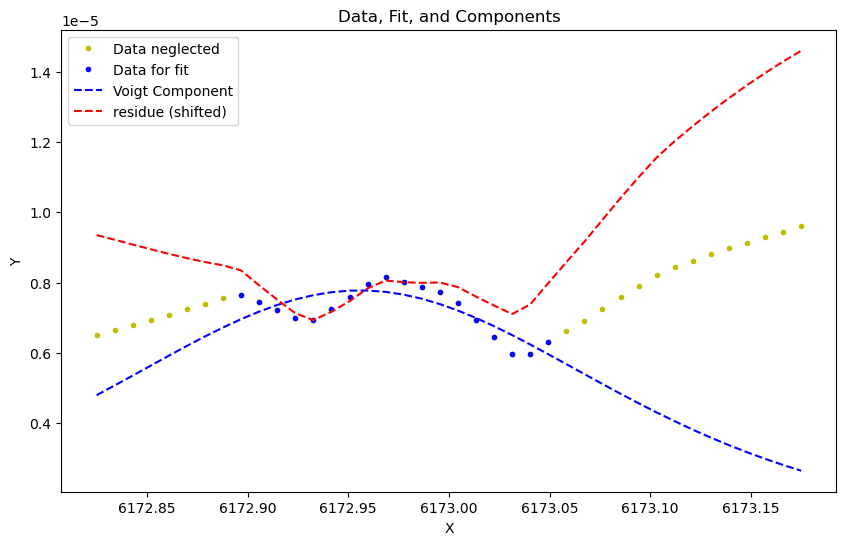

At frame 80 at time 28.450000000000045 the voigt fitting was not succesfull and average guess ([ 8.30346383e-06  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
At frame 81 at time 28.76666666666665 the voigt fitting was not succesfull and average guess ([ 8.69741158e-06  6.17299060e+03 -1.55441909e-01  4.25981451e-02]) is used as params and as std of params. 
vmax = 4.909108338276243e-06, vmin = -1.5127236362303115e-05


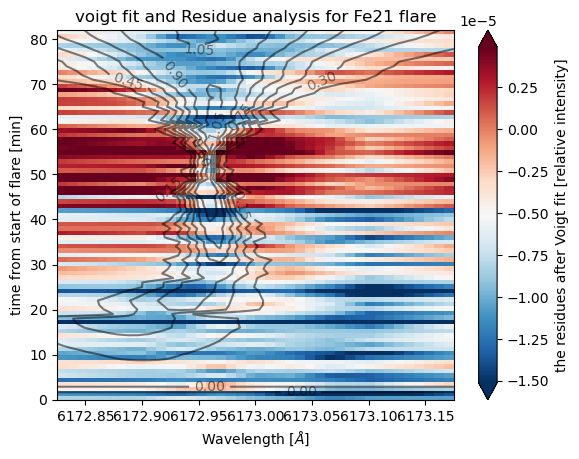

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [18]:
reload(vf)
l = "Fe21"


initial_guess=[[0,  [4.13090273e-06, 6.1729906e+03, -1.55441909e-01, 4.25981451e-02]],
               [135,  [4.13090273e-06, 6.1729906e+03, -1.55441909e-01, 4.25981451e-02]],
               [152,  [4.13090273e-06, 6.1729906e+03, -1.55441909e-01, 4.25981451e-02]],
               [0,  [4.13090273e-06, 6.1729906e+03, -1.55441909e-01, 4.25981451e-02]]
              ]

offsets= [[0, 0.8e-5],
          [449, -6e-5]]

vf.make_analysis( l, data, initial_guess, plot_rate=5, offset=offsets, neglect_points=vf.exc_wings(7,-14), 
                 fix_ind=[1,2,3], exclude_frames=[])

dict_keys(['area_theta_Ha16', 'FOV_Ha16', 'quiet_sun_Ha16', 'nessi_Ha16', 'True_nessi_Ha16', 'TIME_Ha16', 'area_theta_CaIR16', 'FOV_CaIR16', 'quiet_sun_CaIR16', 'nessi_CaIR16', 'True_nessi_CaIR16', 'TIME_CaIR16'])
The average is 0.9999981137314278
frame 0 at time 10.43333333333328 with param_fit[-1] = (array([4.57290022e-04, 6.56291880e+03, 3.11336020e-01, 1.09116523e-05]), array([2.42096015e-03, 1.17227303e-02, 1.19182715e-02, 1.13557619e+03])). Here comes the plot:


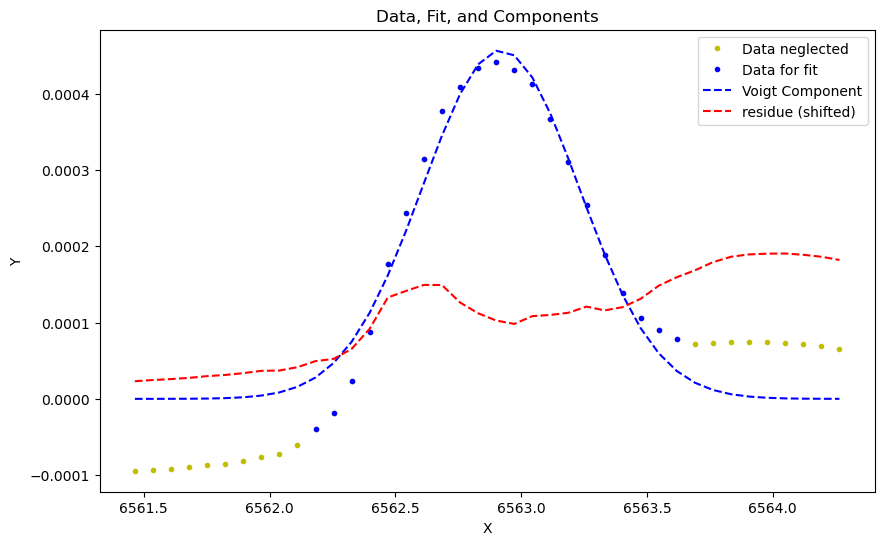

frame 30 at time 16.633333333333326 with param_fit[-1] = (array([2.08094045e-04, 6.56296478e+03, 2.49845181e-01, 1.12392769e-05]), array([3.01951667e-05, 3.20934951e-02, 3.02157984e-02, 1.89616389e+02])). Here comes the plot:


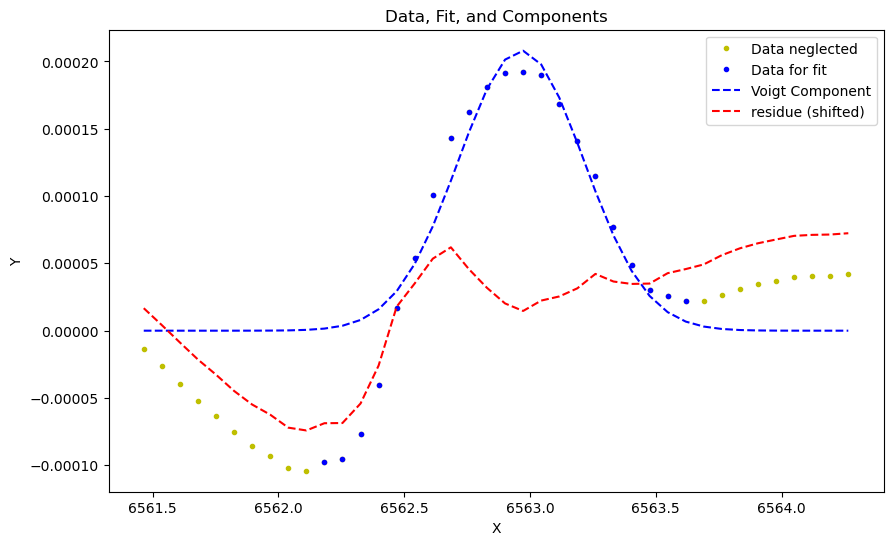

frame 60 at time 22.83333333333337 with param_fit[-1] = (array([ 6.37898364e-05,  6.56272871e+03,  1.68396812e-01, -1.18811438e-03]), array([5.16364514e-02, 6.92993448e-02, 8.43804993e-02, 1.60555447e+04])). Here comes the plot:


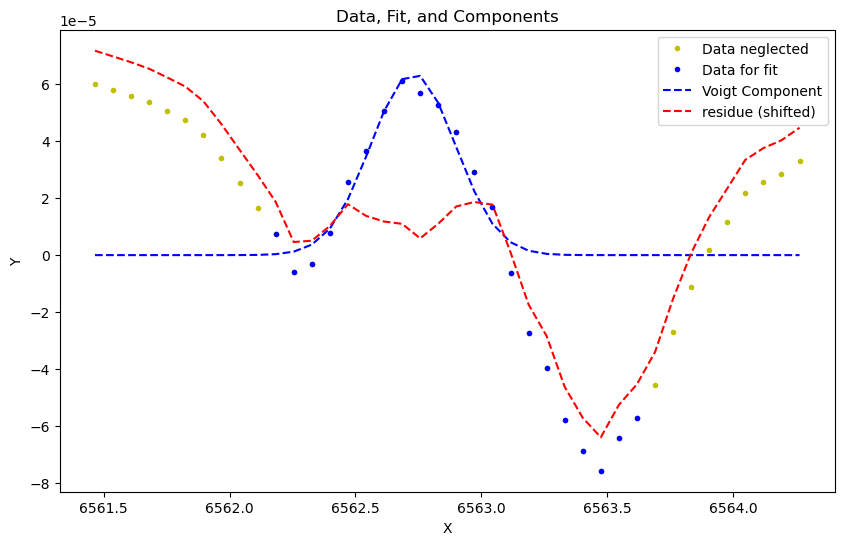

frame 90 at time 29.01666666666665 with param_fit[-1] = (array([ 1.63490759e-04,  6.56262747e+03,  2.78933934e-01, -1.36017078e-04]), array([1.06067832e-02, 4.52377186e-02, 4.84438310e-02, 6.06482775e+03])). Here comes the plot:


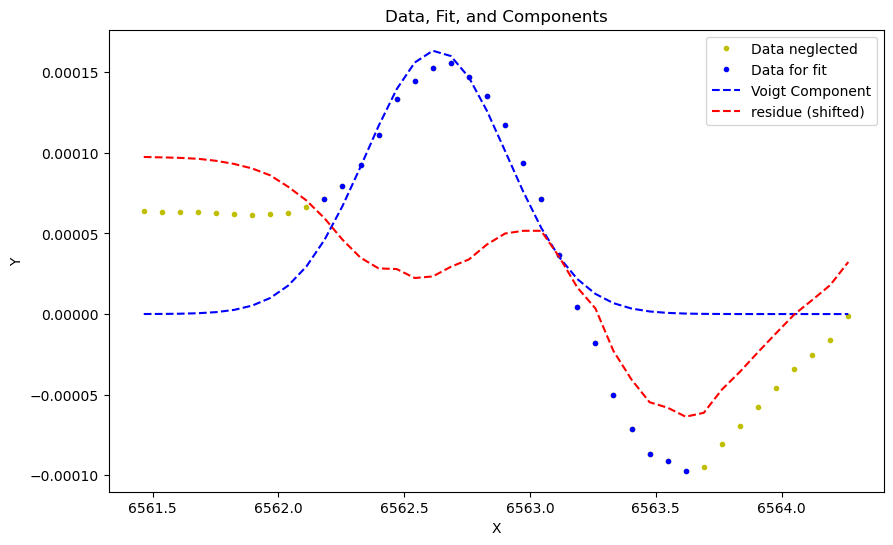

frame 120 at time 35.2166666666667 with param_fit[-1] = (array([ 1.94122356e-04,  6.56265783e+03,  3.45379783e-01, -1.14077854e-04]), array([8.72088742e-03, 2.96241377e-02, 2.83033761e-02, 4.54317857e+03])). Here comes the plot:


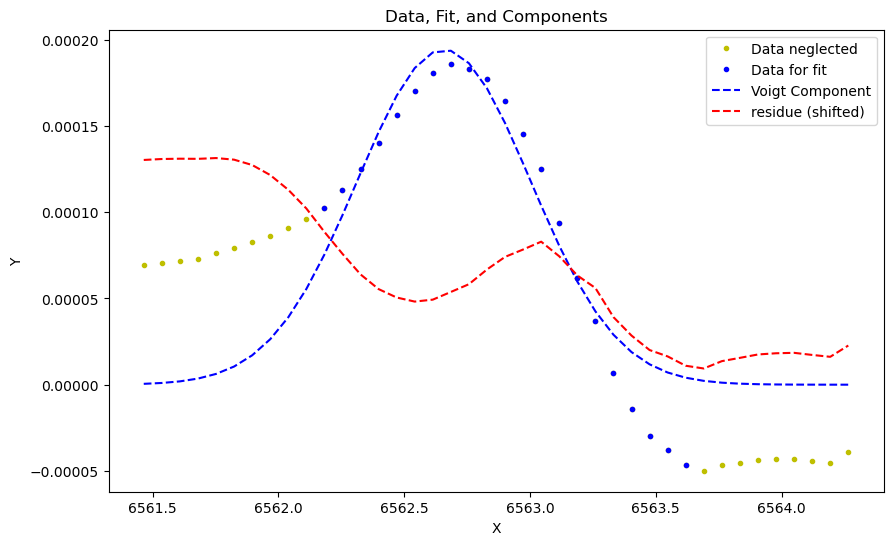

frame 150 at time 41.39999999999998 with param_fit[-1] = (array([1.55651959e-04, 6.56268568e+03, 4.07197474e-01, 8.13225865e-05]), array([3.66698091e-05, 1.37124529e-02, 1.55660790e-02, 2.42274586e+02])). Here comes the plot:


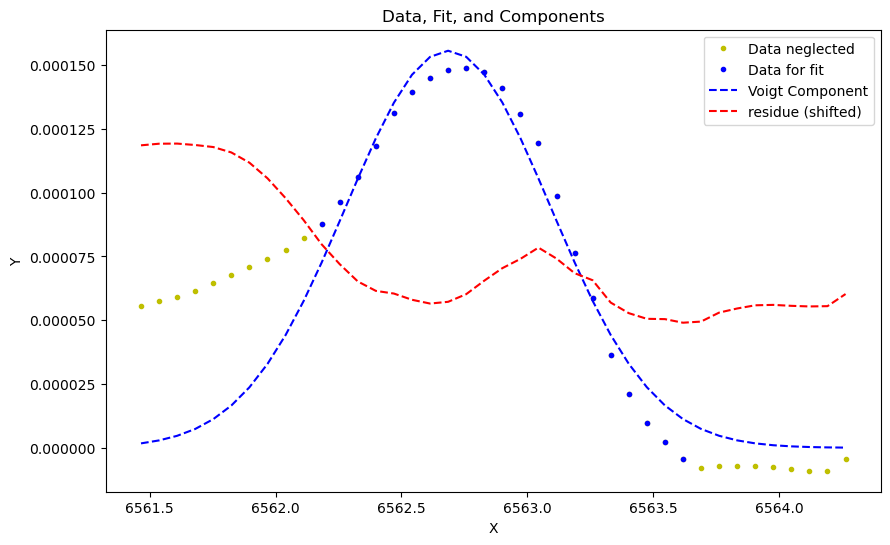

frame 180 at time 47.60000000000002 with param_fit[-1] = (array([1.10695949e-04, 6.56264157e+03, 5.87622311e-01, 7.09722686e-04]), array([2.70944228e-04, 5.95462665e-03, 7.30720864e-03, 5.96242682e+02])). Here comes the plot:


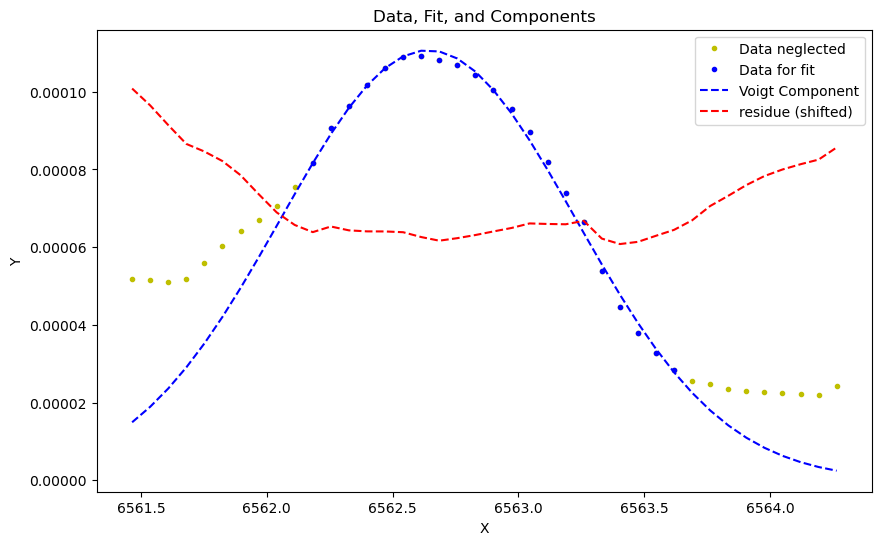

frame 210 at time 54.0 with param_fit[-1] = (array([ 8.91121744e-05,  6.56267139e+03, -1.07719762e+00, -9.80742032e-01]), array([2.05625740e-06, 3.75668495e-02, 4.88750344e-01, 9.74680879e-01])). Here comes the plot:


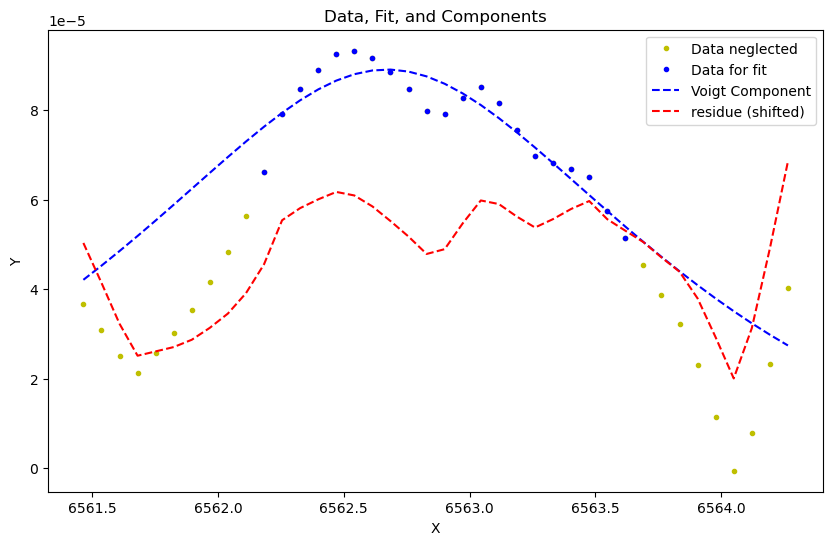

At frame 226 at time 57.299999999999955 the voigt fitting was not succesfull and average guess ([5.02427008e-05 6.56325114e+03 1.62119617e-01 2.81006836e+00]) is used as params and as std of params. 
At frame 227 at time 57.5 the voigt fitting was not succesfull and average guess ([4.94568272e-05 6.56329166e+03 2.20037375e-01 3.41041292e+00]) is used as params and as std of params. 
At frame 228 at time 57.7166666666667 the voigt fitting was not succesfull and average guess ([4.89340251e-05 6.56332245e+03 1.57135255e-01 3.93282376e+00]) is used as params and as std of params. 
At frame 229 at time 57.91666666666663 the voigt fitting was not succesfull and average guess ([4.86037951e-05 6.56338764e+03 1.05541815e-01 4.48726481e+00]) is used as params and as std of params. 
At frame 230 at time 58.133333333333326 the voigt fitting was not succesfull and average guess ([4.81897372e-05 6.56343217e+03 4.50696743e-02 5.02347497e+00]) is used as params and as std of params. 
At frame 231 at t

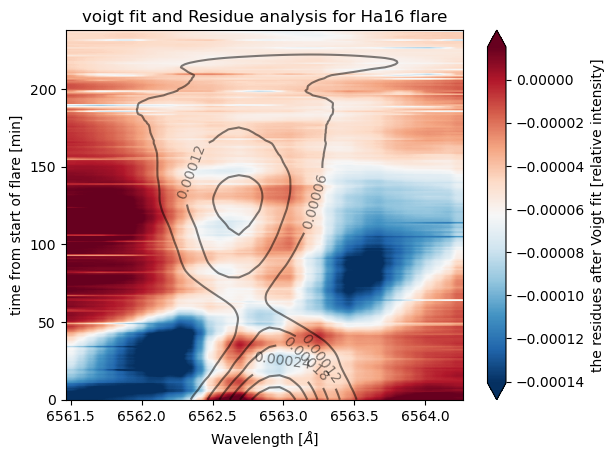

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 0.9999896617511952
frame 0 at time 10.333333333333371 with param_fit[-1] = (array([3.11826229e-04, 8.54218223e+03, 1.83006325e-01, 3.50911199e-02]), array([2.04231790e-05, 7.94846954e-03, 1.02268785e-02, 6.25876803e-02])). Here comes the plot:


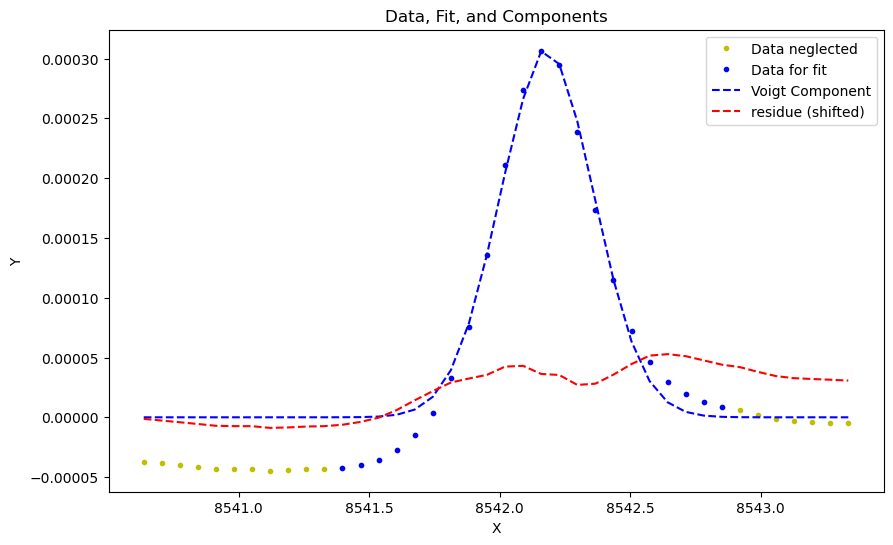

frame 50 at time 20.649999999999977 with param_fit[-1] = (array([ 4.61985258e-05,  8.54216874e+03,  7.63920947e-02, -4.47440752e-04]), array([1.12415286e-04, 5.18260714e-02, 5.72994867e-02, 1.41567118e+03])). Here comes the plot:


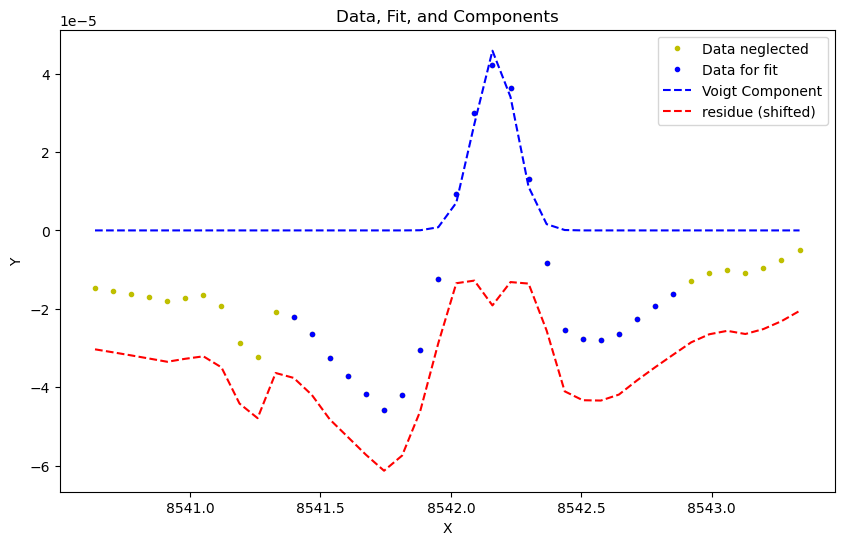

At frame 59 at time 22.51666666666665 the voigt fitting was not succesfull and average guess ([3.54409579e-05 8.54215801e+03 8.17298084e-02 1.30591573e-03]) is used as params and as std of params. 
frame 100 at time 30.98333333333335 with param_fit[-1] = (array([-4.77690737e-05,  8.54265635e+03, -1.65685933e-01,  1.14095066e-03]), array([1.57018938e-03, 5.22525108e-02, 6.49279349e-02, 3.98074191e+02])). Here comes the plot:


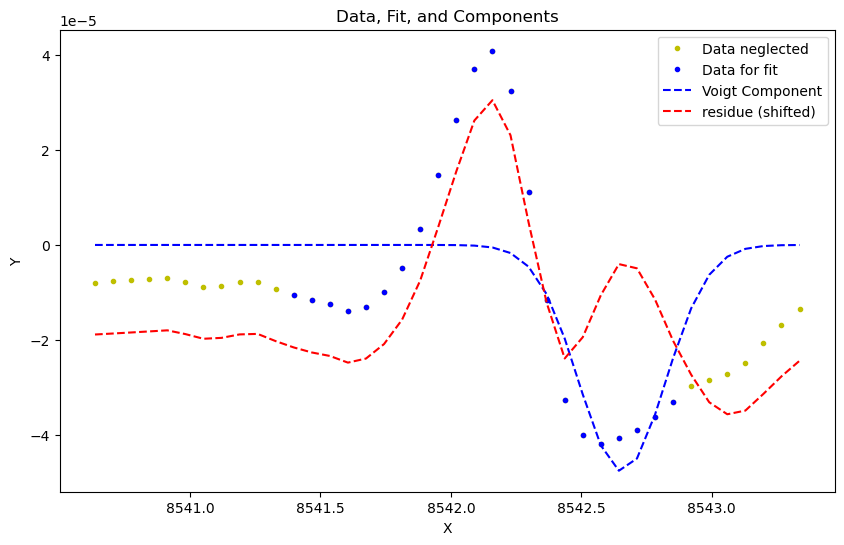

frame 150 at time 41.299999999999955 with param_fit[-1] = (array([ 6.53521181e-05,  8.54204625e+03, -2.30746979e-01,  1.46556954e-01]), array([2.98746796e-06, 1.08566968e-02, 1.35683055e-02, 1.01988318e-01])). Here comes the plot:


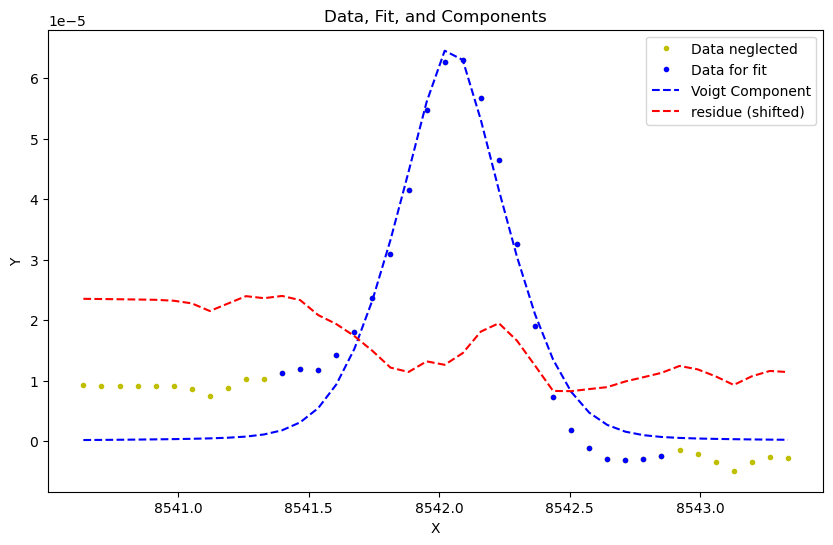

frame 200 at time 51.83333333333337 with param_fit[-1] = (array([ 3.27976037e-05,  8.54213845e+03, -2.06131709e-01,  4.94828917e-01]), array([1.25340263e-06, 1.36563562e-02, 1.08859560e-01, 4.26517536e-02])). Here comes the plot:


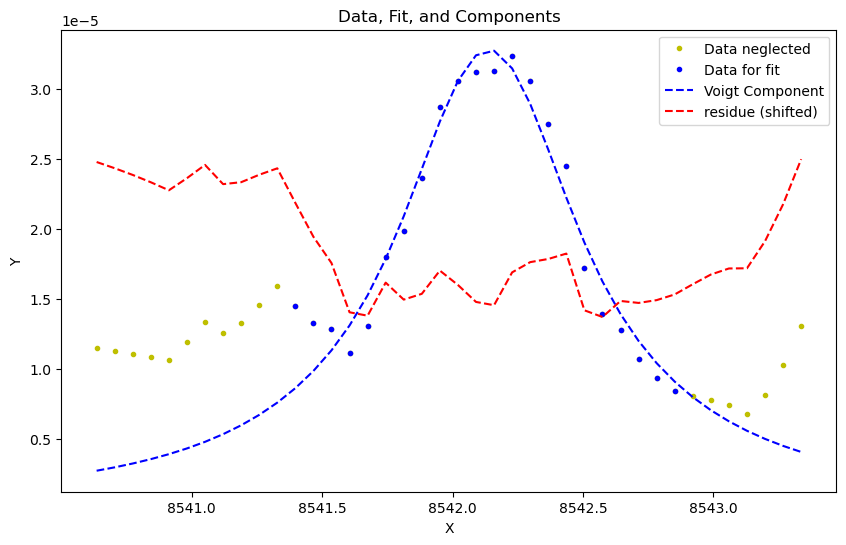

At frame 222 at time 56.366666666666674 the voigt fitting was not succesfull and average guess ([6.09974015e-05 8.54320887e+03 3.52418318e-01 6.40764965e-01]) is used as params and as std of params. 
At frame 223 at time 56.58333333333337 the voigt fitting was not succesfull and average guess ([1.03616447e-04 8.54392605e+03 3.15770412e-01 6.64436882e-01]) is used as params and as std of params. 
At frame 224 at time 56.7833333333333 the voigt fitting was not succesfull and average guess ([1.46703642e-04 8.54462782e+03 2.64298850e-01 8.22241806e-01]) is used as params and as std of params. 
At frame 225 at time 57.0 the voigt fitting was not succesfull and average guess ([ 1.90107040e-04  8.54526609e+03 -3.36688588e-02  8.21024502e-01]) is used as params and as std of params. 
At frame 226 at time 57.200000000000045 the voigt fitting was not succesfull and average guess ([2.33315035e-04 8.54594210e+03 1.99118057e-02 7.95786423e-01]) is used as params and as std of params. 
At frame 227 

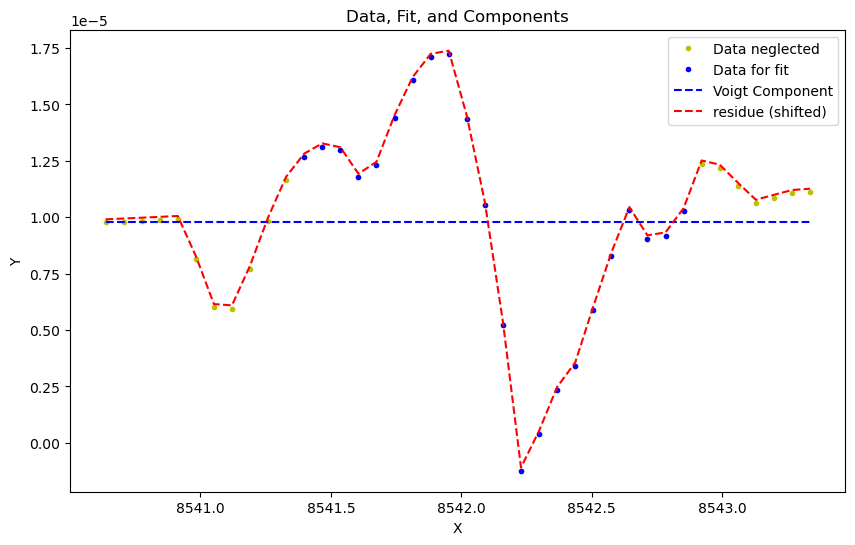

frame 300 at time 72.48333333333335 with param_fit[-1] = (array([ 9.00810541e+18, -7.88221670e+16,  1.19755340e+14, -6.91191039e+08]), array([inf, inf, inf, inf])). Here comes the plot:


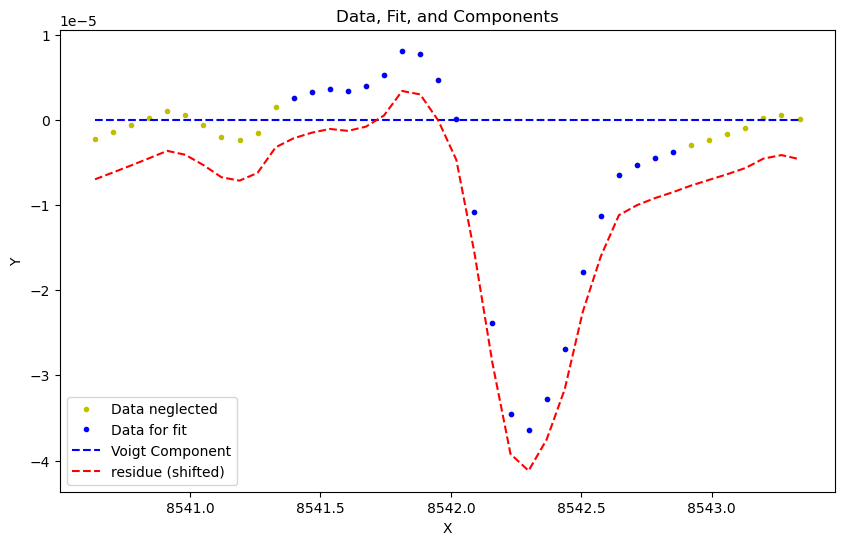

vmax = 1.9731746551316234e-05, vmin = -6.169819236280628e-05


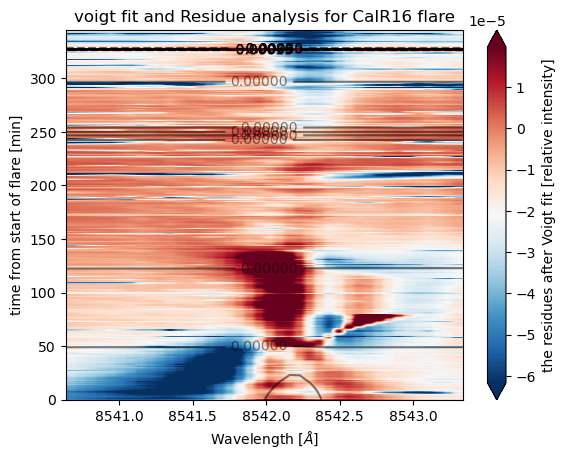

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [7]:
# for quiet times [55, 60]
reload(un)
reload(un2)
reload(vf)
lines = ["Ha16", "CaIR16"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())
# un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':30, 'Hbeta':200,  "CaK":50, "CaK(2)":200,  "CaIR":50,  "Fe6173":500, "He":20}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54230821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-8.41204361e-06,  5.87614596e+03, -1.10863891e-01,  8.69928093e-05]}
lnp=[vf.exc_wings(9, -9), vf.exc_wings(10,-7), vf.exc_wings(9,-9), [], vf.exc_wings(10,-10)]
ofs = [5e-5,1e-5,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

The average is 0.9999896617511952
frame 0 at time 10.333333333333371 with param_fit[-1] = (array([3.30339656e-04, 8.54218369e+03, 2.03583988e-01, 8.37711192e-02]), array([1.13644503e-05, 6.71079217e-03, 1.04489057e-02, 5.08323868e-02])). Here comes the plot:


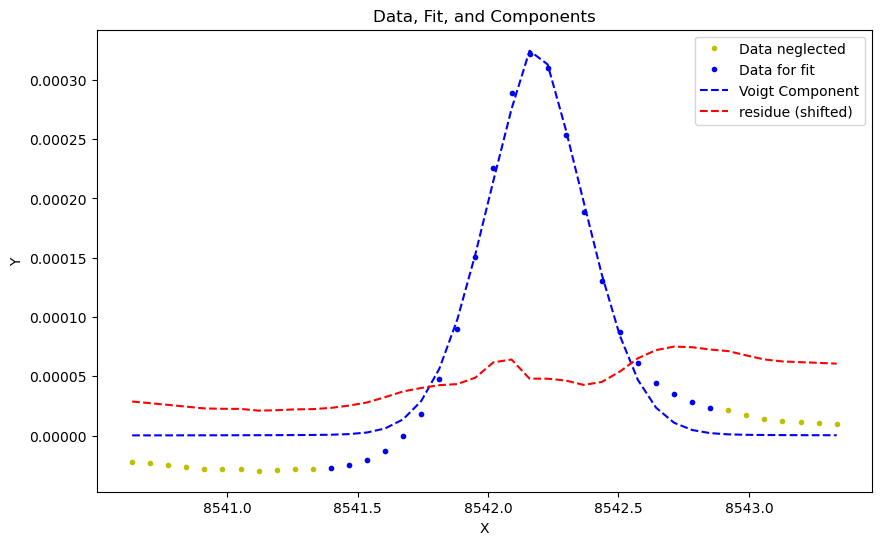

frame 25 at time 15.5 with param_fit[-1] = (array([1.55318069e-04, 8.54220109e+03, 1.53610298e-01, 4.63154179e-04]), array([9.06659006e-03, 2.05891117e-02, 2.00906535e-02, 3.01983037e+03])). Here comes the plot:


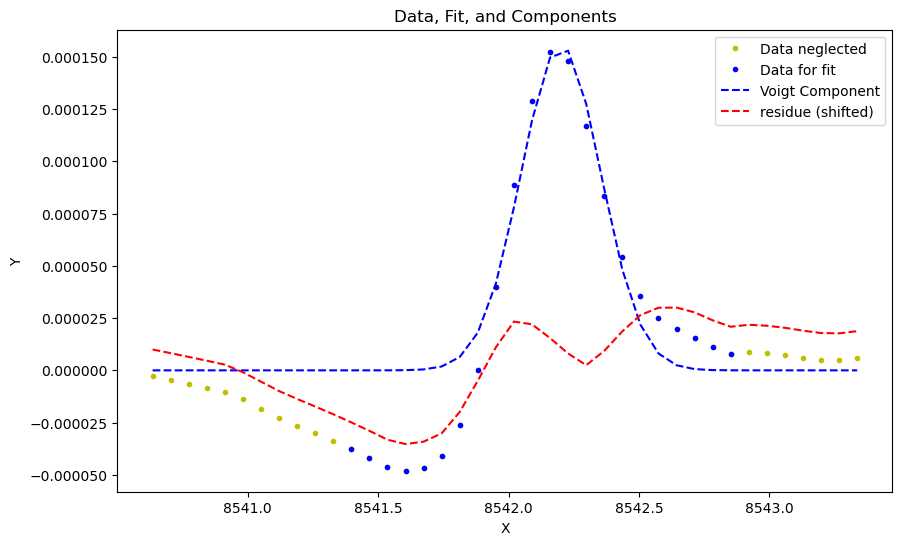

frame 50 at time 20.649999999999977 with param_fit[-1] = (array([ 6.09284857e-05,  8.54216805e+03,  9.73503354e-02, -3.14252589e-04]), array([9.52461303e-03, 2.23942096e-02, 2.66628216e-02, 2.35958656e+03])). Here comes the plot:


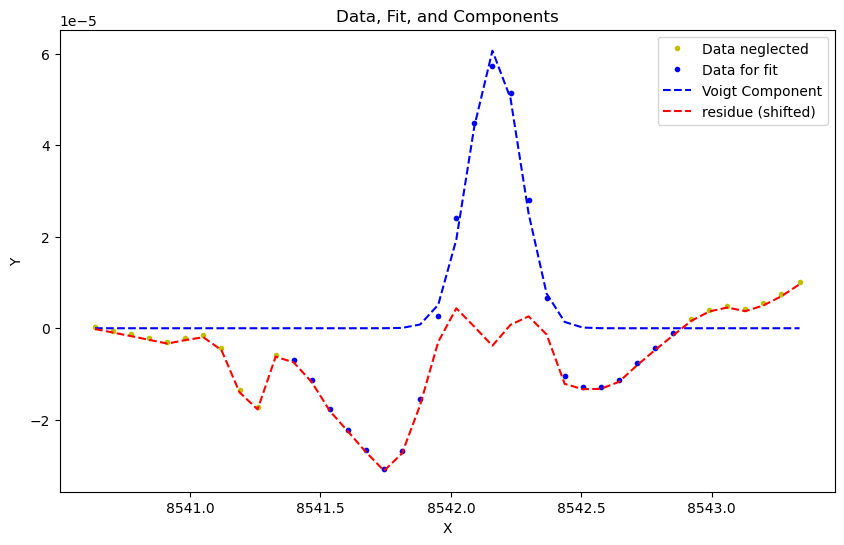

At frame 59 at time 22.51666666666665 the voigt fitting was not succesfull and average guess ([9.89887496e-05 8.54213575e+03 1.12715590e-01 1.83760534e-02]) is used as params and as std of params. 
frame 75 at time 25.81666666666672 with param_fit[-1] = (array([ 6.13619885e-05,  8.54206796e+03,  1.25370204e-01, -2.22649953e-04]), array([2.02727281e-02, 3.26651186e-02, 3.58713853e-02, 4.82665296e+03])). Here comes the plot:


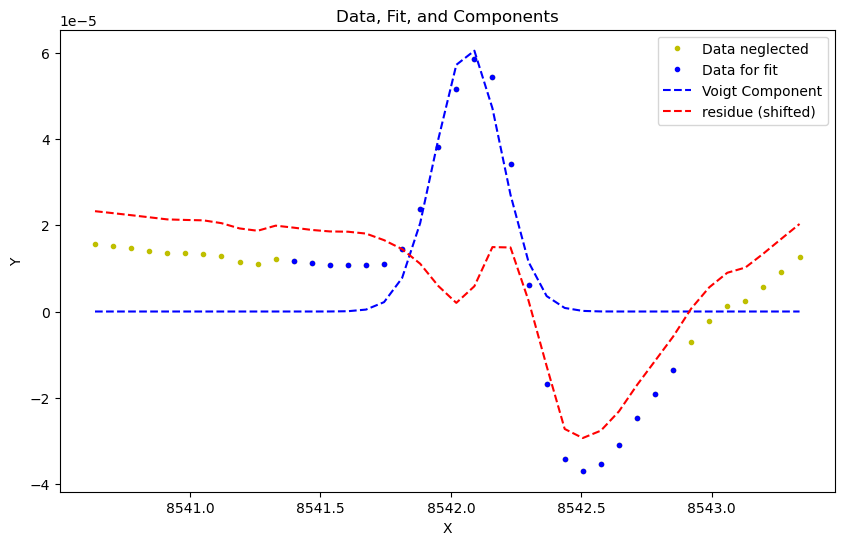

frame 100 at time 30.98333333333335 with param_fit[-1] = (array([5.80726862e-05, 8.54211303e+03, 1.32721423e-01, 4.01611846e-04]), array([2.20866971e-02, 2.73276440e-02, 2.67129312e-02, 8.33866213e+03])). Here comes the plot:


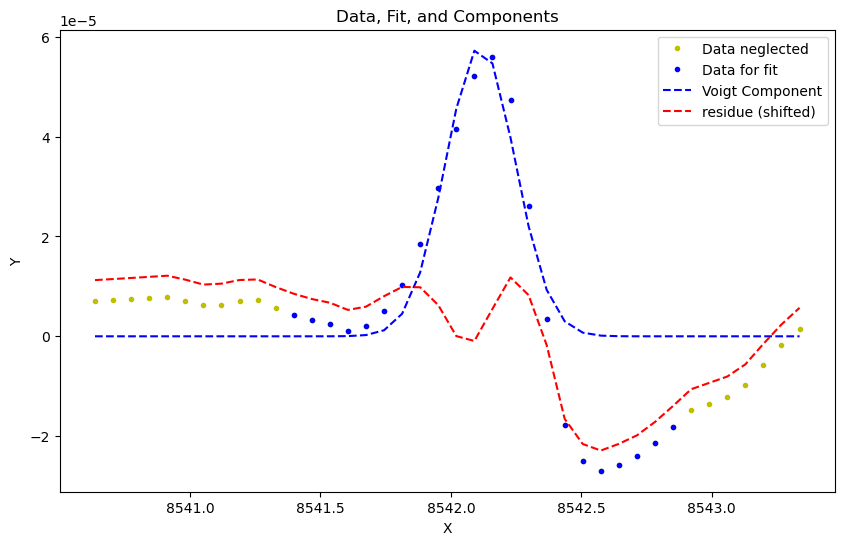

frame 125 at time 36.133333333333326 with param_fit[-1] = (array([ 6.09483306e-05,  8.54204711e+03,  1.87821273e-01, -7.81832692e-04]), array([9.77992566e-03, 2.58339718e-02, 2.83344092e-02, 3.62331437e+03])). Here comes the plot:


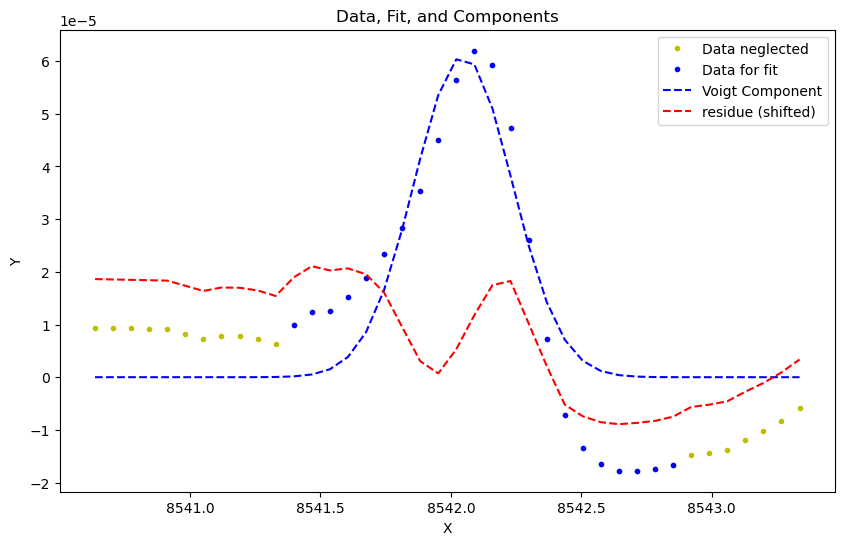

frame 150 at time 41.299999999999955 with param_fit[-1] = (array([6.91163323e-05, 8.54204622e+03, 2.02555835e-01, 2.70298166e-01]), array([3.01154529e-06, 1.07095885e-02, 4.28145313e-02, 2.34519533e-02])). Here comes the plot:


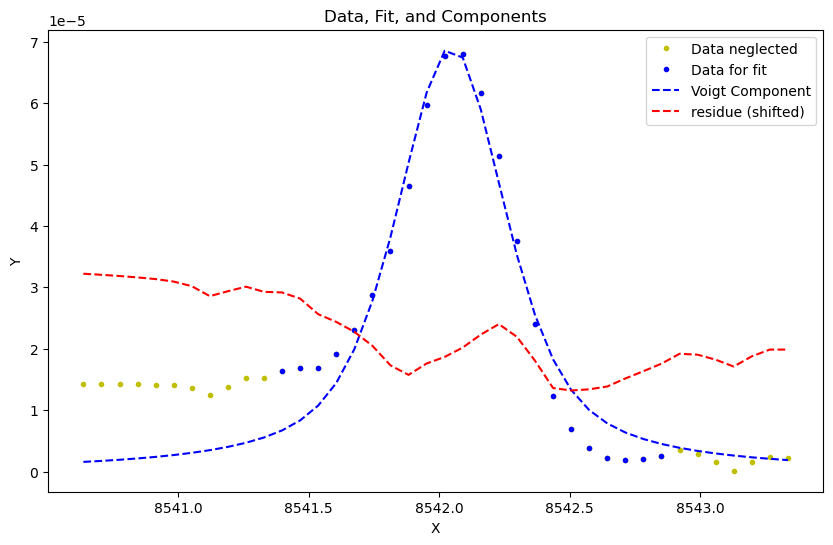

frame 175 at time 46.4666666666667 with param_fit[-1] = (array([3.76847812e-05, 8.54212982e+03, 1.95516505e-01, 2.08306855e-01]), array([1.80987614e-06, 1.04564547e-02, 3.41850078e-02, 3.64331708e-02])). Here comes the plot:


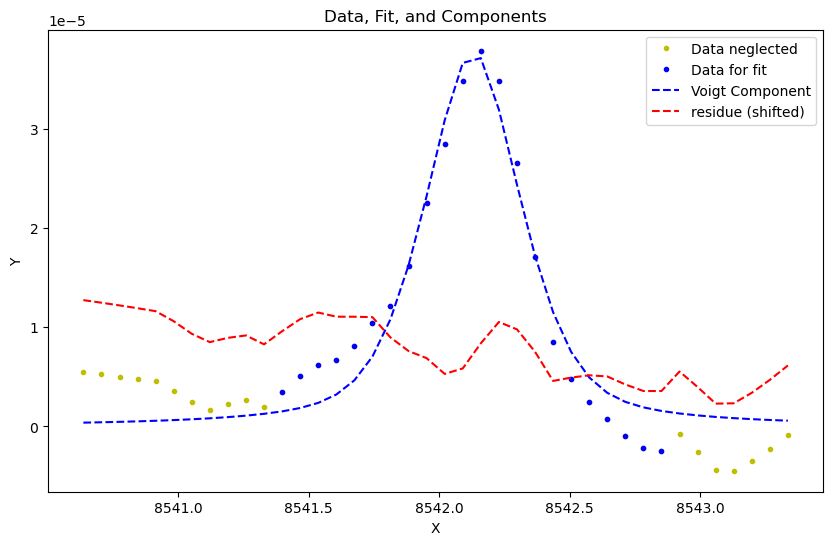

frame 200 at time 51.83333333333337 with param_fit[-1] = (array([2.55882008e-05, 8.54214418e+03, 2.66978746e-01, 3.09642153e-01]), array([1.06323046e-06, 1.26842179e-02, 6.51250403e-02, 5.81146190e-02])). Here comes the plot:


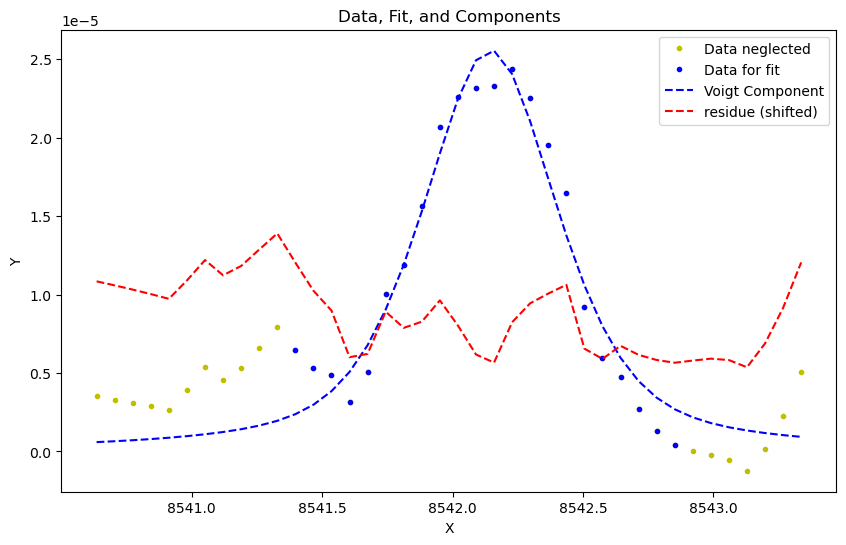

At frame 225 at time 57.0 the voigt fitting was not succesfull and average guess ([6.17047813e-05 8.54254539e+03 7.68547088e-02 1.80959857e-01]) is used as params and as std of params. 
At frame 226 at time 57.200000000000045 the voigt fitting was not succesfull and average guess ([6.09540349e-05 8.54259019e+03 7.68515257e-02 2.00627951e-01]) is used as params and as std of params. 
At frame 227 at time 57.39999999999998 the voigt fitting was not succesfull and average guess ([6.11084393e-05 8.54260490e+03 3.09852687e-02 1.93149939e-01]) is used as params and as std of params. 
At frame 228 at time 57.616666666666674 the voigt fitting was not succesfull and average guess ([ 6.11895101e-05  8.54260865e+03 -5.18249797e-03  2.50215957e-01]) is used as params and as std of params. 
At frame 230 at time 58.01666666666665 the voigt fitting was not succesfull and average guess ([6.06881804e-05 8.54249396e+03 1.62146921e-02 2.49815259e-01]) is used as params and as std of params. 
At frame 238

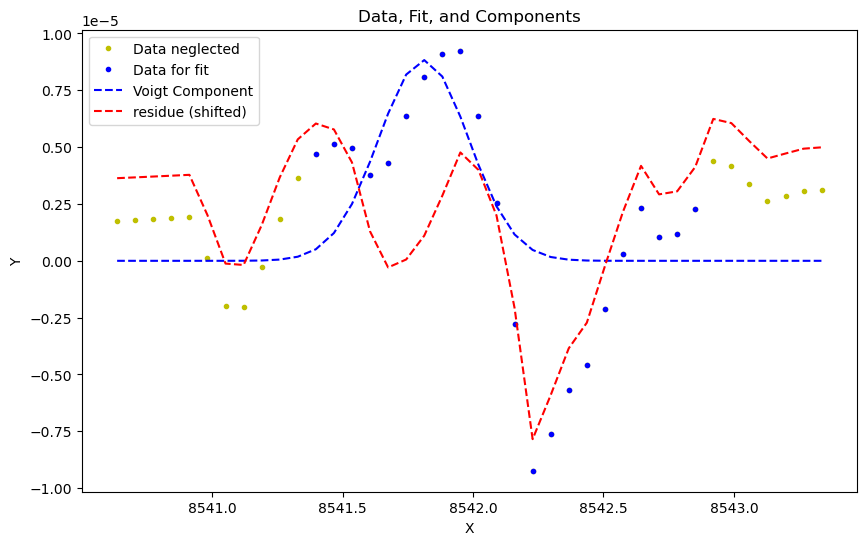

frame 275 at time 67.31666666666672 with param_fit[-1] = (array([-2.24338356e-05,  8.54234246e+03,  1.35780580e-01, -3.07800267e-04]), array([2.81607081e-03, 8.85301776e-03, 9.39255636e-03, 3.75968490e+03])). Here comes the plot:


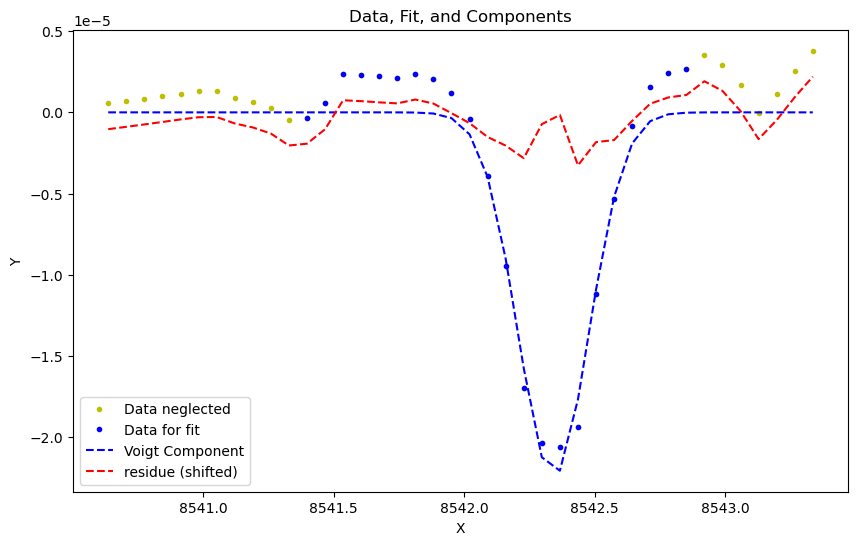

At frame 292 at time 70.81666666666672 the voigt fitting was not succesfull and average guess ([ 2.59999237e-05  8.54231572e+03 -4.25362228e-02  6.73381629e-03]) is used as params and as std of params. 
At frame 294 at time 71.23333333333335 the voigt fitting was not succesfull and average guess ([ 2.23826818e-05  8.54228733e+03 -1.46254701e-02 -2.66659155e-03]) is used as params and as std of params. 
At frame 295 at time 71.45000000000005 the voigt fitting was not succesfull and average guess ([2.07889204e-05 8.54227598e+03 1.40302148e-02 6.86271594e-02]) is used as params and as std of params. 
At frame 296 at time 71.64999999999998 the voigt fitting was not succesfull and average guess ([ 2.02111926e-05  8.54226620e+03 -1.03936358e-02  3.52728086e-02]) is used as params and as std of params. 
frame 300 at time 72.48333333333335 with param_fit[-1] = (array([-4.52507356e-05,  8.54232704e+03,  1.53825208e-01, -2.32144025e-01]), array([2.77863137e-06, 1.22253093e-02, 4.90077271e-02, 2.

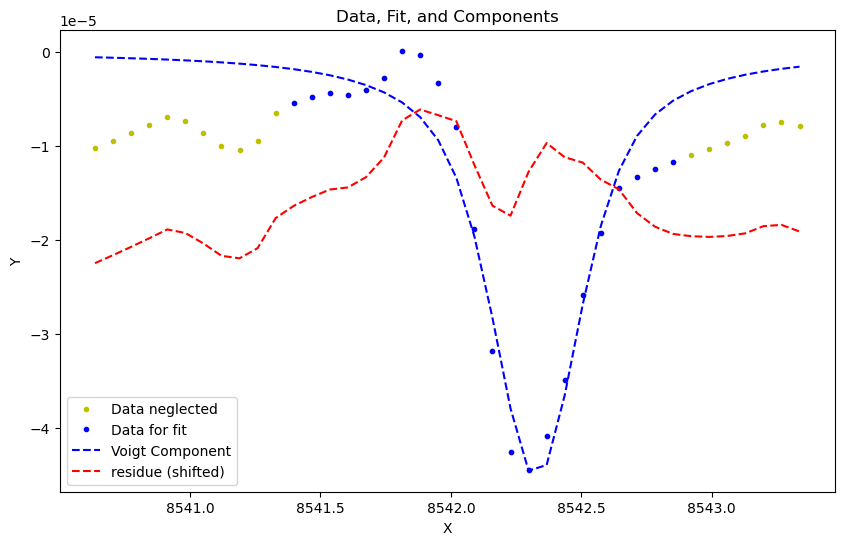

frame 325 at time 77.63333333333333 with param_fit[-1] = (array([-4.57794662e-05,  8.54221807e+03, -1.92462857e-01,  7.31957393e-01]), array([6.37583068e-06, 7.25026202e-02, 1.51460466e+00, 7.74228955e-01])). Here comes the plot:


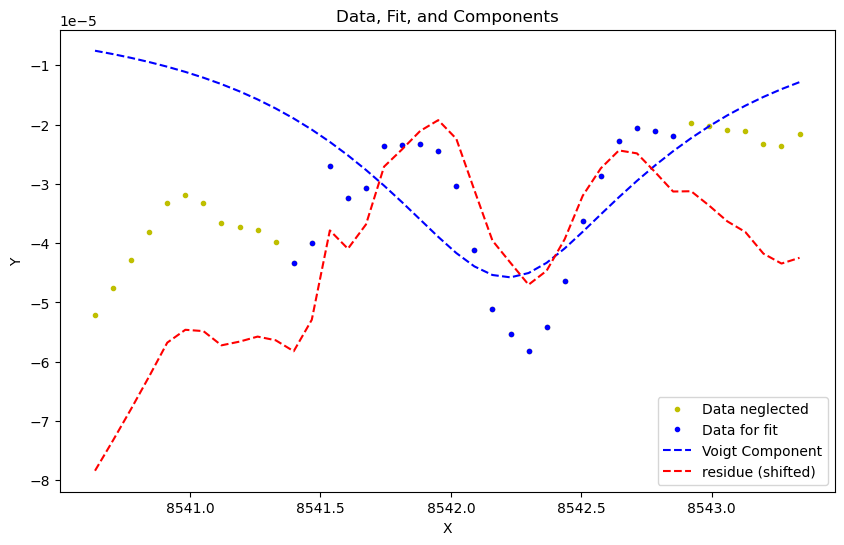

At frame 337 at time 80.11666666666667 the voigt fitting was not succesfull and average guess ([-2.04357043e-07  8.54228221e+03 -7.32052428e-02  2.09379786e-01]) is used as params and as std of params. 
At frame 341 at time 80.93333333333328 the voigt fitting was not succesfull and average guess ([6.08787202e-07 8.54229799e+03 1.18451639e-01 2.22814675e-01]) is used as params and as std of params. 
At frame 342 at time 81.14999999999998 the voigt fitting was not succesfull and average guess ([-3.31932800e-06  8.54228686e+03  1.73259670e-01  1.06871344e-01]) is used as params and as std of params. 
vmax = 4.299580164412111e-06, vmin = -6.047201979749269e-05


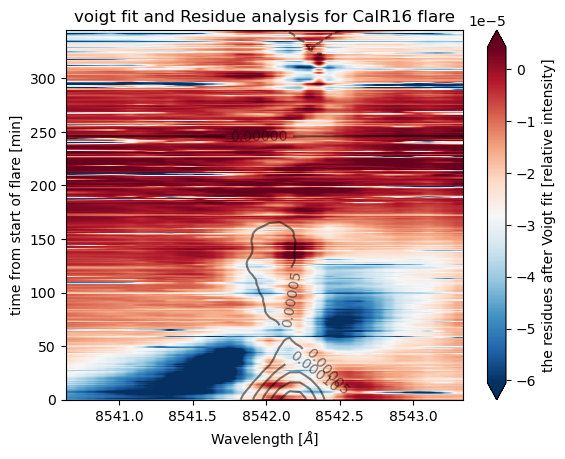

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [10]:

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 3.21357768e-04, 8.54218041e+03, 2.07115523e-01, 1.10242561e-01],
                   "Fe6173":[4.13090273e-06, 6.17348106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-7.04217575e-06,  5.87645793e+03, -2.32074350e-01,  1.18592840e+00]}

offsets= [[0, 2.5e-5],
          [125, 1.5e-5],
          [175, 0.2e-5],
          ]

vf.make_analysis(lines[1], data, offset=offsets, plot_rate=25, initial_guess=initial_guesses["CaIR"], neglect_points=vf.exc_wings(10, -7))
# vf.make_analysis(lines[0], data, offset=offsets, plot_rate=5, initial_guess=initial_guesses["Ha"], 
                #  neglect_points=vf.exc_wings(10, -7), frame_range=[110, 140])
# vf.make_analysis(lines[0], data, offset=offsets, plot_rate=5, initial_guess=initial_guesses["Ha"], 
#                  neglect_points=vf.exc_wings(3, -7), frame_range=[80, 120])

In [ ]:
# for quiet times [24,28]
reload(un)
reload(un2)
reload(vf)
lines = ["Ha16", "CaIR16"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())
# un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':30, 'Hbeta':200,  "CaK":50, "CaK(2)":200,  "CaIR":50,  "Fe6173":500, "He":20}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-8.41204361e-06,  5.87614596e+03, -1.10863891e-01,  8.69928093e-05]}
lnp=[vf.exc_wings(9, -9), vf.exc_wings(10,-7), vf.exc_wings(9,-9), [], vf.exc_wings(10,-10)]
ofs = [-3.5e-6,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

dict_keys(['area_theta_He23', 'FOV_He23', 'quiet_sun_He23', 'nessi_He23', 'True_nessi_He23', 'TIME_He23', 'area_theta_Ha23', 'FOV_Ha23', 'quiet_sun_Ha23', 'nessi_Ha23', 'True_nessi_Ha23', 'TIME_Ha23', 'area_theta_CaIR23', 'FOV_CaIR23', 'quiet_sun_CaIR23', 'nessi_CaIR23', 'True_nessi_CaIR23', 'TIME_CaIR23', 'area_theta_CaK(2)23', 'FOV_CaK(2)23', 'quiet_sun_CaK(2)23', 'nessi_CaK(2)23', 'True_nessi_CaK(2)23', 'TIME_CaK(2)23', 'area_theta_Hbeta23', 'FOV_Hbeta23', 'quiet_sun_Hbeta23', 'nessi_Hbeta23', 'True_nessi_Hbeta23', 'TIME_Hbeta23'])
The average is 1.0000038726990597
frame 0 at time 13.716666666666697 with param_fit[-1] = (array([ 4.14742083e-06,  5.87609371e+03,  5.77064490e-02, -5.15355612e-04]), array([1.54154464e-04, 4.18788019e-03, 5.09056865e-03, 1.20406020e+02])). Here comes the plot:


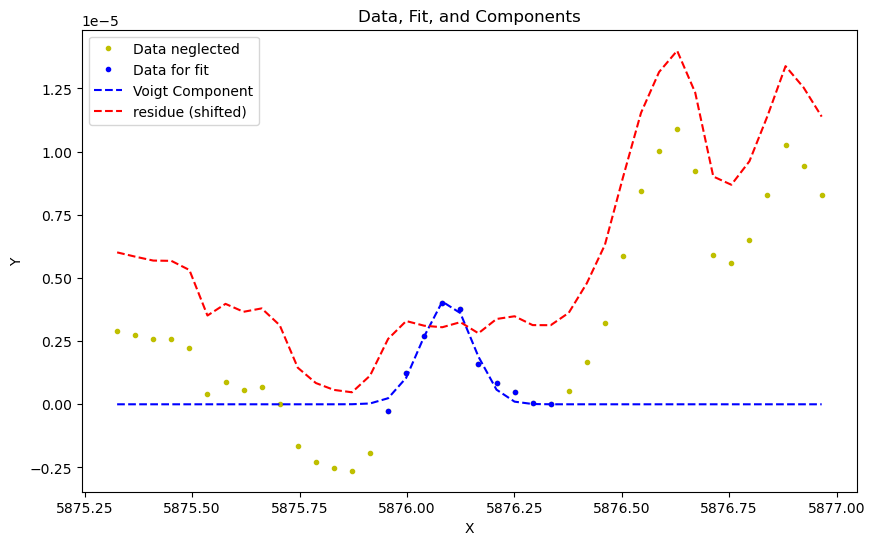

At frame 2 at time 15.5 the voigt fitting was not succesfull and average guess ([-7.55223909e-07  5.87610699e+03 -9.12109127e-04 -1.91133989e-04]) is used as params and as std of params. 
frame 20 at time 31.59999999999991 with param_fit[-1] = (array([-1.30018526e-05,  5.87614717e+03, -1.55942326e-01,  1.89383617e-01]), array([4.49545838e-07, 4.76227741e-03, 3.55339105e-01, 3.86074562e-01])). Here comes the plot:


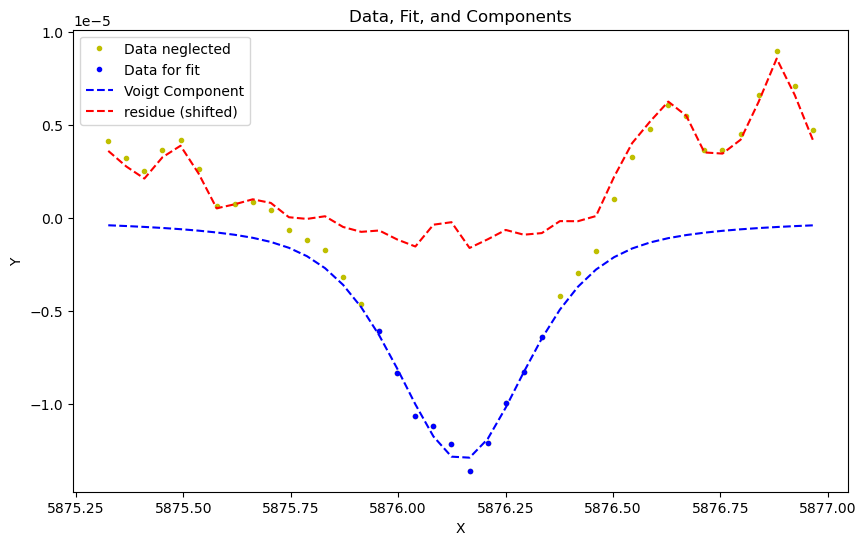

At frame 35 at time 45.01666666666665 the voigt fitting was not succesfull and average guess ([-6.39815881e-06  5.87614765e+03  2.85366419e-02  4.03418018e-02]) is used as params and as std of params. 
At frame 36 at time 45.91666666666674 the voigt fitting was not succesfull and average guess ([-6.09964093e-06  5.87614501e+03  2.42772494e-02  4.03585125e-02]) is used as params and as std of params. 
At frame 37 at time 46.799999999999955 the voigt fitting was not succesfull and average guess ([-5.38677635e-06  5.87614365e+03  1.20337396e-02  1.47765940e-02]) is used as params and as std of params. 
frame 40 at time 49.48333333333335 with param_fit[-1] = (array([-6.96562935e-06,  5.87612315e+03,  6.97796265e-02,  2.70760569e-01]), array([2.69951675e-07, 7.56268268e-03, 1.60859020e-01, 8.59455729e-02])). Here comes the plot:


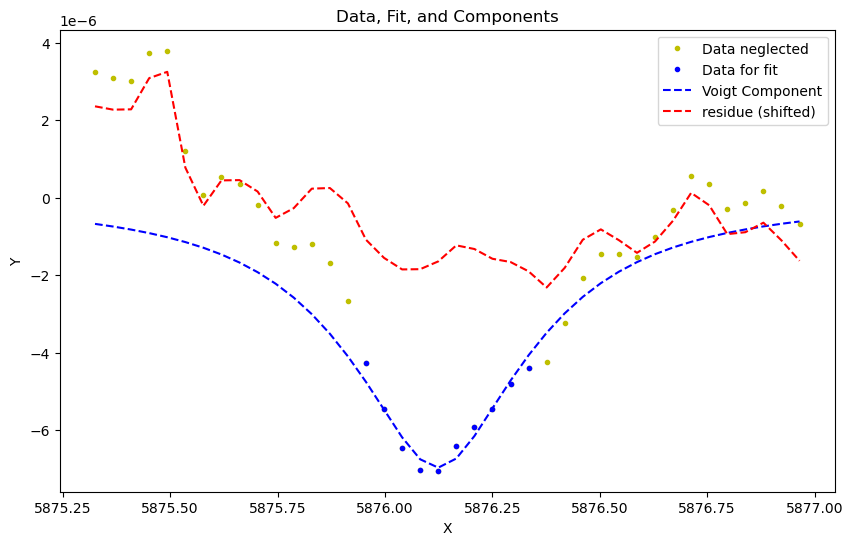

At frame 45 at time 53.9666666666667 the voigt fitting was not succesfull and average guess ([-9.16252949e-06  5.87610863e+03  1.25720823e-02  3.41970235e-01]) is used as params and as std of params. 
At frame 46 at time 54.84999999999991 the voigt fitting was not succesfull and average guess ([-8.53691405e-06  5.87612207e+03 -4.32730698e-02  2.31341430e-01]) is used as params and as std of params. 
At frame 47 at time 55.75 the voigt fitting was not succesfull and average guess ([-6.36700225e-06  5.87612889e+03 -3.69878936e-02  9.67051618e-02]) is used as params and as std of params. 
At frame 51 at time 59.33333333333326 the voigt fitting was not succesfull and average guess ([-3.98743638e-06  5.87616345e+03 -2.51927739e-01 -1.72215758e-01]) is used as params and as std of params. 
vmax = 1.792674176015083e-05, vmin = -7.258832339155421e-06


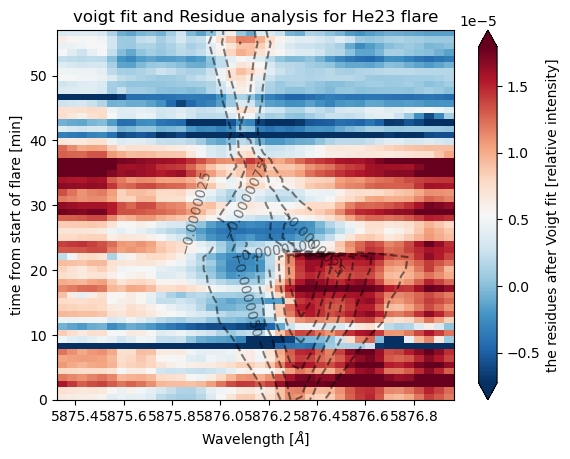

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.000047779827338
frame 0 at time 13.483333333333348 with param_fit[-1] = (array([ 1.66336125e-04,  6.56290487e+03,  7.31689418e-01, -4.41827709e-01]), array([1.23656914e-05, 3.75118089e-02, 1.17909554e-01, 1.16313305e+00])). Here comes the plot:


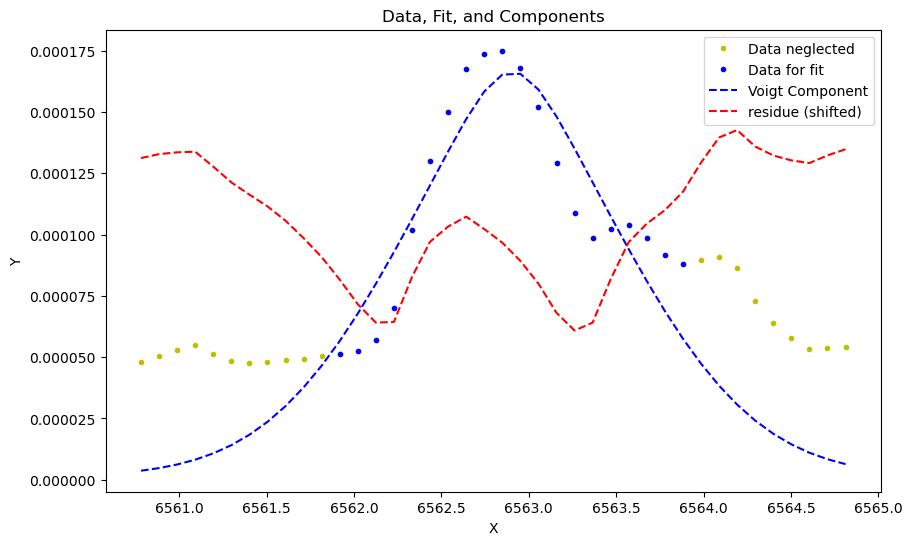

vmax = 5.238000121959205e-05, vmin = -1.389717959425813e-05


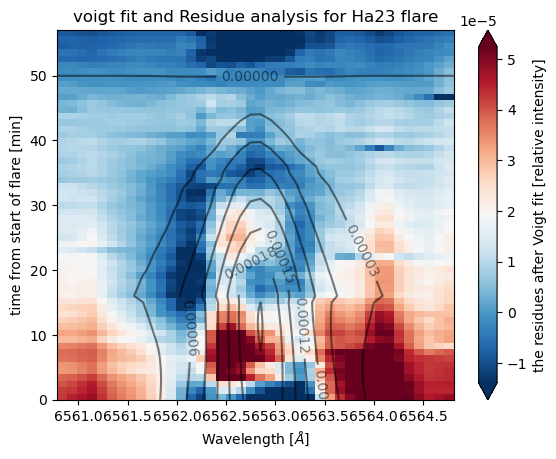

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0000269235693982
frame 0 at time 13.133333333333326 with param_fit[-1] = (array([ 8.60961590e-05,  8.54210610e+03,  1.42022774e-01, -4.33911797e-01]), array([6.08517785e-06, 2.10996053e-02, 2.83680936e-01, 1.24189870e-01])). Here comes the plot:


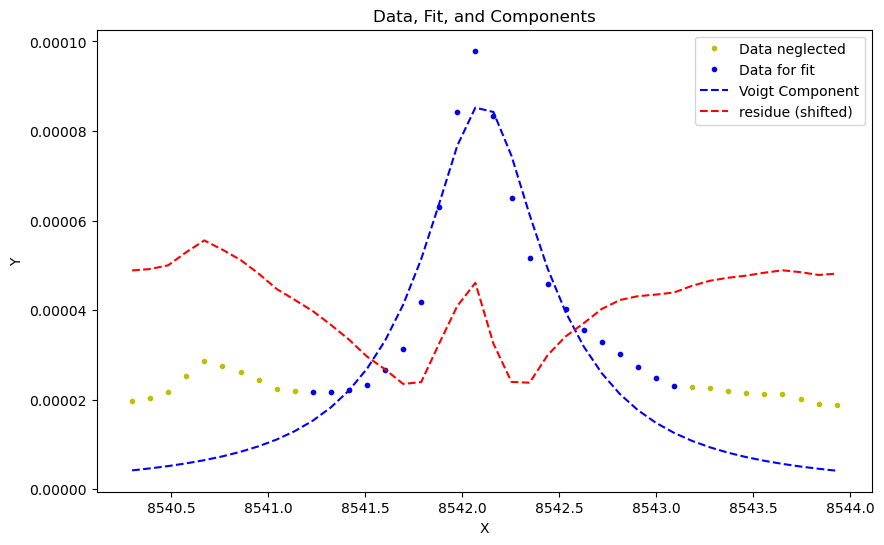

vmax = 2.7330413273421982e-05, vmin = -2.051592309234461e-05


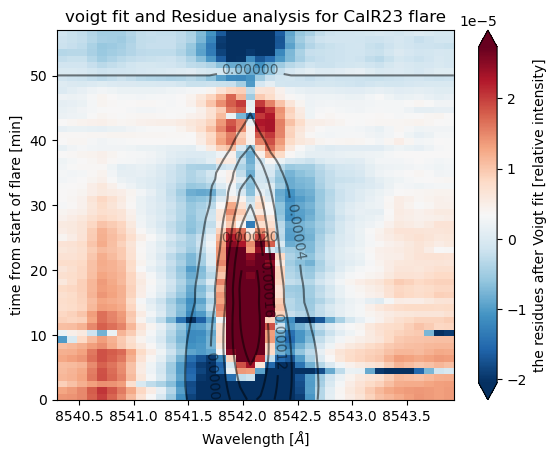

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.000249146214243
frame 0 at time 13.06666666666672 with param_fit[-1] = (array([ 1.57055974e-03,  3.96849316e+03, -1.50656833e-01,  3.77436586e-01]), array([8.51581510e-05, 1.42266863e-02, 1.21049865e-01, 5.08259181e-02])). Here comes the plot:


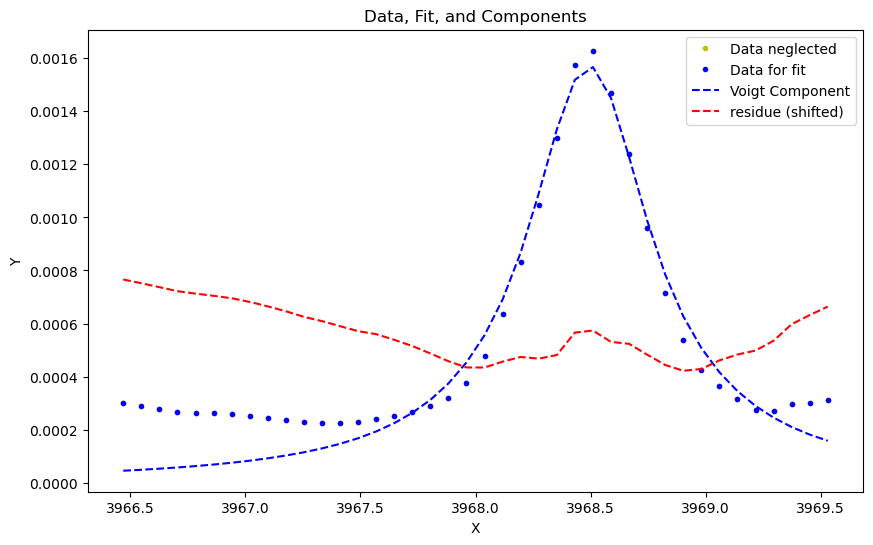

vmax = 0.0001876864325338418, vmin = -6.197158375173275e-05


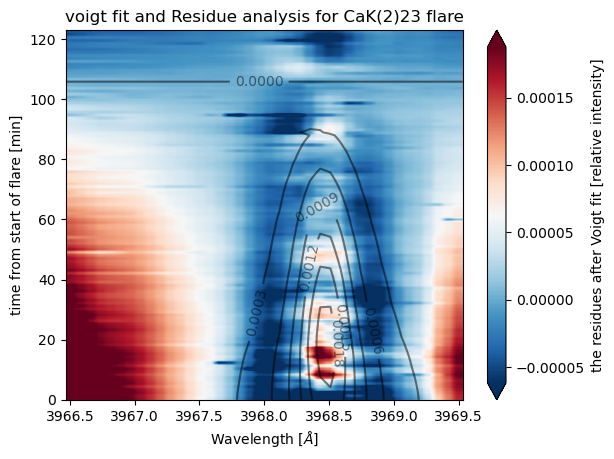

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0001224216271514
frame 0 at time 13.25 with param_fit[-1] = (array([ 4.57000949e-04,  4.86132818e+03, -1.08875394e-01,  3.78604014e-01]), array([6.15524411e-06, 3.33854538e-03, 6.16339767e-02, 3.06092681e-02])). Here comes the plot:


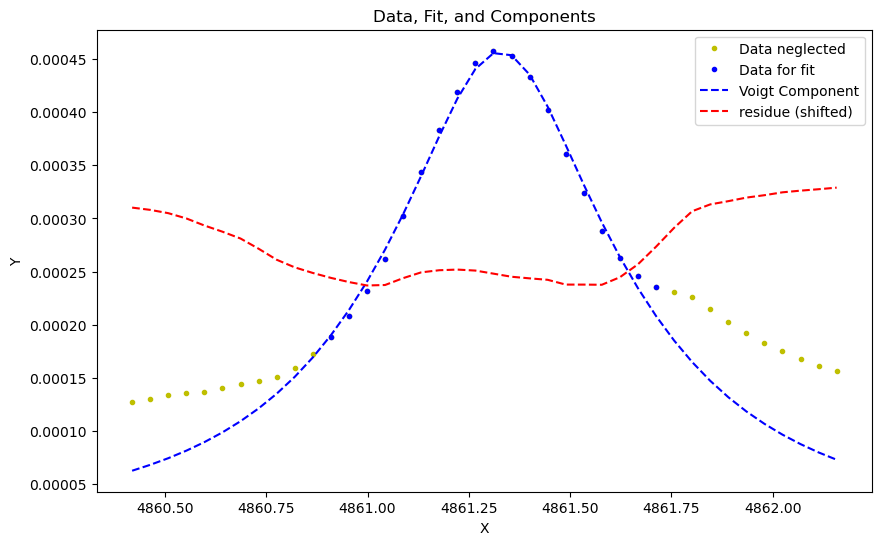

vmax = 5.574817870797424e-05, vmin = -1.335671177832148e-05


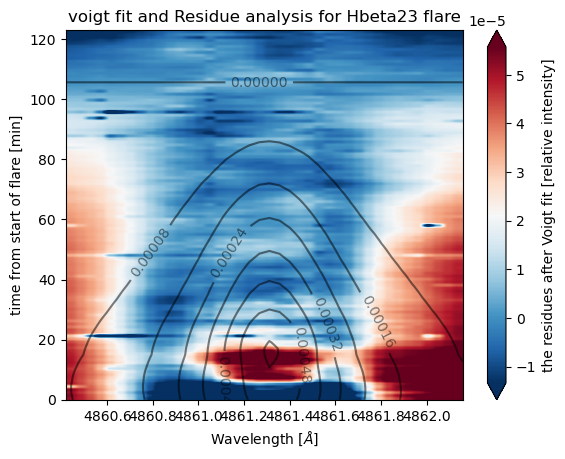

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [12]:
reload(un)
reload(un2)
reload(vf)
lines = ["He23", "Ha23", "CaIR23", "CaK(2)23", "Hbeta23"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())
un2.disgard_cont_point("CaK(2)23", data)

plot_rates = {'Ha':2100, 'Hbeta':200,  "CaK":200, "CaK(2)":200,  "CaIR":200,  "Fe6173":500, "He":20}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-8.41204361e-06,  5.87614596e+03, -1.10863891e-01,  8.69928093e-05]}
lnp=[vf.exc_wings(14, -15), vf.exc_wings(10,-9), vf.exc_wings(9,-9), [], vf.exc_wings(10,-10)]
ofs = [-3.5e-6,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

dict_keys(['area_theta_Ha15a', 'FOV_Ha15a', 'quiet_sun_Ha15a', 'nessi_Ha15a', 'True_nessi_Ha15a', 'TIME_Ha15a', 'area_theta_CaIR15a', 'FOV_CaIR15a', 'quiet_sun_CaIR15a', 'nessi_CaIR15a', 'True_nessi_CaIR15a', 'TIME_CaIR15a'])
The average is 1.0000038652709358
frame 0 at time 14.0 with param_fit[-1] = (array([-1.77100266e-05,  6.56256128e+03,  1.87013017e-01, -6.05054141e-04]), array([1.31498041e-05, 8.25241437e-03, 9.14247394e-03, 2.22568178e+01])). Here comes the plot:


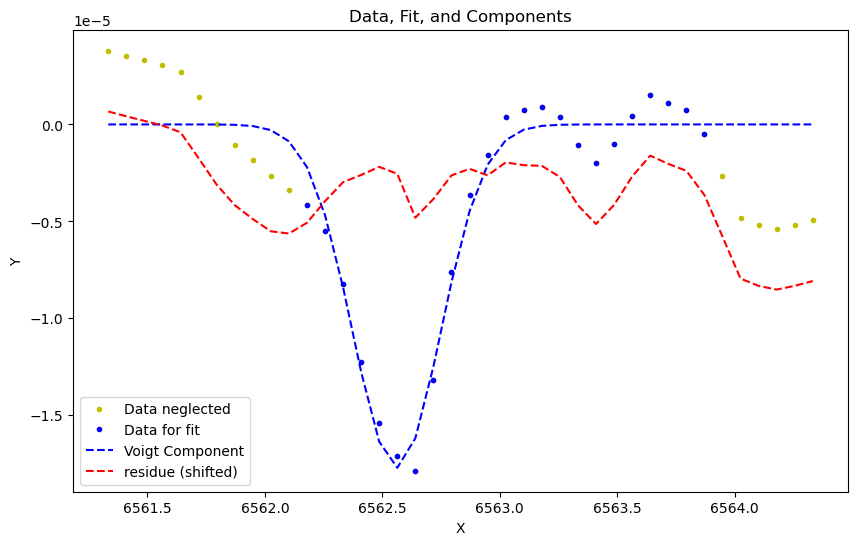

vmax = 5.4247864658191655e-05, vmin = -2.1725532831098223e-05


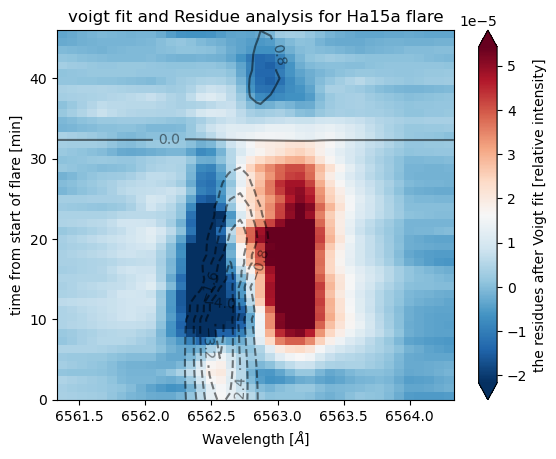

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 0.9999999975284056
frame 0 at time 14.0 with param_fit[-1] = (array([-6.37780328e-05,  8.54213442e+03, -1.37745581e-01, -2.14757972e-01]), array([1.31732699e-06, 3.74958562e-03, 1.40300018e-02, 5.80006919e-03])). Here comes the plot:


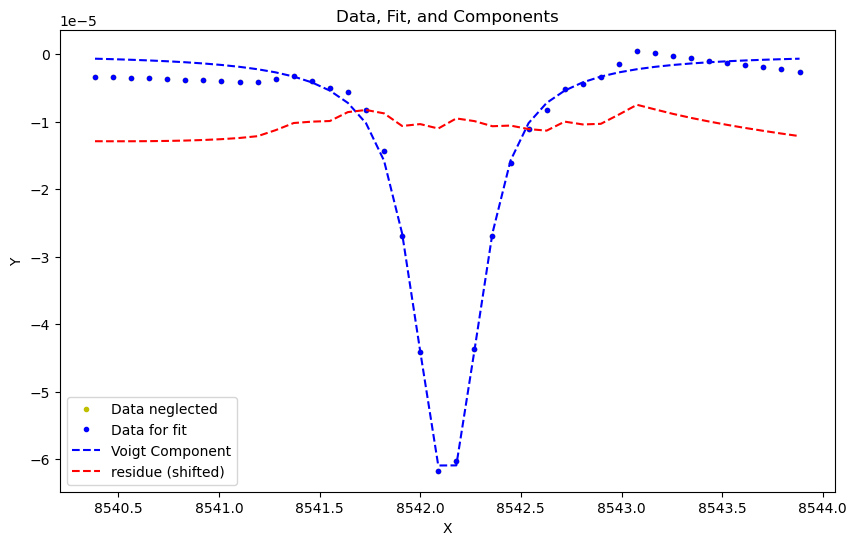

vmax = 2.2204610458821493e-05, vmin = -1.0935000475998863e-05


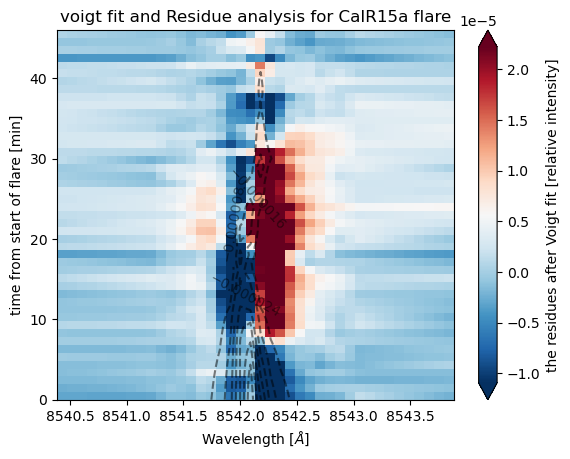

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [13]:
from voigt_fit import *

reload(un)
reload(un2)
lines = ["Ha15a", "CaIR15a"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())

plot_rates = {'Ha':1000, 'Hbeta':500,  "CaK":5, "CaK(2)":1,  "CaIR":100,  "Fe6173":50}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3933.675, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02]}
lnp=[[-1,-2,-3,-4,-5,-6,0,1,2,3,4,5,6,7,8,9,10], [], [], []]
ofs = [0.0,0.0]

make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

dict_keys(['area_theta_Hbeta17a', 'FOV_Hbeta17a', 'quiet_sun_Hbeta17a', 'nessi_Hbeta17a', 'True_nessi_Hbeta17a', 'TIME_Hbeta17a', 'area_theta_CaIR17a', 'FOV_CaIR17a', 'quiet_sun_CaIR17a', 'nessi_CaIR17a', 'True_nessi_CaIR17a', 'TIME_CaIR17a'])
Test of contrast profile and associated curves of Hbeta17a


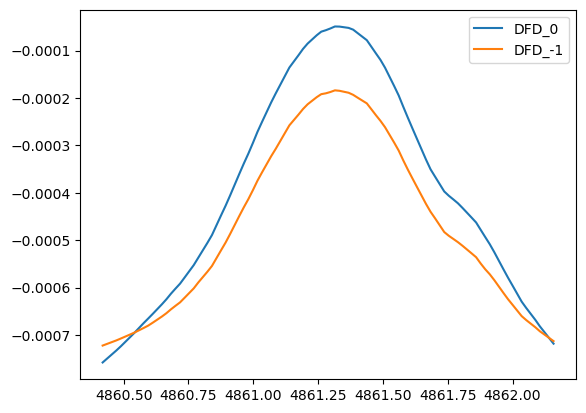

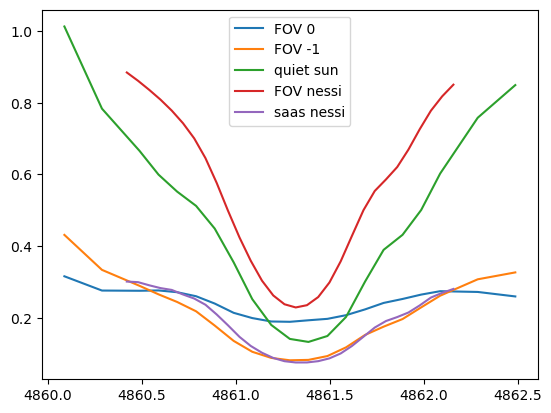

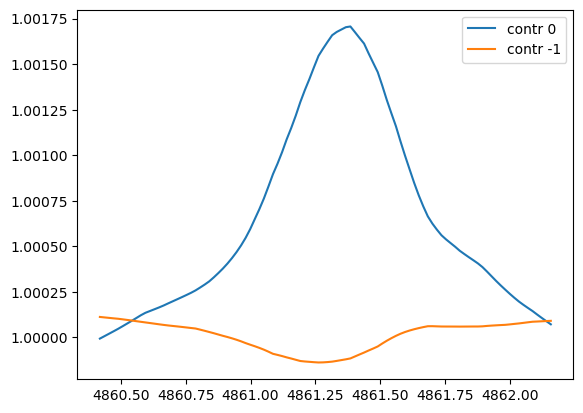

Test of contrast profile and associated curves of CaIR17a


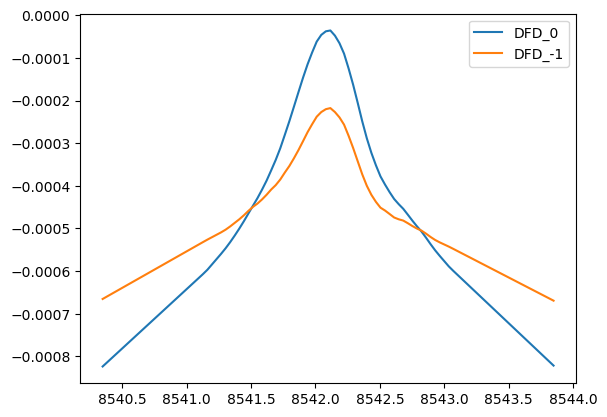

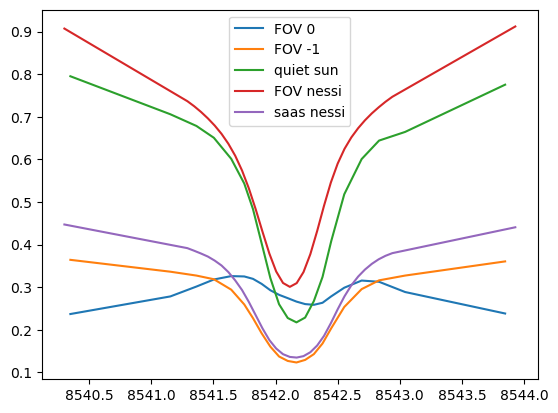

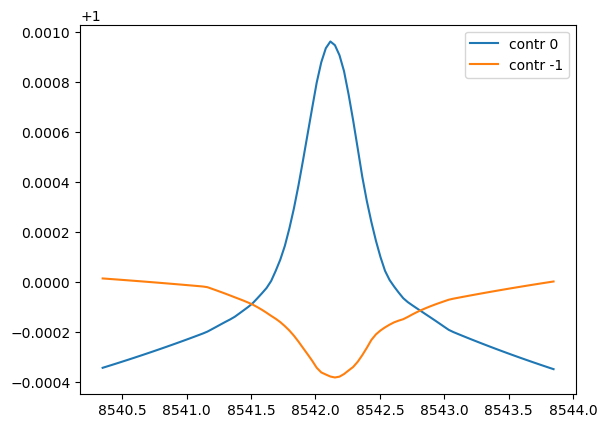

The average is 1.0002459554215923
frame 0 at time 50.39999999999998 with param_fit[-1] = (array([1.70518375e-03, 4.86136098e+03, 2.11632740e-01, 3.04698457e-01]), array([1.52264756e-05, 2.38163112e-03, 9.74341118e-03, 4.40876013e-03])). Here comes the plot:


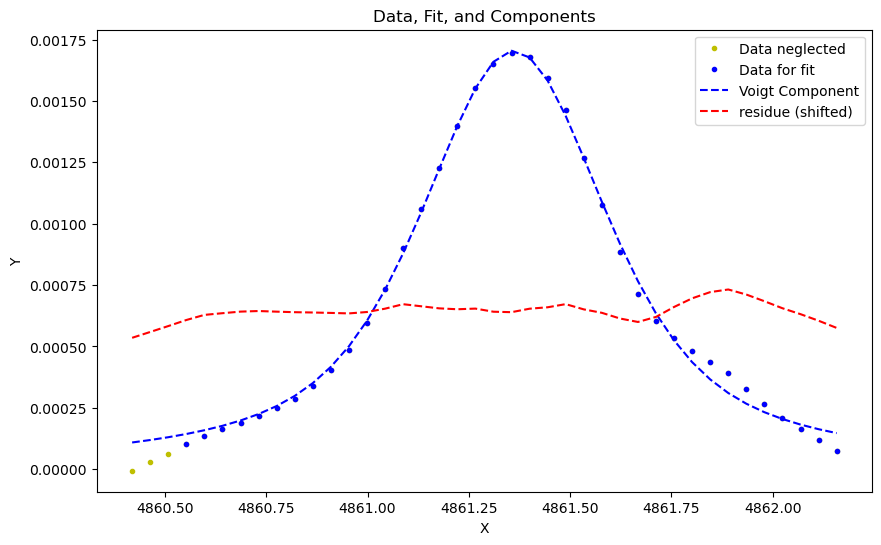

vmax = 6.861543683988513e-05, vmin = -5.443350522488246e-05


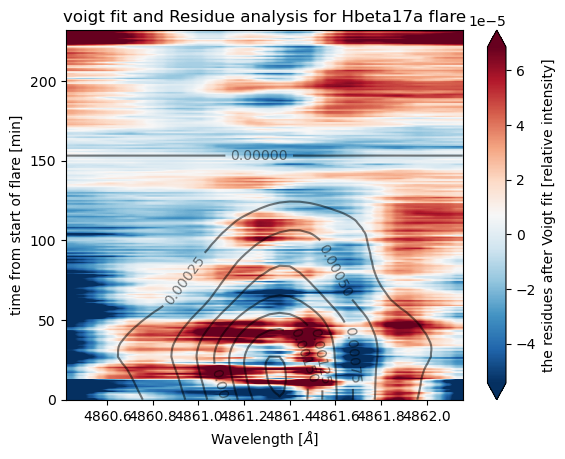

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 0.9999992636097809
frame 0 at time 50.39999999999998 with param_fit[-1] = (array([9.70391968e-04, 8.54212306e+03, 1.82975509e-01, 1.85968253e-04]), array([9.32915979e-03, 3.06705351e-02, 3.28430850e-02, 1.69341570e+03])). Here comes the plot:


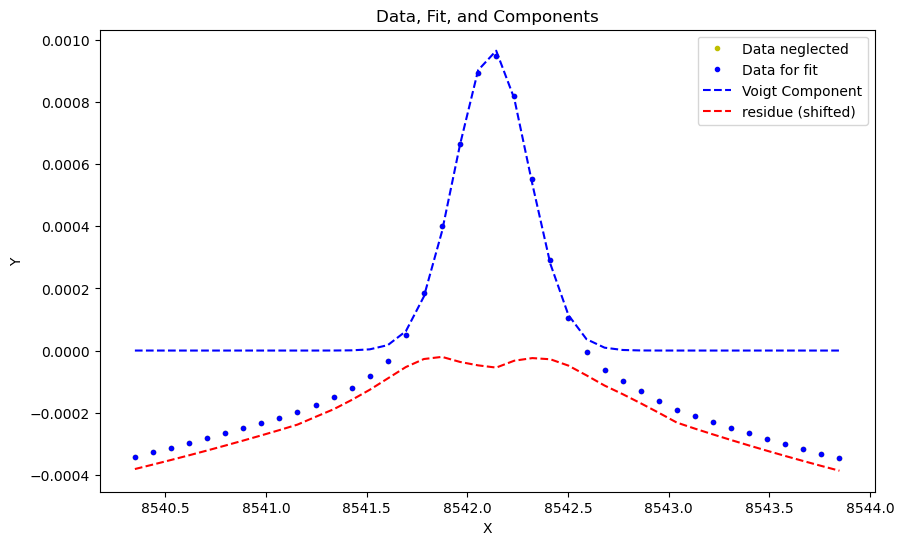

frame 30 at time 73.39999999999998 with param_fit[-1] = (array([ 8.40231386e-04,  8.54210828e+03, -2.90038443e-01,  1.95433918e-01]), array([1.50969452e-05, 5.36531749e-03, 7.34388428e-03, 3.73501368e-02])). Here comes the plot:


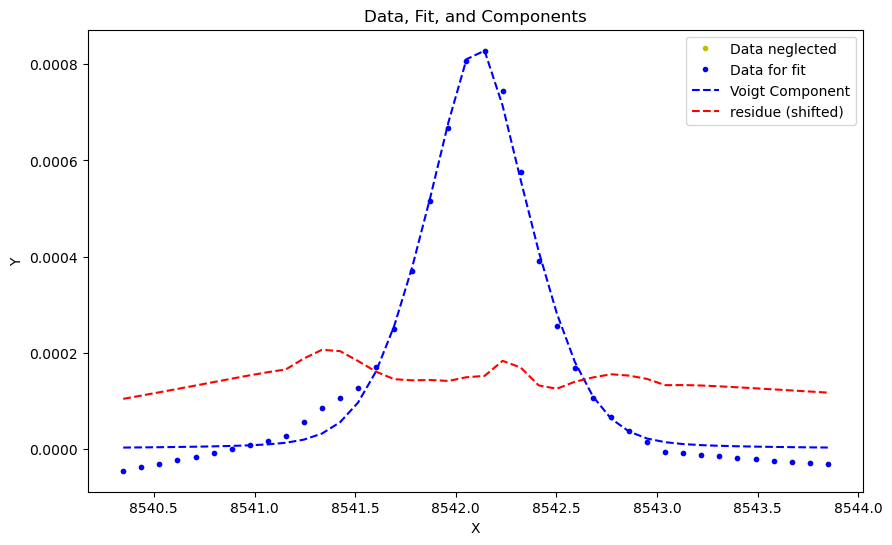

At frame 33 at time 76.39999999999998 the voigt fitting was not succesfull and average guess ([ 2.00960237e-02  8.54210469e+03 -8.52887622e-03  3.31091254e-01]) is used as params and as std of params. 
frame 60 at time 96.39999999999998 with param_fit[-1] = (array([1.54084396e-04, 8.54217225e+03, 2.99198675e-01, 1.69483536e-01]), array([4.23190445e-06, 8.52744882e-03, 1.03392263e-02, 6.96449388e-02])). Here comes the plot:


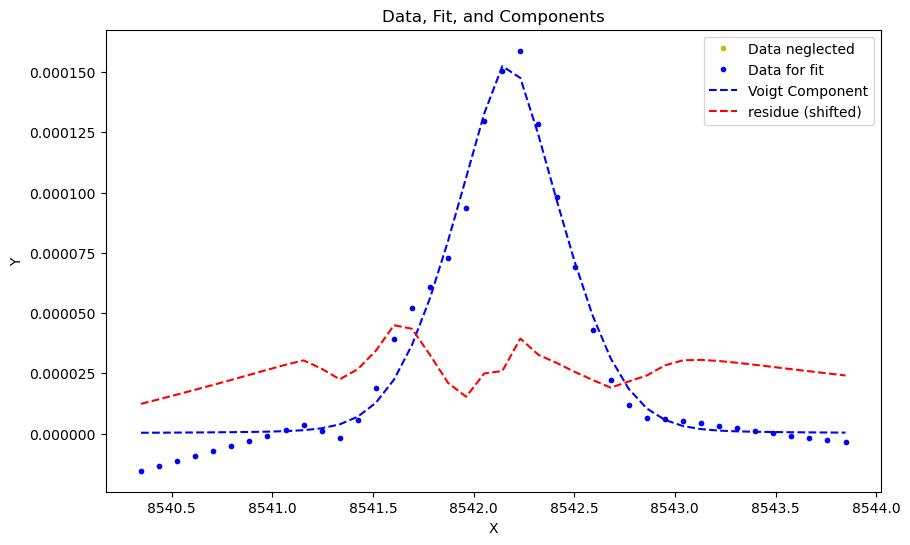

frame 90 at time 119.39999999999998 with param_fit[-1] = (array([-1.81476091e-04,  8.54221778e+03, -3.42615671e-01, -4.54107953e-04]), array([5.09965702e-03, 1.81752978e-02, 1.69438837e-02, 3.62920671e+03])). Here comes the plot:


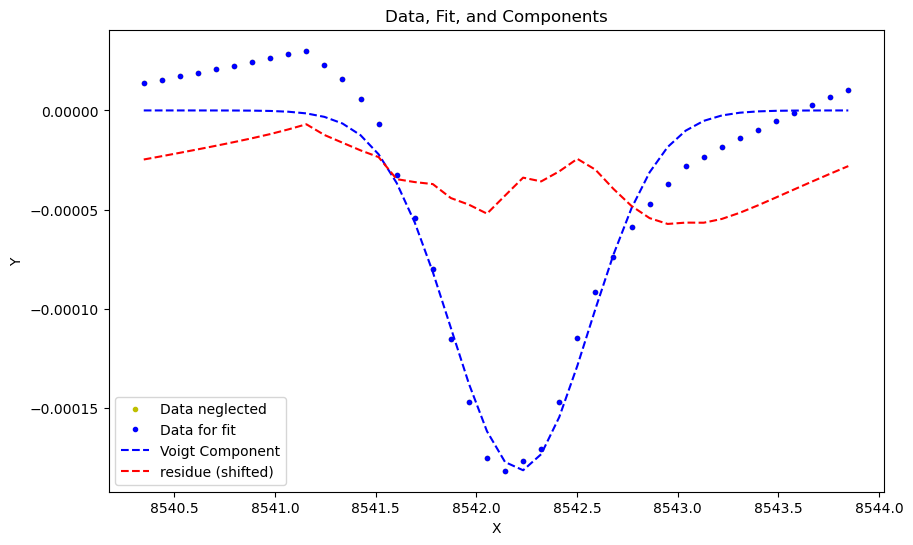

frame 120 at time 142.39999999999998 with param_fit[-1] = (array([-2.78015794e-04,  8.54217132e+03, -4.18045254e-01,  3.74444471e-01]), array([6.77302967e-06, 1.08351035e-02, 2.76155642e-02, 5.13020374e-02])). Here comes the plot:


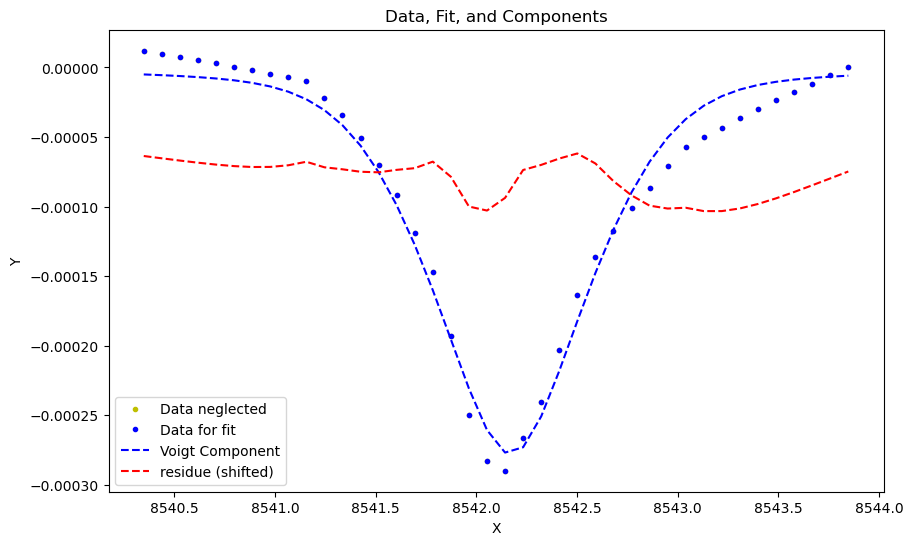

frame 150 at time 165.39999999999998 with param_fit[-1] = (array([-3.28574251e-04,  8.54218340e+03, -4.13912169e-01,  3.78130443e-01]), array([7.49971322e-06, 1.00951606e-02, 2.63733012e-02, 4.56759980e-02])). Here comes the plot:


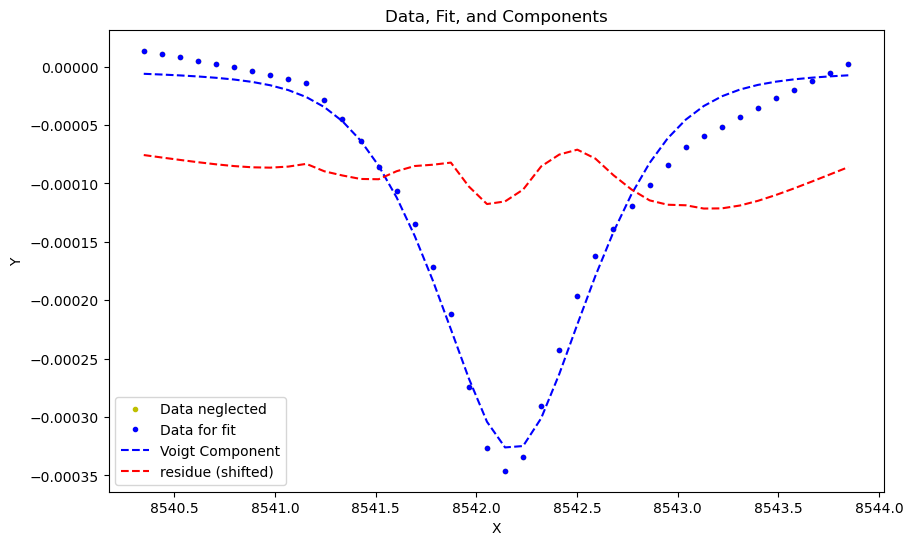

vmax = 0.00023252134065972622, vmin = -0.0001692024886354344


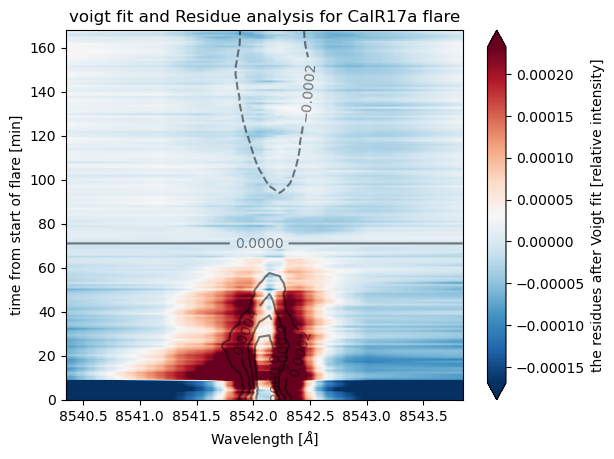

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [14]:
reload(un)
reload(un2)
lines = ["Hbeta17a", "CaIR17a"] #, "CaK17a"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$'}


data = un.load_for_further_analysis(lines)
print(data.keys())



# un2.disgard_cont_point("CaK17a", data)
# un2.split_data_in_two_lines("CaK17a", data, 3950, lines)

# print(data.keys())

plot_rates = {'Ha':500, 'Hbeta':500,  "CaK":5, "CaK(2)":1,  "CaIR":30,  "Fe6173":50}

initial_guesses = {'Ha':[5.55265545e-01, 6.56293638e+03, 5.29257897e-01, 4.96399919e-01], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3933.675, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.16409012e-01,  8.54204860e+03, -3.29762486e-01,  1.04739309e+00],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02]}
lnp=[[0,1,2], [], [], []]
ofs = [0,0,0]
reload(un2)
un2.test_contrast(data, "Hbeta17a")
un2.test_contrast(data, "CaIR17a")
# un2.test_contrast(data, "CaK17a")
vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

The average is 1.0000961851691983
frame 0 at time 4.0 with param_fit[-1] = (array([-2.69624612e-05,  6.56249513e+03,  6.46542191e-01, -8.93050831e-01]), array([2.54429872e-07, 1.96509704e-02, 1.77831747e+00, 1.41178959e+00])). Here comes the plot:


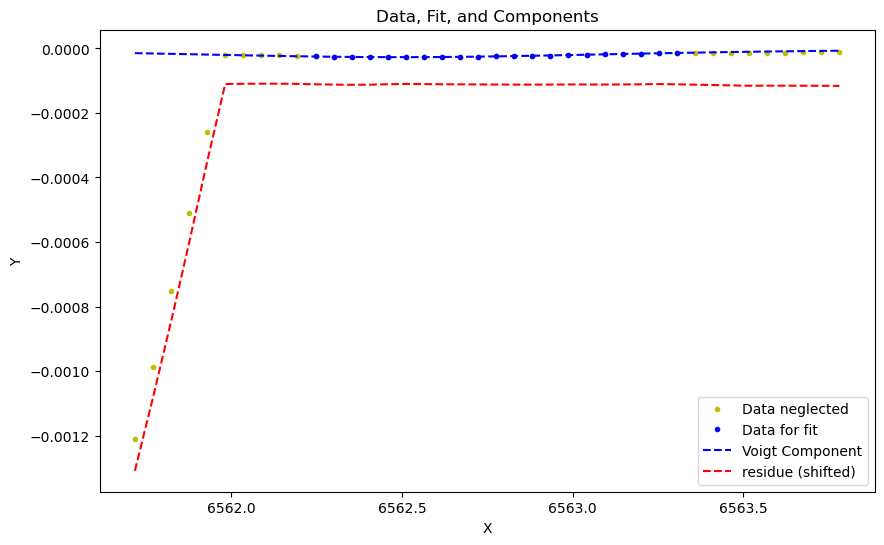

At frame 3 at time 4.2000000000000455 the voigt fitting was not succesfull and average guess ([ 5.12526796e-05  6.56274362e+03  4.98988808e-01 -8.69116444e-01]) is used as params and as std of params. 
At frame 19 at time 5.2666666666666515 the voigt fitting was not succesfull and average guess ([ 4.08298650e-05  6.56276445e+03  3.20187836e-02 -1.61190586e-02]) is used as params and as std of params. 
At frame 20 at time 5.333333333333371 the voigt fitting was not succesfull and average guess ([ 4.17932034e-05  6.56282797e+03  1.20331111e-01 -1.25881751e-01]) is used as params and as std of params. 
frame 40 at time 6.649999999999977 with param_fit[-1] = (array([ 1.91946376e-05,  6.56299099e+03,  1.58184021e-01, -1.06317347e+00]), array([7.30879911e-07, 7.79175523e-02, 7.83775832e-01, 4.55984569e-01])). Here comes the plot:


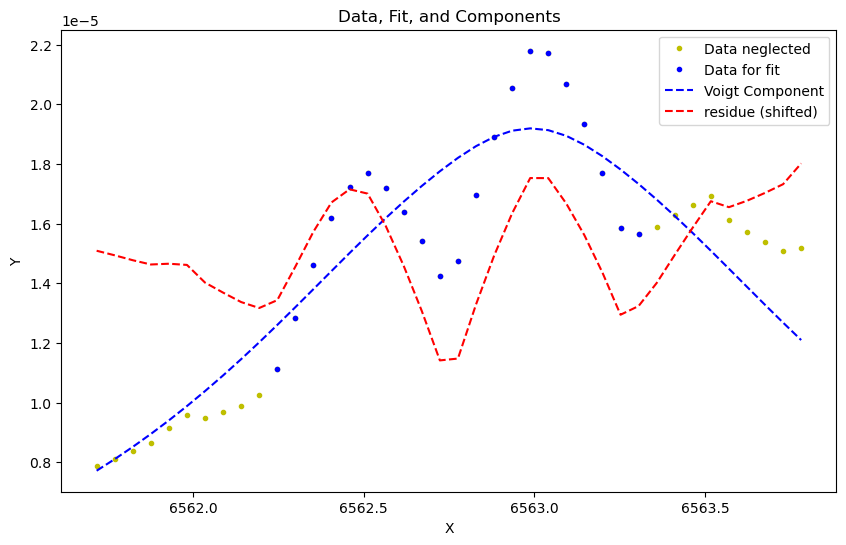

frame 80 at time 9.299999999999955 with param_fit[-1] = (array([3.67757863e-05, 6.56233478e+03, 1.83092959e-01, 5.17996432e-01]), array([1.72901527e-06, 5.58397858e-02, 3.13776098e-01, 1.59907078e-01])). Here comes the plot:


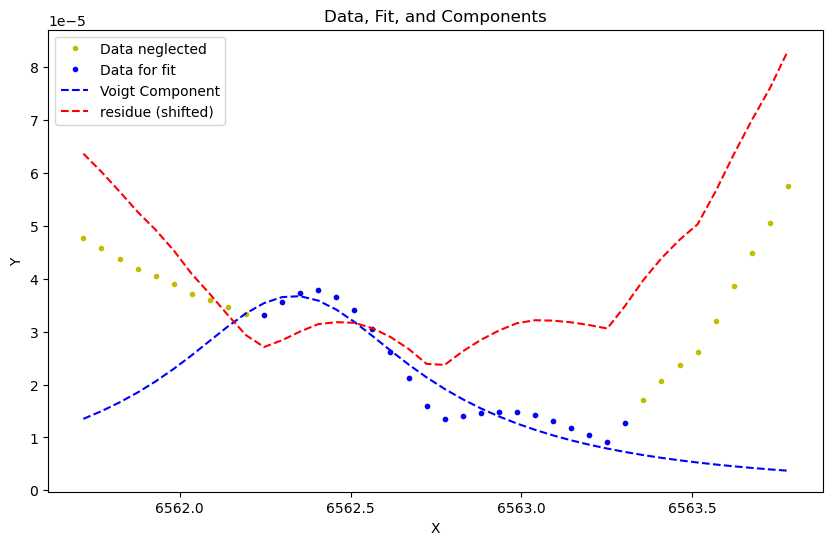

frame 120 at time 11.933333333333394 with param_fit[-1] = (array([ 1.16930279e-04,  6.56270753e+03, -2.50863185e-03, -5.68245824e-01]), array([1.98152750e-02, 1.50105651e-02, 1.09054344e+04, 3.32935626e-02])). Here comes the plot:


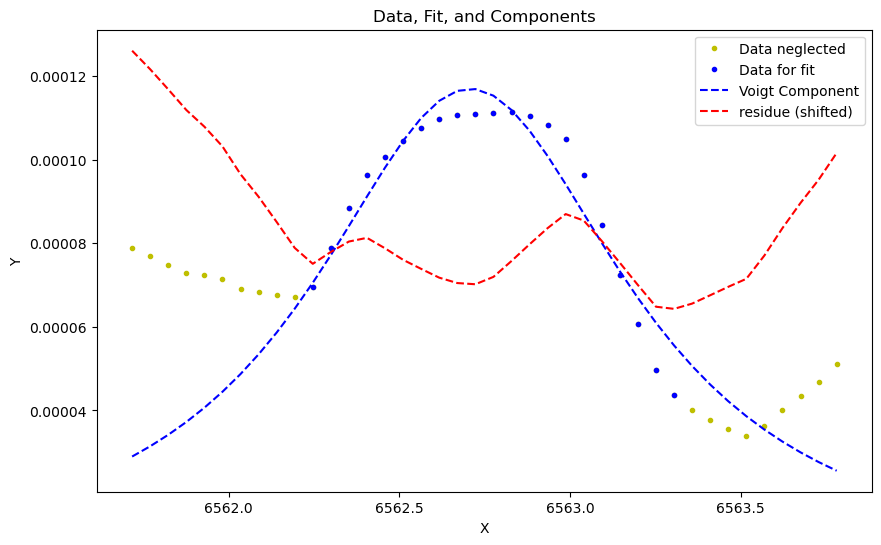

frame 160 at time 14.583333333333371 with param_fit[-1] = (array([ 2.07848790e-04,  6.56270453e+03,  4.22072832e-01, -5.40015317e-01]), array([4.30235081e-06, 1.02818773e-02, 8.93858215e-01, 8.43532644e-01])). Here comes the plot:


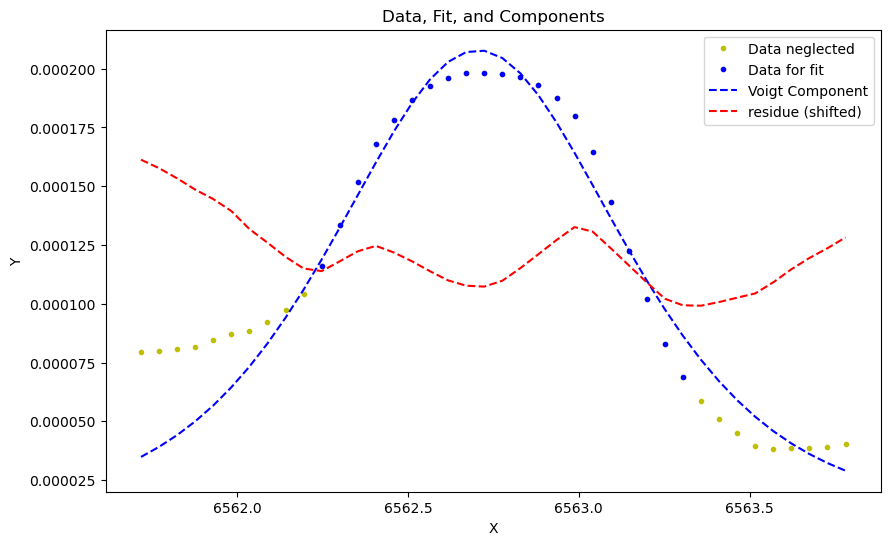

frame 200 at time 17.23333333333335 with param_fit[-1] = (array([ 3.41723119e-04,  6.56272681e+03,  3.86512670e-01, -4.72633079e-01]), array([6.52892095e-06, 7.73201515e-03, 4.92569681e-01, 5.18633575e-01])). Here comes the plot:


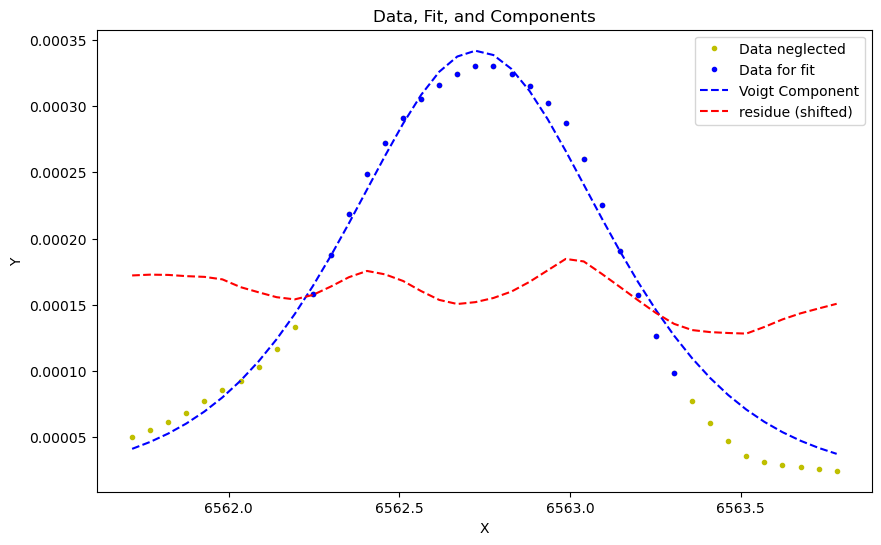

frame 240 at time 19.866666666666674 with param_fit[-1] = (array([ 4.25468659e-04,  6.56272899e+03,  3.86189704e-01, -4.74878158e-01]), array([8.16020870e-06, 7.85192865e-03, 5.16692320e-01, 5.36388648e-01])). Here comes the plot:


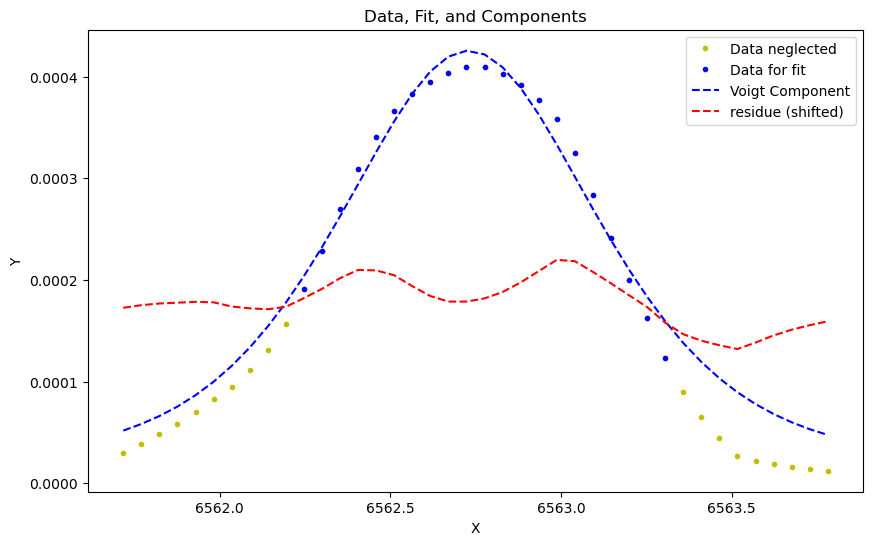

vmax = 4.3620486371473084e-05, vmin = -5.1340280163952184e-05


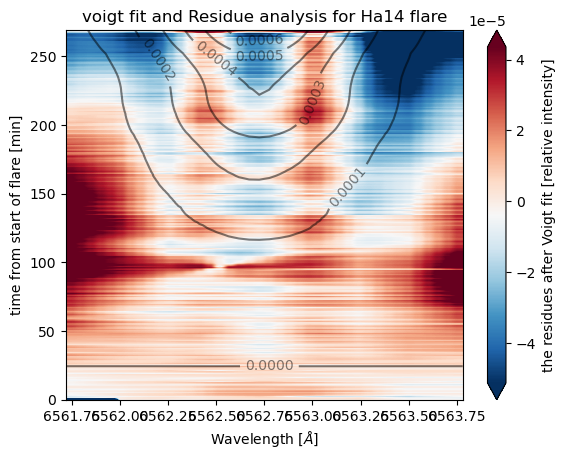

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [15]:
reload(un)
import voigt_fit as vf
reload(un2)
reload(vf)

lines = ["Ha14"]
long_names = {"Ha14":r"H$\alpha$", "CaK17":r'Ca$IIK$', "CaII17":r'Ca$II 8542 \AA$'}

off = 0
np = [0,1,2,3,4,5,6,7,8,9,-9,-8,-7,-6,-5,-4,-3,-2,-1]

data = un.load_for_further_analysis(lines)
vf.make_analysis('Ha14', data,[ 2.84297279e-04,  6.56271736e+03,  3.92943576e-01, -4.84529906e-01], 
              plot_rate=40, offset=off, neglect_points=np)

dict_keys(['area_theta_Ha17', 'FOV_Ha17', 'quiet_sun_Ha17', 'nessi_Ha17', 'True_nessi_Ha17', 'TIME_Ha17', 'area_theta_CaK17', 'FOV_CaK17', 'quiet_sun_CaK17', 'nessi_CaK17', 'True_nessi_CaK17', 'TIME_CaK17', 'area_theta_CaII17', 'FOV_CaII17', 'quiet_sun_CaII17', 'nessi_CaII17', 'True_nessi_CaII17', 'TIME_CaII17'])
Test of contrast profile and associated curves of Ha17


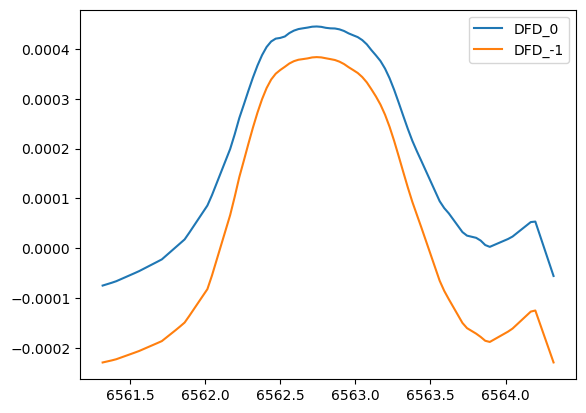

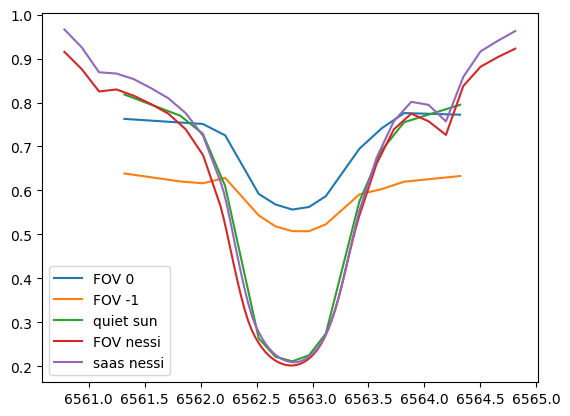

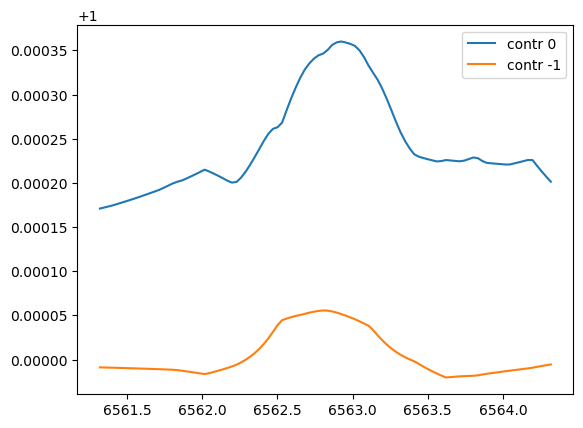

In [9]:
lines = ["Ha17", "CaK17", "CaII17"]
long_names = {"Ha17":r"H$\alpha$", "CaK17":r'Ca$IIK$', "CaII17":r'Ca$II 8542 \AA$'}


data = un.load_for_further_analysis(lines)
un2.disgard_cont_point("CaK17", data)
print(data.keys())
reload(un2)
un2.test_contrast(data, "Ha17")

range(-11, 14)
The average is 1.000209289513023
frame 0 at time 3.75 with param_fit[-1] = (array([3.60540282e-04, 6.56290443e+03, 6.76823399e-01, 3.90007235e-01]), array([3.95898376e-06, 6.00626960e-03, 2.45528758e-02, 1.65591884e-01])). Here comes the plot:


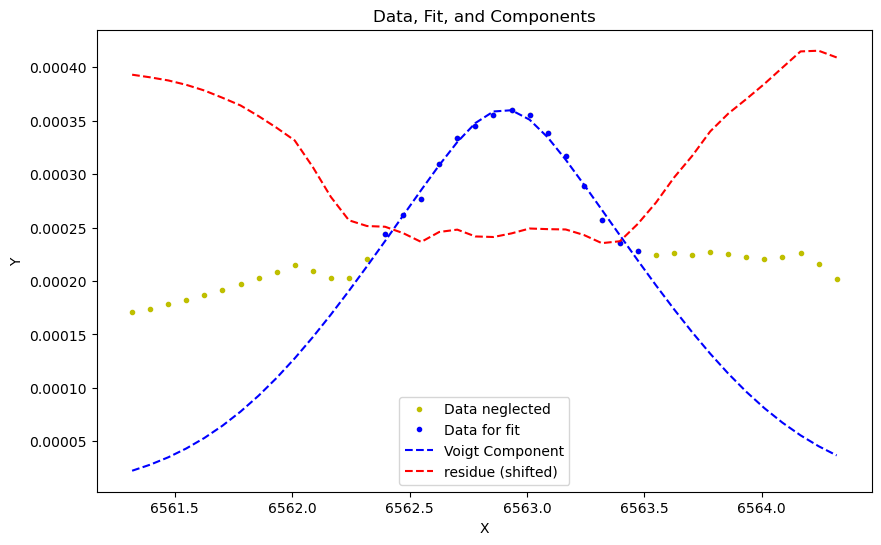

frame 50 at time 16.216666666666583 with param_fit[-1] = (array([9.60578799e-04, 6.56285075e+03, 3.03982298e-01, 5.35847721e-01]), array([6.26457048e-06, 2.99631585e-03, 3.97554065e-02, 1.26526817e-02])). Here comes the plot:


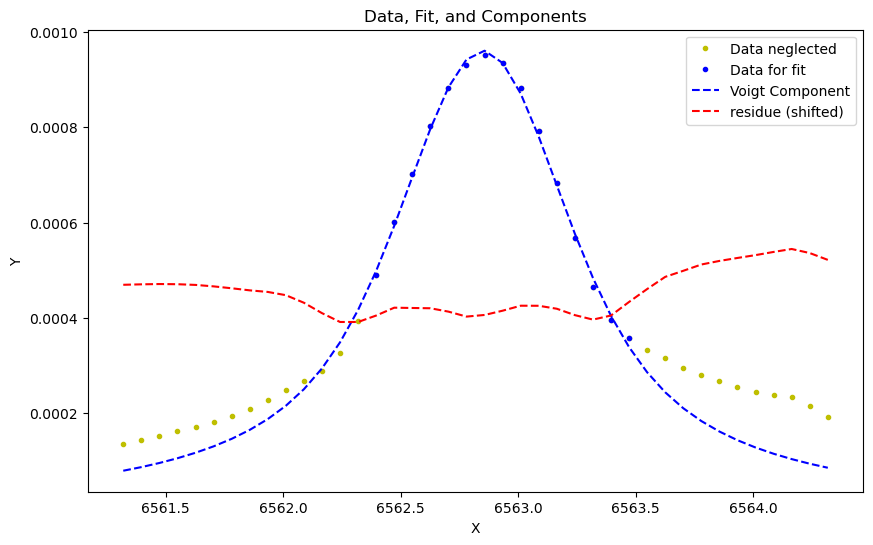

frame 100 at time 28.68333333333328 with param_fit[-1] = (array([3.95563338e-04, 6.56282052e+03, 2.75858114e-01, 5.63592158e-01]), array([2.15698754e-06, 2.62872618e-03, 2.64719730e-02, 5.93963038e-03])). Here comes the plot:


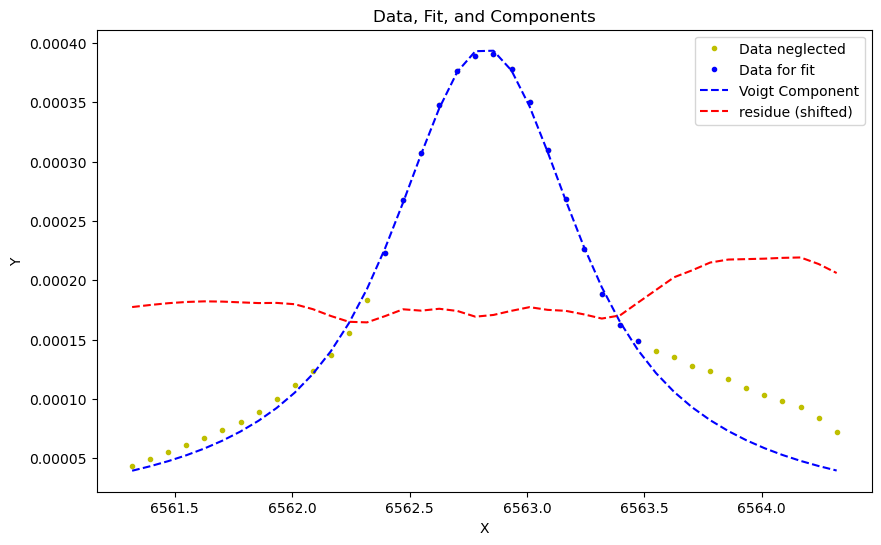

frame 150 at time 41.16666666666663 with param_fit[-1] = (array([5.72037979e-05, 6.56277547e+03, 1.98696833e-01, 6.40431971e-01]), array([8.43926782e-07, 7.72218292e-03, 1.03510655e-01, 4.61213272e-02])). Here comes the plot:


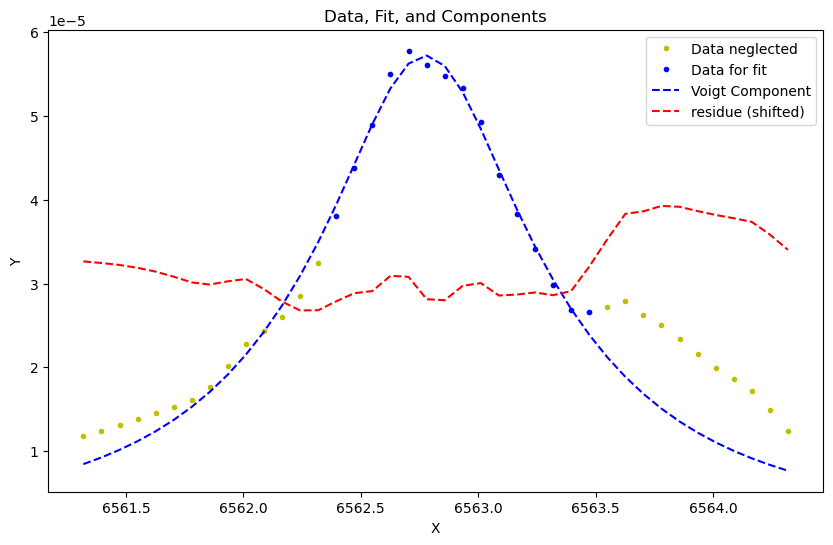

frame 200 at time 53.633333333333326 with param_fit[-1] = (array([1.03636593e-04, 6.56285315e+03, 3.77499597e-01, 2.33682775e-07]), array([inf, inf, inf, inf])). Here comes the plot:


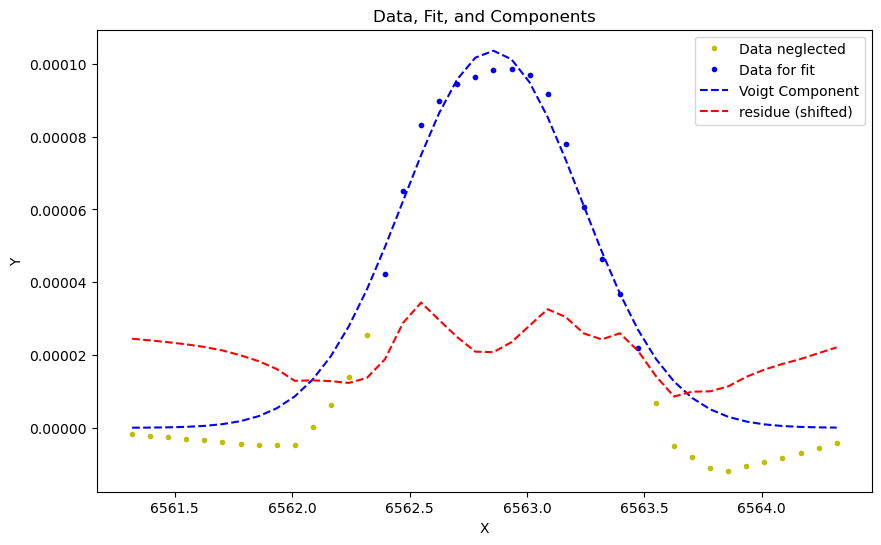

vmax = 0.0001917022666155546, vmin = -3.8525410968854774e-05


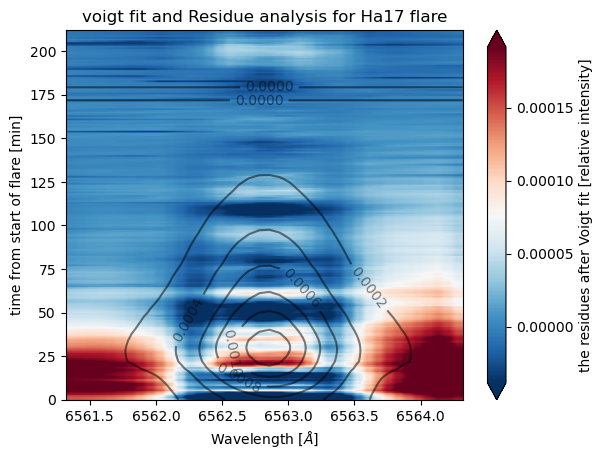

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [17]:
reload(vf)
list_exc = vf.exc_wings(13, -11)
print(list_exc)
vf.make_analysis('Ha17', data,[5.55265545e-01, 6.56293638e+03, 5.29257897e-01, 4.96399919e-01], 
              plot_rate=50, offset=0, neglect_points=list_exc)

range(-5, 4)
The average is 1.0002303991307586
frame 0 at time 3.75 with param_fit[-1] = (array([-5.01425667e-04,  8.54220163e+03, -1.38841087e-01, -4.77830366e-06]), array([1.03555350e-02, 1.20701111e-02, 1.26296058e-02, 4.22385062e+02])). Here comes the plot:


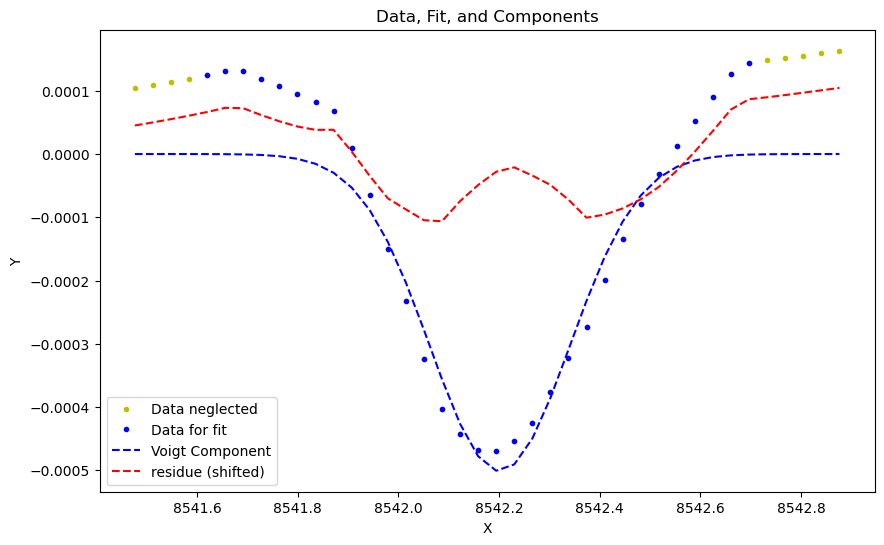

At frame 4 at time 4.75 the voigt fitting was not succesfull and average guess ([-2.35882516e-04  8.54220516e+03 -1.87863054e-01 -4.77654522e-05]) is used as params and as std of params. 
At frame 5 at time 5.0 the voigt fitting was not succesfull and average guess ([-2.35882516e-04  8.54220516e+03 -1.87863054e-01 -4.77654522e-05]) is used as params and as std of params. 
frame 50 at time 16.216666666666583 with param_fit[-1] = (array([ 9.75386973e-04,  8.54217590e+03, -2.92762143e-01, -3.61053264e-01]), array([1.51074834e-05, 5.45061327e-03, 1.07253176e-01, 1.00946554e-01])). Here comes the plot:


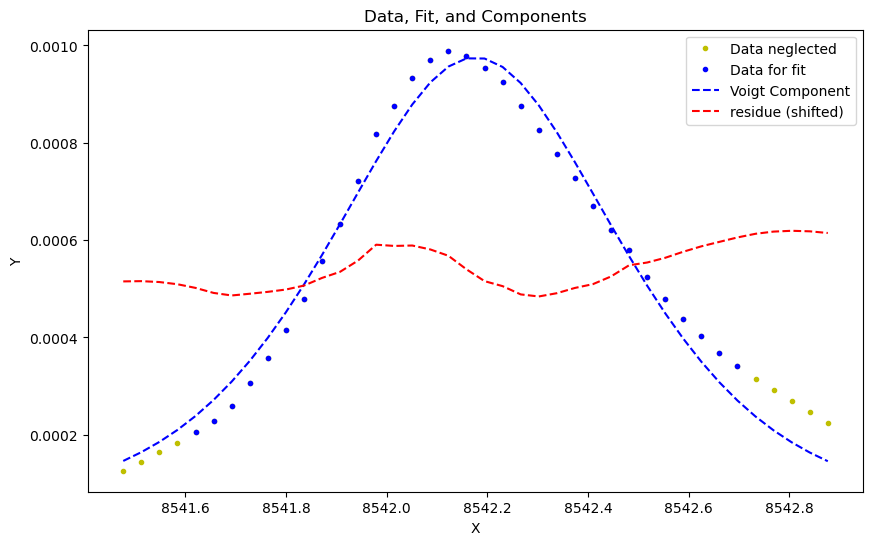

frame 100 at time 28.699999999999932 with param_fit[-1] = (array([ 3.46339338e-04,  8.54217906e+03, -3.52211538e-01, -4.24195776e-01]), array([9.29463816e-06, 1.01562107e-02, 5.15960681e-01, 5.58506445e-01])). Here comes the plot:


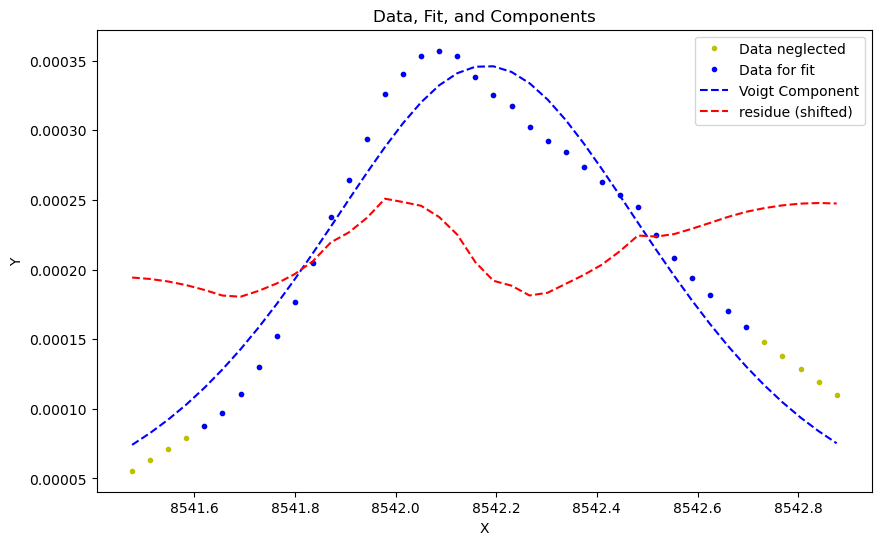

frame 150 at time 41.16666666666663 with param_fit[-1] = (array([ 7.73138771e-05,  8.54213785e+03, -4.08749666e-01, -2.74107237e-01]), array([2.72732142e-06, 9.78961787e-03, 1.65388862e-02, 2.80283027e-01])). Here comes the plot:


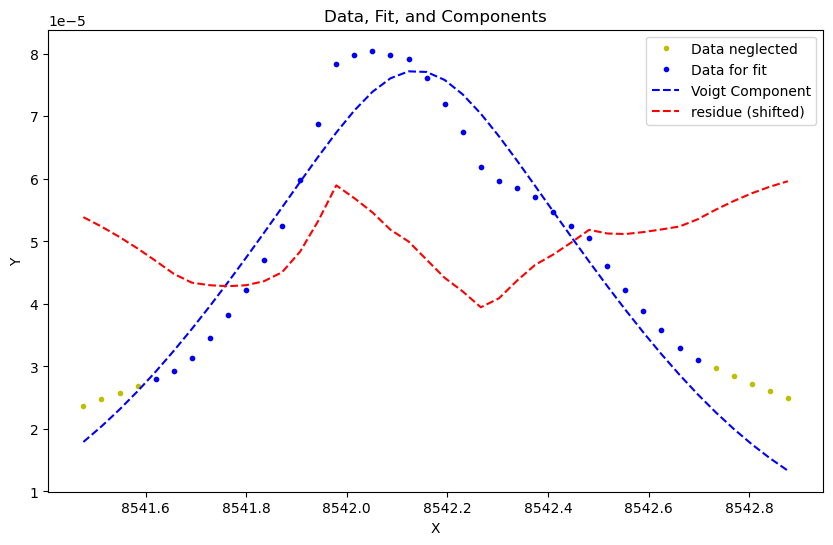

At frame 175 at time 47.39999999999998 the voigt fitting was not succesfull and average guess ([ 7.00000000e-05  8.54220317e+03 -2.84932183e-01 -2.61301961e-04]) is used as params and as std of params. 
At frame 176 at time 47.64999999999998 the voigt fitting was not succesfull and average guess ([ 7.00000000e-05  8.54220317e+03 -2.84932183e-01 -2.61301961e-04]) is used as params and as std of params. 
At frame 177 at time 47.89999999999998 the voigt fitting was not succesfull and average guess ([ 7.00000000e-05  8.54220317e+03 -2.84932183e-01 -2.61301961e-04]) is used as params and as std of params. 
At frame 179 at time 48.39999999999998 the voigt fitting was not succesfull and average guess ([ 4.06303821e-05  8.54226699e+03 -2.27039540e-01 -2.58421964e-04]) is used as params and as std of params. 
frame 200 at time 53.64999999999998 with param_fit[-1] = (array([ 5.56206562e-05,  8.54218888e+03, -1.98753409e-01, -1.56629696e-04]), array([1.52863428e-03, 4.37124158e-02, 4.39782331e-02

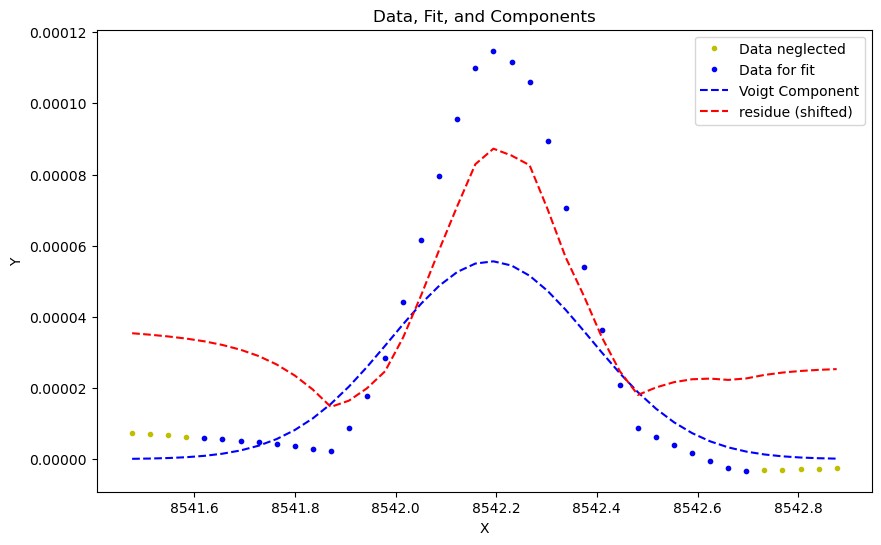

vmax = 0.00021884847239386724, vmin = -5.685475831647718e-05


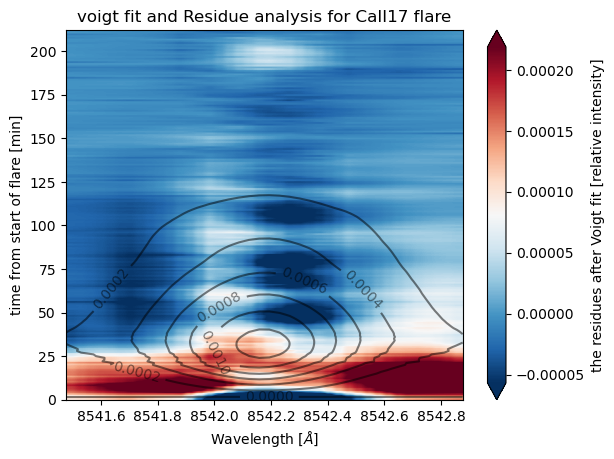

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [11]:
list_exc = vf.exc_wings(3,-5)
print(list_exc)
vf.make_analysis('CaII17', data,[7*10**-5,  8.542203173e+03, -2.84932183e-01, -2.61301961e-04],
                 plot_rate=50, offset=10**-5, neglect_points=list_exc, exclude_frames=range(162, 175))
# , fix_ind=[0,1, 2, 3]

The average is 1.001267554112325
frame 0 at time 3.0 with param_fit[-1] = (array([ 1.95422682e-03,  3.93385427e+03,  4.61640106e-01, -7.31365622e-01]), array([5.82156657e-05, 1.89691747e-02, 1.55709188e-01, 6.16529605e-02])). Here comes the plot:


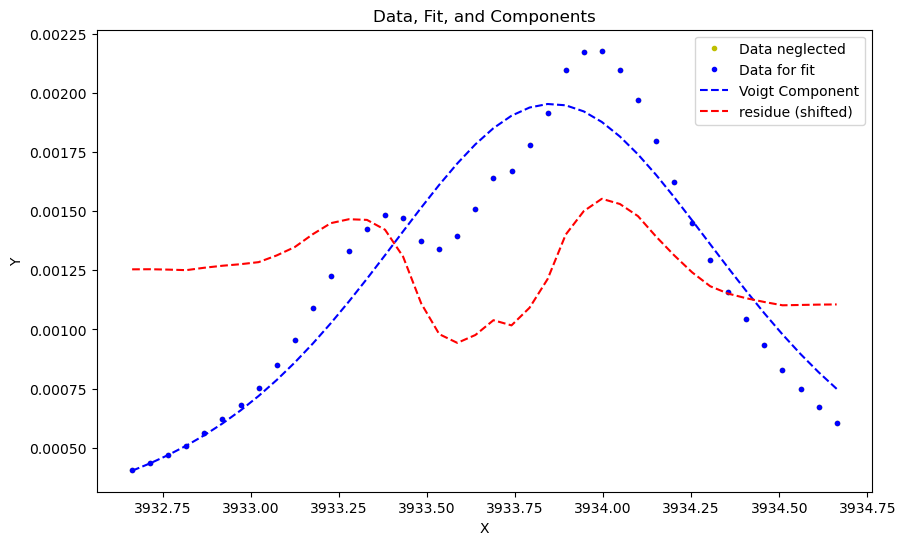

frame 50 at time 8.366666666666674 with param_fit[-1] = (array([ 7.68244111e-03,  3.93367204e+03, -9.13798123e-02, -3.23456591e-01]), array([6.30458138e-05, 2.32289865e-03, 2.92858095e-02, 1.19725419e-02])). Here comes the plot:


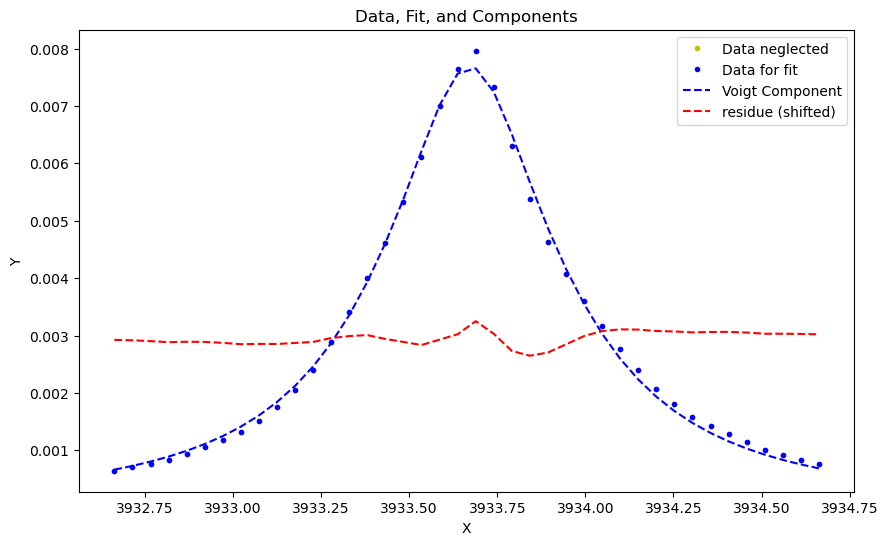

frame 100 at time 13.616666666666674 with param_fit[-1] = (array([ 6.22165966e-03,  3.93368951e+03, -2.78088572e-02, -3.18988514e-01]), array([0.00010908, 0.00302595, 0.04576463, 0.00554536])). Here comes the plot:


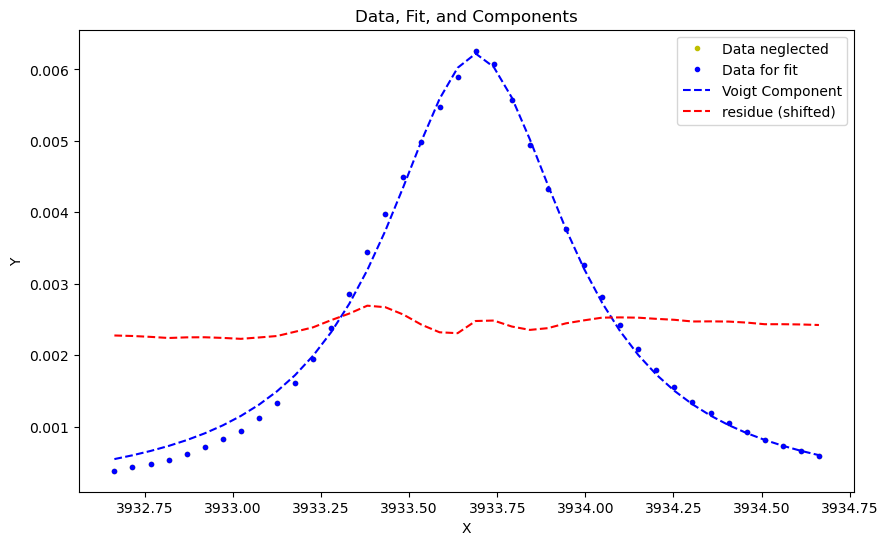

frame 150 at time 18.98333333333335 with param_fit[-1] = (array([ 4.57343894e-03,  3.93370101e+03, -1.21793346e-03, -3.17513789e-01]), array([2.82519940e-01, 3.63444693e-03, 2.11239467e+03, 5.37216311e-03])). Here comes the plot:


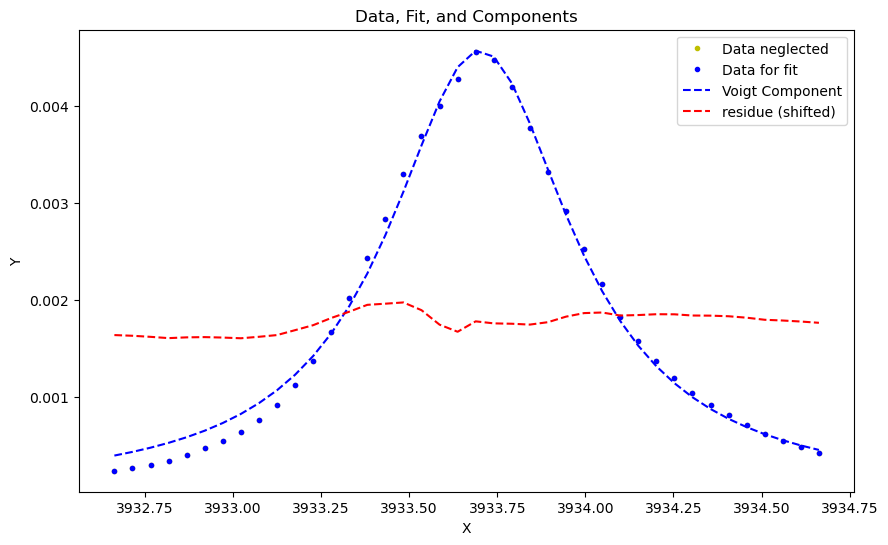

frame 200 at time 24.283333333333303 with param_fit[-1] = (array([ 2.70275230e-03,  3.93369061e+03,  3.83820891e-04, -3.22301212e-01]), array([4.24378358e-03, 4.90716799e-03, 3.77779409e+02, 7.50346792e-03])). Here comes the plot:


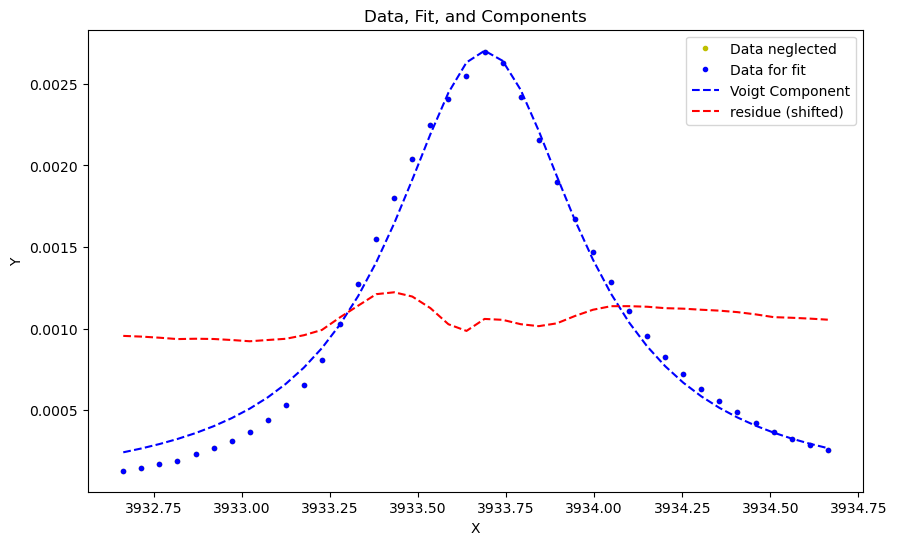

frame 250 at time 29.950000000000045 with param_fit[-1] = (array([ 1.56230495e-03,  3.93370415e+03,  2.70922714e-03, -3.49359040e-01]), array([6.67522333e-01, 8.03026768e-03, 9.62486941e+03, 1.12686844e-02])). Here comes the plot:


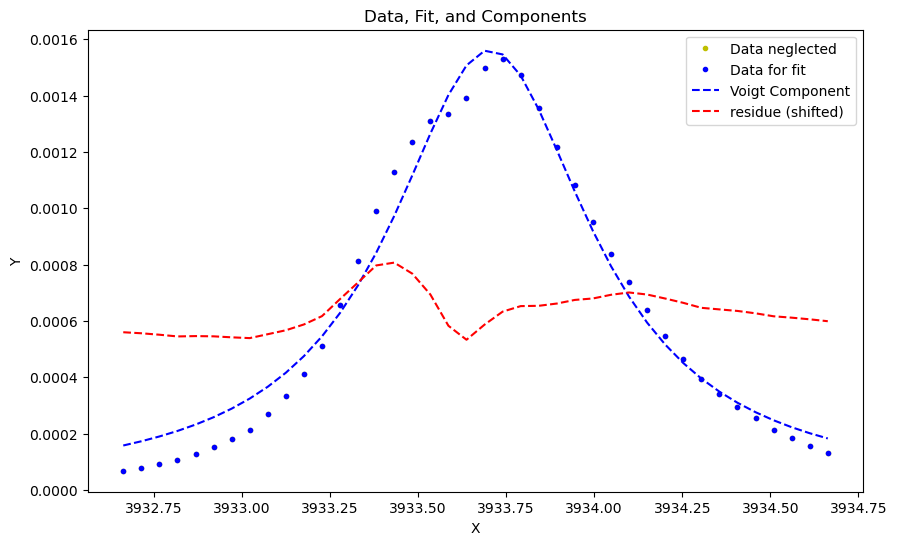

frame 300 at time 35.83333333333337 with param_fit[-1] = (array([ 1.18160576e-03,  3.93368781e+03, -3.93203435e-02, -2.53393104e-01]), array([1.47920776e-05, 2.40100547e-03, 2.18367366e-02, 5.49043884e-03])). Here comes the plot:


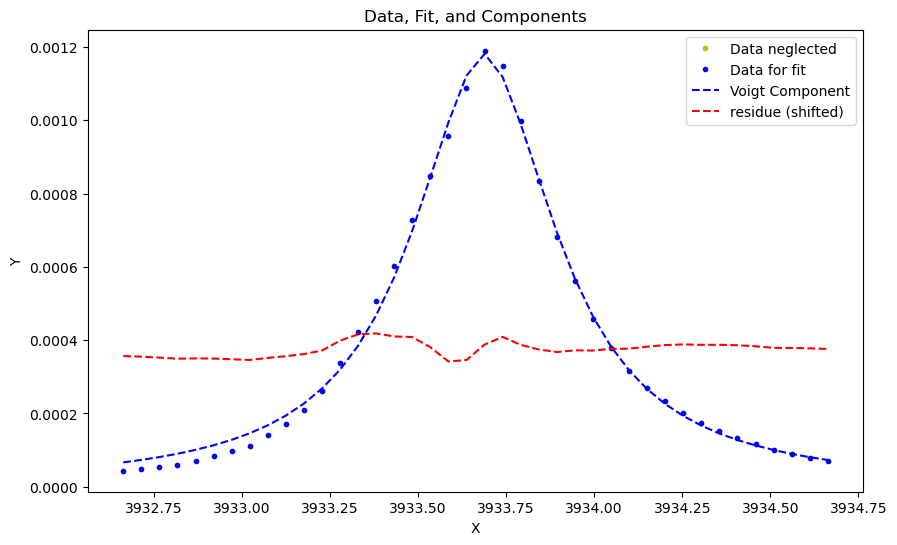

frame 350 at time 41.31666666666672 with param_fit[-1] = (array([ 4.23815445e-04,  3.93364247e+03, -1.21174090e-01, -2.68088761e-01]), array([1.16687406e-05, 5.38032730e-03, 3.44051413e-02, 1.39235999e-02])). Here comes the plot:


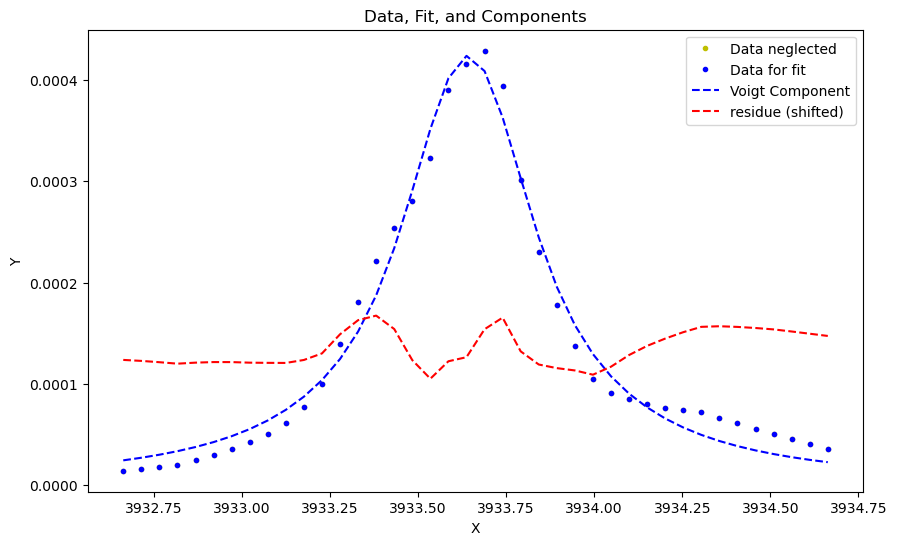

vmax = 0.00019338937166766998, vmin = -0.00020671760299158633


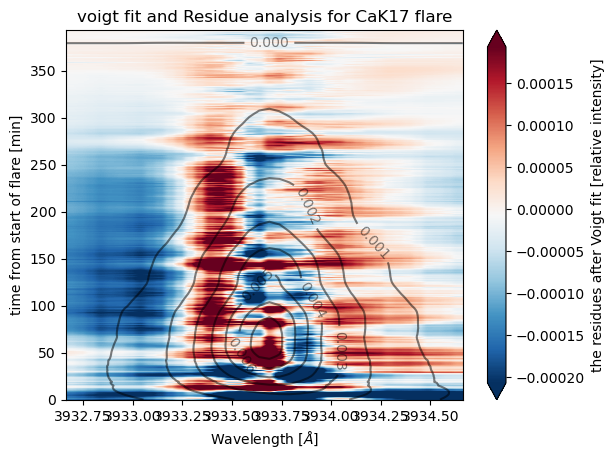

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [19]:
vf.make_analysis('CaK17', data,[4.5, 3933.675, -2.66732183e-01, 2.2284e-1], plot_rate=50, offset=0)

# X2.2 flare at 9 o'clock

In [5]:
lines = ["Ha17_9u", "CaIR17_9u", "CaK17_9u"]
long_names = {"Ha17_9u":r"H$\alpha$"}

data = un.load_for_further_analysis(lines)
un2.disgard_cont_point("CaK17_9u", data)

data.keys()

dict_keys(['area_theta_Ha17_9u', 'FOV_Ha17_9u', 'quiet_sun_Ha17_9u', 'nessi_Ha17_9u', 'True_nessi_Ha17_9u', 'TIME_Ha17_9u', 'area_theta_CaIR17_9u', 'FOV_CaIR17_9u', 'quiet_sun_CaIR17_9u', 'nessi_CaIR17_9u', 'True_nessi_CaIR17_9u', 'TIME_CaIR17_9u', 'area_theta_CaK17_9u', 'FOV_CaK17_9u', 'quiet_sun_CaK17_9u', 'nessi_CaK17_9u', 'True_nessi_CaK17_9u', 'TIME_CaK17_9u'])

The average is 1.0000699781180502
frame 0 at time 7.0 with param_fit[-1] = (array([6.27623375e-04, 6.56285218e+03, 1.18295111e-04, 3.38282193e-01]), array([1.15855699e-03, 1.25084974e-02, 9.03430736e+02, 2.03923119e-02])). Here comes the plot:


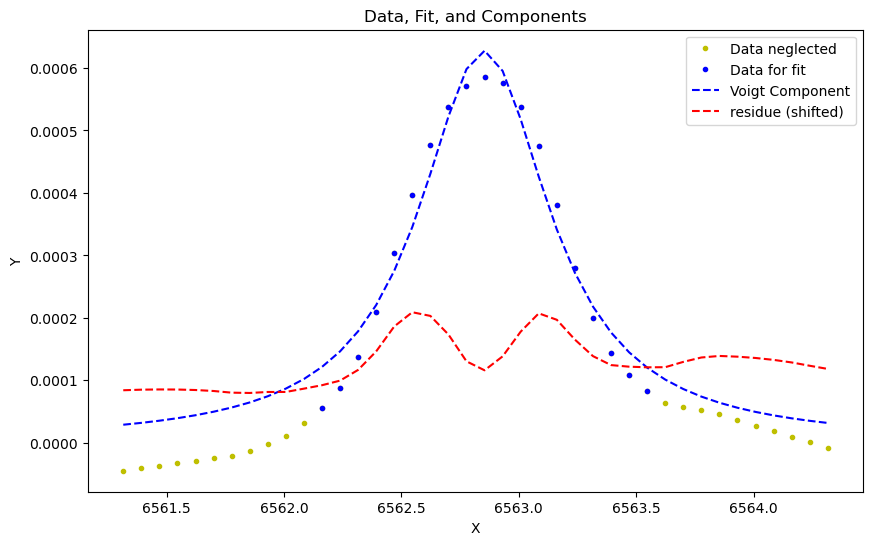

frame 150 at time 44.41666666666663 with param_fit[-1] = (array([ 1.11315189e-04,  6.56277086e+03,  2.54880717e-01, -7.45225244e-05]), array([1.39085031e-04, 1.32105065e-02, 1.32129385e-02, 5.45174185e+02])). Here comes the plot:


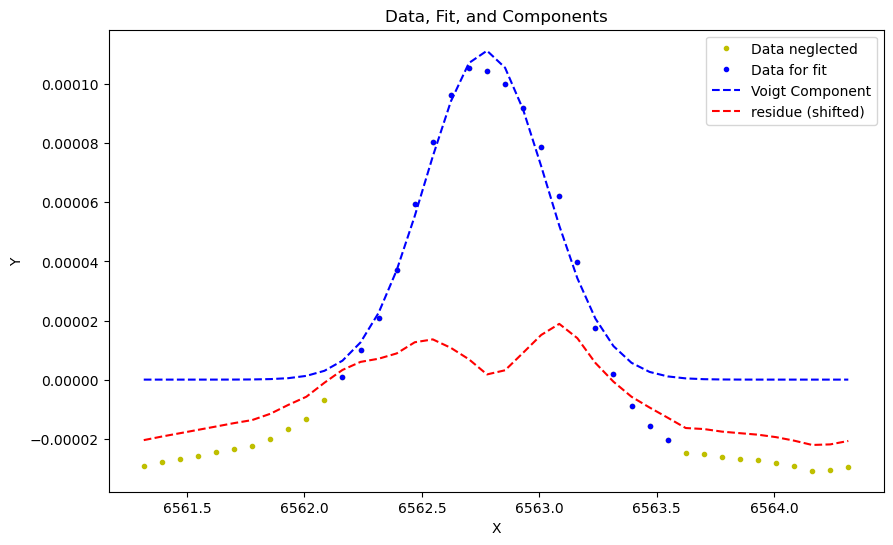

At frame 177 at time 51.14999999999998 the voigt fitting was not succesfull and average guess ([6.57165731e-02 6.56280752e+03 1.94991832e-01 1.15672547e-01]) is used as params and as std of params. 
At frame 180 at time 51.89999999999998 the voigt fitting was not succesfull and average guess ([6.57061976e-02 6.56301054e+03 1.80165404e-01 3.22461644e-01]) is used as params and as std of params. 
At frame 181 at time 52.14999999999998 the voigt fitting was not succesfull and average guess ([6.57020258e-02 6.56311388e+03 2.08387090e-01 4.67830815e-01]) is used as params and as std of params. 
At frame 183 at time 52.64999999999998 the voigt fitting was not succesfull and average guess ([6.56961510e-02 6.56322846e+03 3.56998903e-01 6.65364080e-01]) is used as params and as std of params. 
At frame 187 at time 53.64999999999998 the voigt fitting was not succesfull and average guess ([6.57050300e-02 6.56290616e+03 4.39923305e-01 4.25524572e-01]) is used as params and as std of params. 
At fr

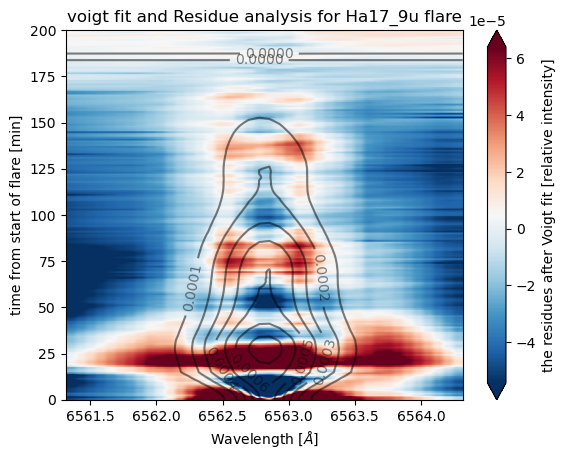

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0000773436782795
frame 0 at time 7.0 with param_fit[-1] = (array([ 2.43643971e-04,  8.54216001e+03, -1.64807056e-01, -1.16459694e-02]), array([2.45067045e-05, 7.88611456e-03, 8.53998225e-03, 1.45759624e-01])). Here comes the plot:


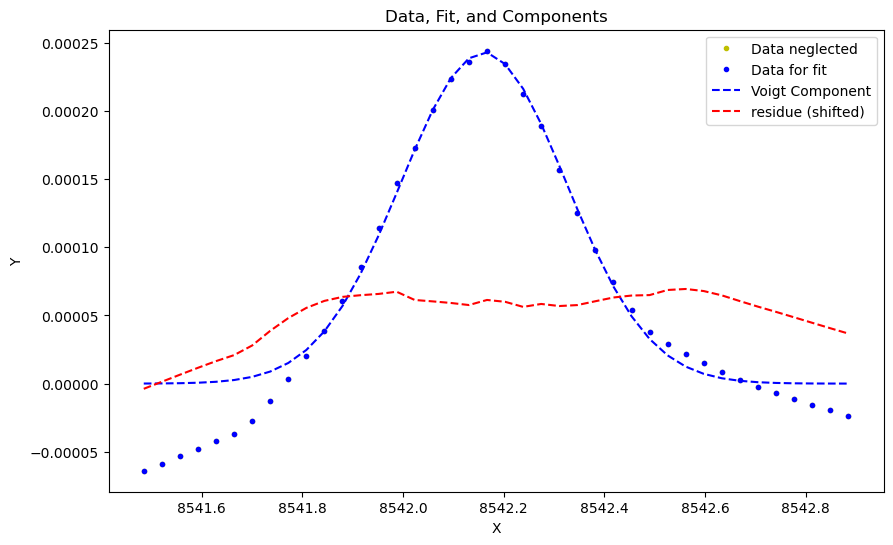

frame 150 at time 44.41666666666674 with param_fit[-1] = (array([ 8.89717614e-05,  8.54217535e+03, -1.48729882e-01,  4.62063030e-04]), array([2.76919713e-03, 1.20757343e-02, 1.29781487e-02, 7.46165521e+02])). Here comes the plot:


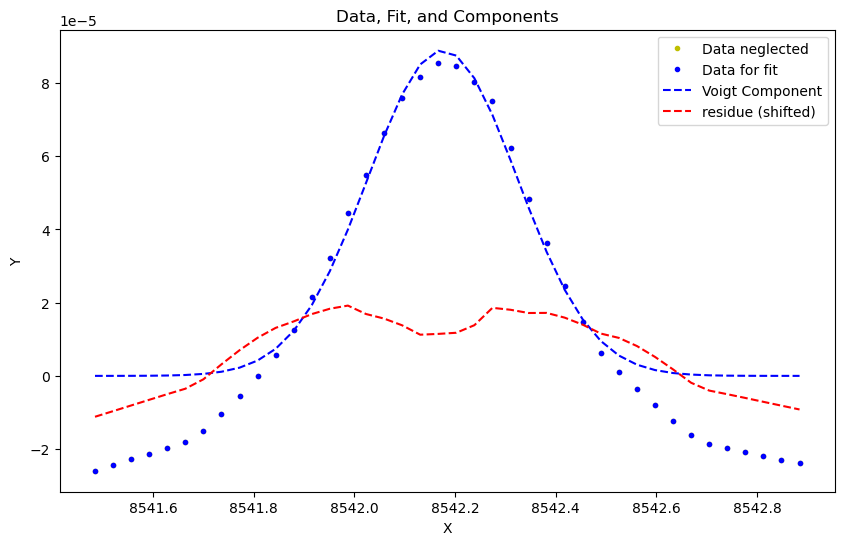

At frame 176 at time 50.90000000000009 the voigt fitting was not succesfull and average guess ([ 2.26339022e-05  8.54202116e+03 -1.26566416e-01 -2.28103667e-02]) is used as params and as std of params. 
At frame 197 at time 56.13333333333344 the voigt fitting was not succesfull and average guess ([ 1.15835687e-05  8.54200370e+03 -1.52577057e-01  1.72733852e-01]) is used as params and as std of params. 
vmax = 5.746827050238642e-05, vmin = -4.4650711714726515e-05


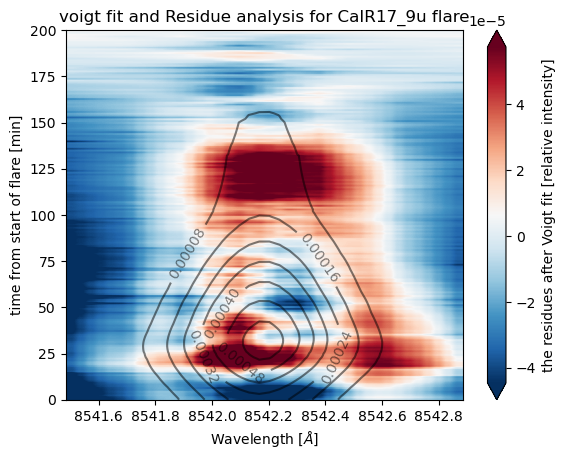

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0024063909472285
frame 0 at time 7.0 with param_fit[-1] = (array([ 1.59046637e-02,  3.93374322e+03, -5.72544852e-02,  2.84409609e-01]), array([0.00028672, 0.00441408, 0.04029795, 0.01313206])). Here comes the plot:


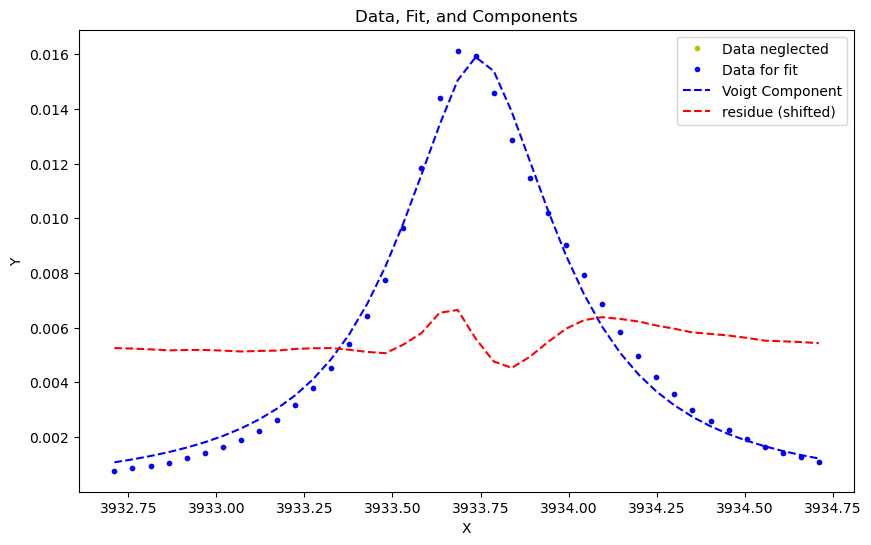

frame 150 at time 26.966666666666697 with param_fit[-1] = (array([1.00664804e-02, 3.93371422e+03, 4.13977784e-05, 2.08642867e-01]), array([2.31944046e-02, 1.87585061e-03, 2.71455674e+02, 2.75445517e-03])). Here comes the plot:


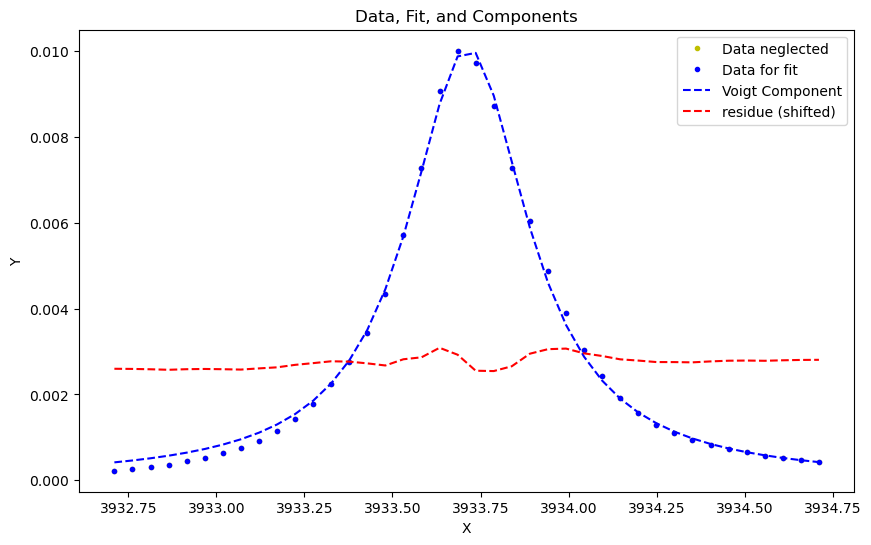

frame 300 at time 45.549999999999955 with param_fit[-1] = (array([ 1.83086017e-03,  3.93369125e+03, -9.26023730e-04,  1.64653950e-01]), array([6.06931352e-01, 5.40977899e-03, 4.85334316e+03, 8.83130059e-03])). Here comes the plot:


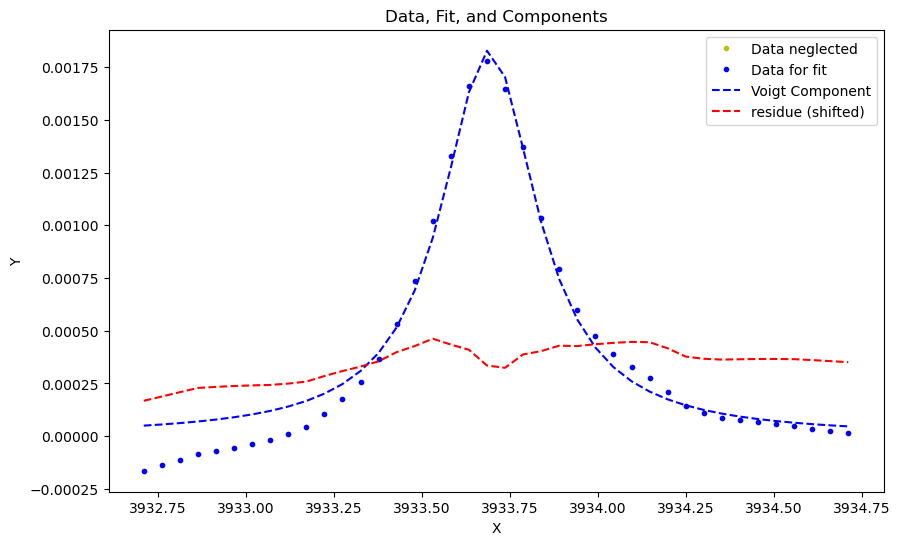

At frame 371 at time 53.75 the voigt fitting was not succesfull and average guess ([ 7.50055766e-01  3.93401591e+03 -4.78759746e-01  2.75441268e-01]) is used as params and as std of params. 
vmax = 0.0004940099593034946, vmin = -0.0005154347479968285


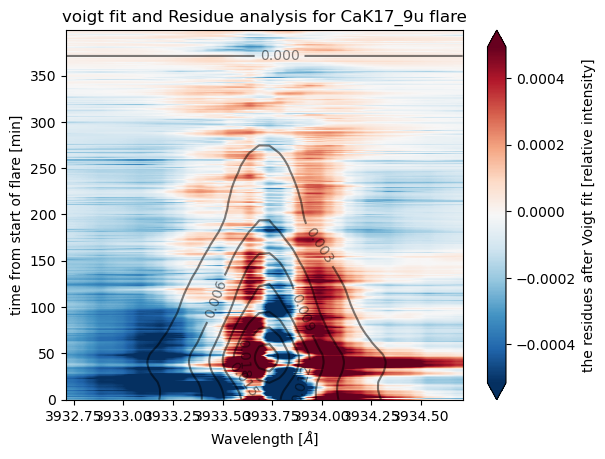

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [6]:
initial_guesses = {'Ha':[5.55265545e-01*0.71, 6.56293638e+03, 5.29257897e-01*0.71, 4.96399919e-01/0.71],
                   "CaK":[4.5, 3933.675, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[  8.89702566e-05,  8.54217535e+03, -1.48732076e-01, -1.85796350e-04],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02]}
list_neglect_points = [vf.exc_wings(10,-10), [], []]
vf.make_full_analysis(data, lines, init_guesses=initial_guesses, offsets=[0,0,0], 
                   plot_rate=150, list_neglect_points=list_neglect_points)


# the C1.3 flare 2013

dict_keys(['area_theta_Ha13', 'FOV_Ha13', 'quiet_sun_Ha13', 'nessi_Ha13', 'True_nessi_Ha13', 'TIME_Ha13'])
The average is 1.0000177737001288
frame 0 at time 5.0 with param_fit[-1] = (array([3.32123842e-04, 6.56280555e+03, 2.88133444e-01, 8.44135387e-05]), array([3.22869638e-04, 1.13522366e-02, 1.13541803e-02, 5.03825709e+02])). Here comes the plot:


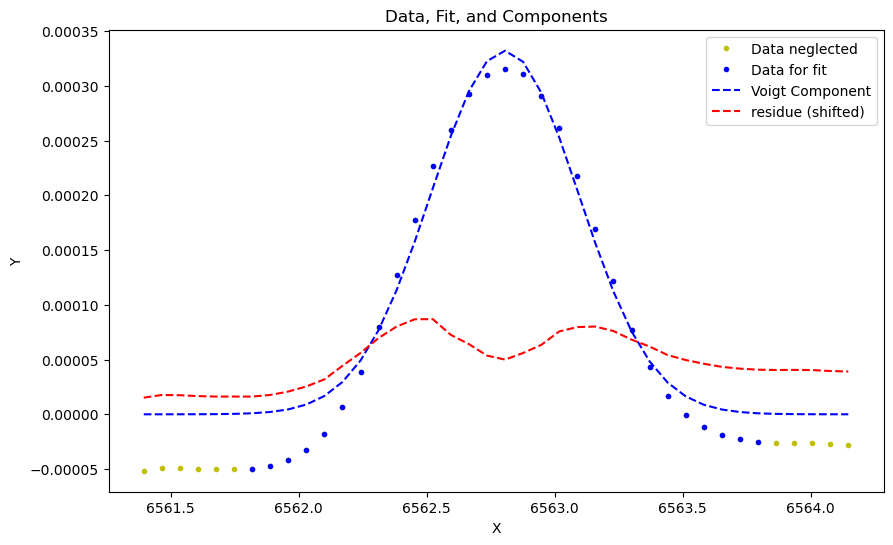

frame 250 at time 35.56666666666672 with param_fit[-1] = (array([3.51124033e-05, 6.56281132e+03, 3.32242084e-01, 1.12481836e-04]), array([3.15632803e-05, 1.64470290e-02, 1.60392663e-02, 4.57220061e+02])). Here comes the plot:


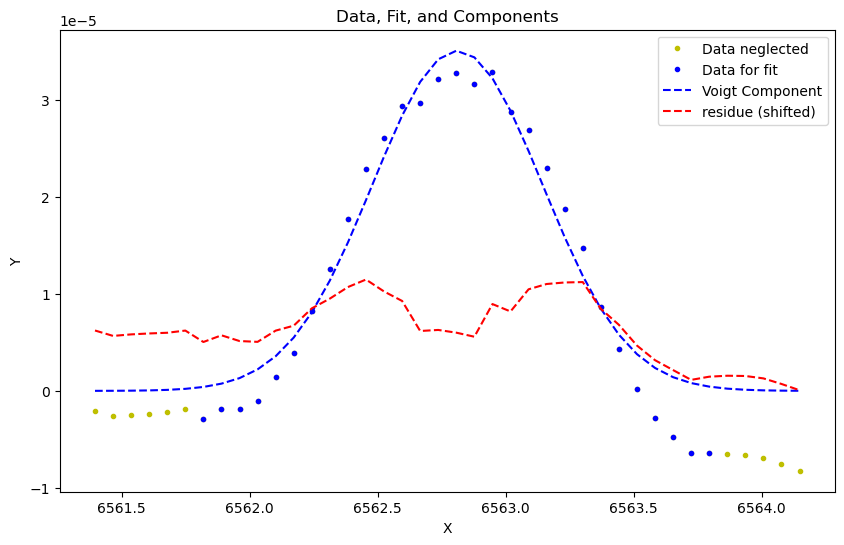

At frame 366 at time 49.66666666666674 the voigt fitting was not succesfull and average guess ([8.14419095e-02 6.56300740e+03 3.52037310e-01 8.28712755e-02]) is used as params and as std of params. 
frame 500 at time 66.0333333333333 with param_fit[-1] = (array([-6.27944047e-06,  6.56279952e+03,  3.13409142e-01, -4.12566135e-04]), array([7.21347702e-05, 1.41595678e-02, 1.42333566e-02, 1.37332462e+03])). Here comes the plot:


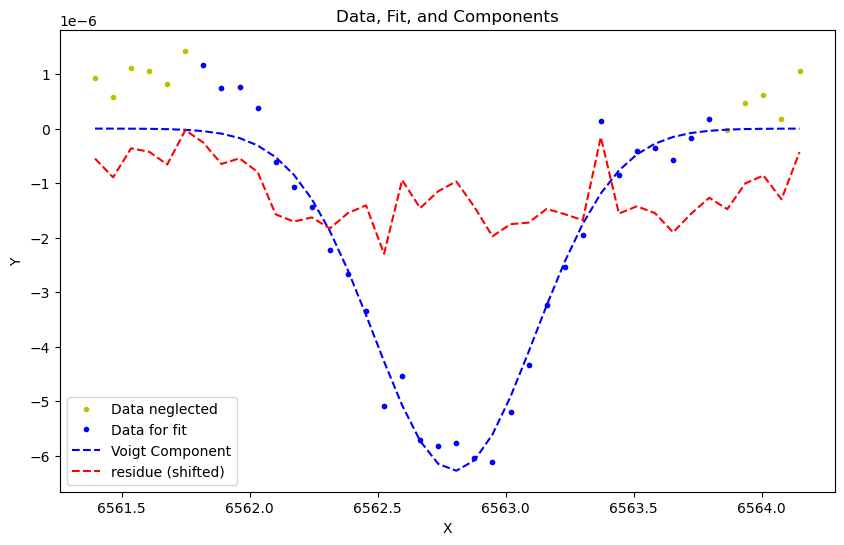

vmax = 3.0204155031878727e-05, vmin = -9.525835085157186e-05


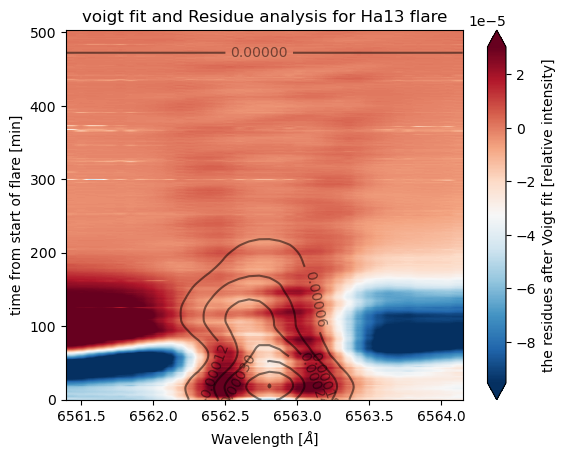

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [22]:
reload(un)
lines = ["Ha13"]
long_names = {"Ha13":r"H$\alpha$ 2013"}

data = un.load_for_further_analysis(lines)
print(data.keys())


initial_guesses = {'Ha':[5.55265545e-01*0.88, 6.56293638e+03, 5.29257897e-01, 4.96399919e-01]}
lnp=[[0,1,2,3,4,5,-5,-4,-3, -2, -1]]
make_full_analysis(data, lines, offsets=[0], plot_rate=250, init_guesses=initial_guesses, list_neglect_points=lnp)

# C2.2 flare 2019

In [ ]:
# Go see problematic voight fits! 


c1 = 0.6934060535332651
c2 = 0.7912546190700971
c3 = 0.12995492392730582

reload(un)
lines = ["CaIR19", "Fe6173_2019", "CaK19"]
offsets = [0.0, 0.0, 0.0]
long_names = {"Fe6173_2019":r"Fe 6173", "CaK19":r'Ca$IIK$', "CaIR19":r'Ca$II 8542 \AA$'}

data = un.load_for_further_analysis(lines)
un2.disgard_cont_point("CaK19", data)

print(data.keys())

initial_guesses = {'Ha':[5.55265545e-01, 6.56293638e+03, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5*c3, 3933.675, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 2.40164464e-01,  8.54196662e+03, -2.52162356e-01,  -1.92634373e-04],
                   "Fe6173":[4.13090273e-02*c2, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02]}
lnp=[[], [0,1,2,3,-9, -8, -7,-6,-5,-4,-3, -2, -1], []]

# i = 0
# l = lines[i]
# make_analysis( l, data, initial_guess=[ 2.40164464e-01,  8.54196662e+03, -2.52162356e-01,  -1.92634373e-04],
#               plot_rate=10, neglect_points=
# vf.exc_wings(-6, 4), fix_ind=[0,1,2,3])

dict_keys(['area_theta_CaIR19', 'FOV_CaIR19', 'quiet_sun_CaIR19', 'nessi_CaIR19', 'True_nessi_CaIR19', 'TIME_CaIR19', 'area_theta_Fe6173_2019', 'FOV_Fe6173_2019', 'quiet_sun_Fe6173_2019', 'nessi_Fe6173_2019', 'True_nessi_Fe6173_2019', 'TIME_Fe6173_2019', 'area_theta_CaK19', 'FOV_CaK19', 'quiet_sun_CaK19', 'nessi_CaK19', 'True_nessi_CaK19', 'TIME_CaK19'])


The average is 1.0000055574980218
frame 0 at time -7.0 with param_fit[-1] = (array([-6.86677335e-01,  5.76514045e+03,  3.58947195e-03,  6.58270973e-01]), array([22256631.98762232,   138444.3085015 ,   153101.79292579,
       10667546.1111673 ])). Here comes the plot:


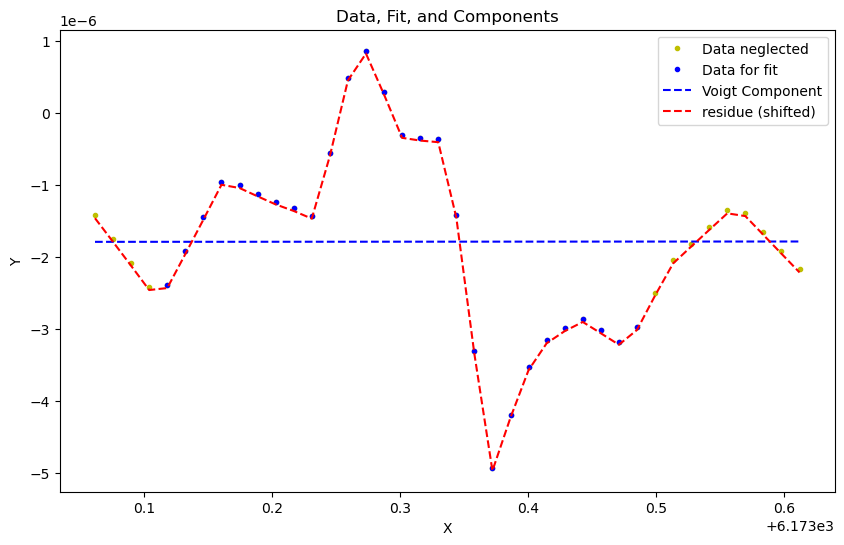

frame 50 at time 10.450000000000045 with param_fit[-1] = (array([-1.20877071e+12, -1.30860326e+17, -8.95591177e+15,  3.34311739e-02]), array([inf, inf, inf, inf])). Here comes the plot:


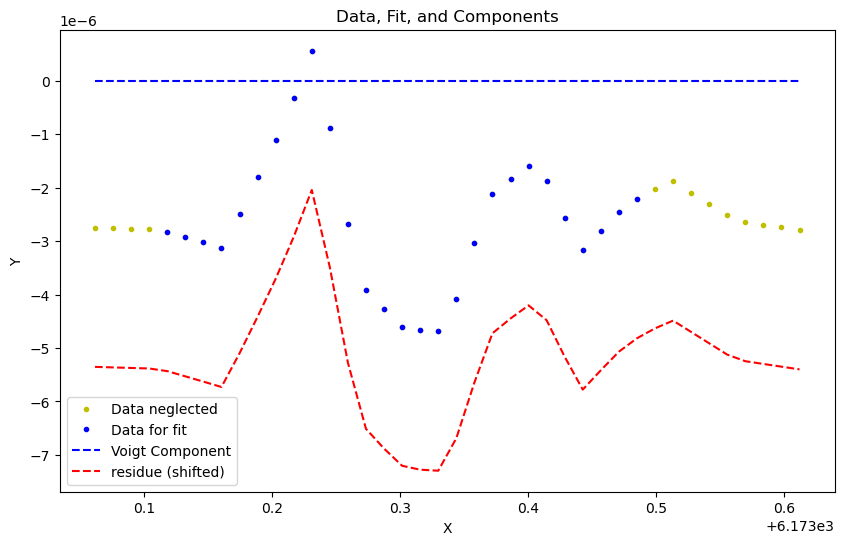

frame 100 at time 27.90000000000009 with param_fit[-1] = (array([-6.13658562e+10, -6.64338264e+15, -4.54663122e+14,  4.21323205e-02]), array([inf, inf, inf, inf])). Here comes the plot:


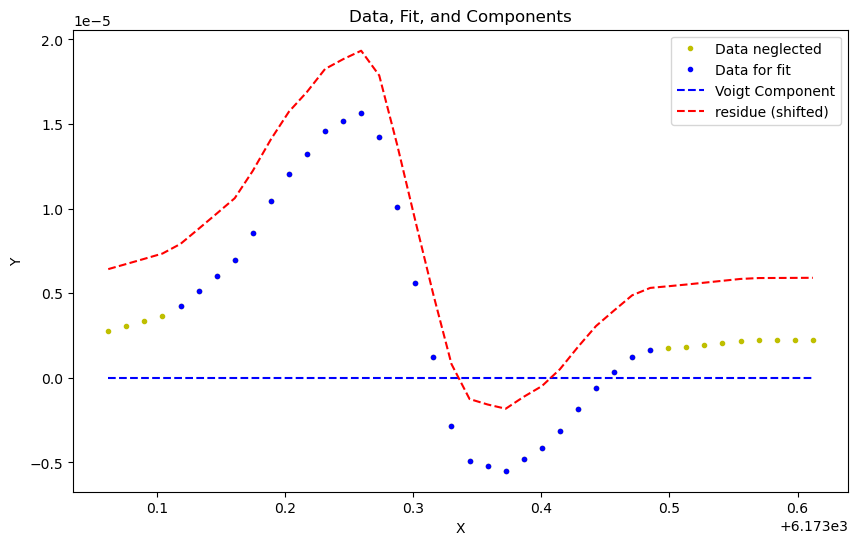

frame 150 at time 45.33333333333337 with param_fit[-1] = (array([-3.11833879e+09, -3.37587040e+14, -2.31039496e+13,  4.25744740e-02]), array([inf, inf, inf, inf])). Here comes the plot:


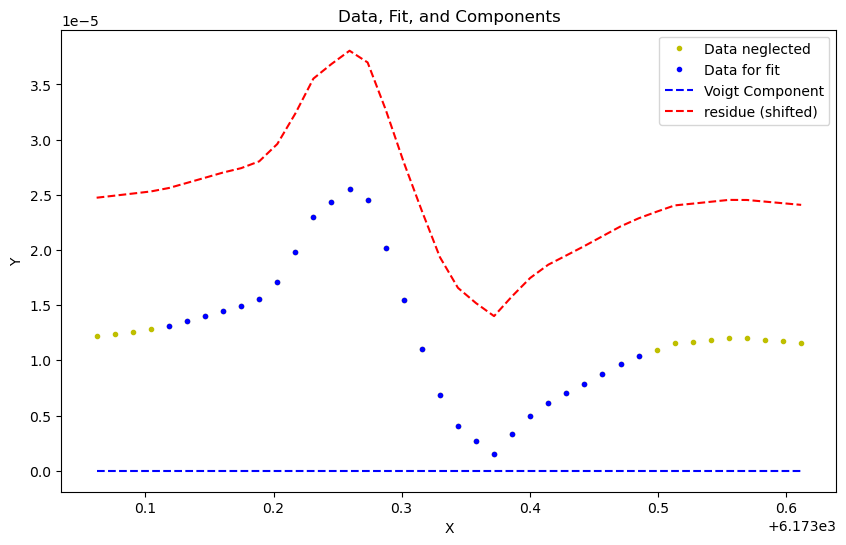

vmax = 2.1366505342308436e-05, vmin = -9.693112788020333e-06


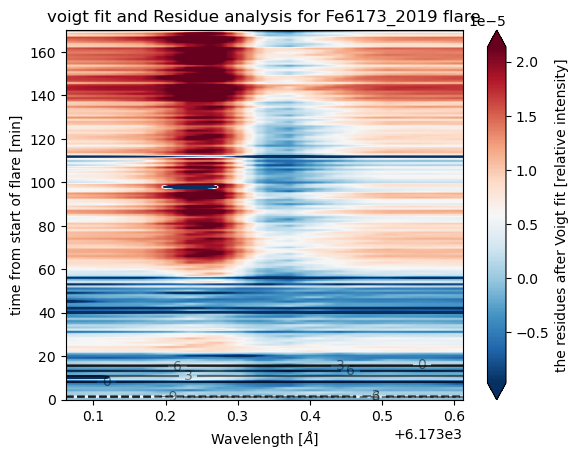

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [30]:
l = "Fe6173_2019"
make_analysis( l, data, initial_guess=[4.13090273e-02*c2, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
              plot_rate=50, neglect_points=vf.exc_wings(3,-9))

The average is 1.000055259888226
frame 0 at time -7.0 with param_fit[-1] = (array([-1.98660506e-05,  3.93391979e+03,  7.82658090e-02, -4.85612154e-04]), array([5.69483677e-02, 4.09838786e-02, 6.63271901e-02, 1.22591513e+04])). Here comes the plot:


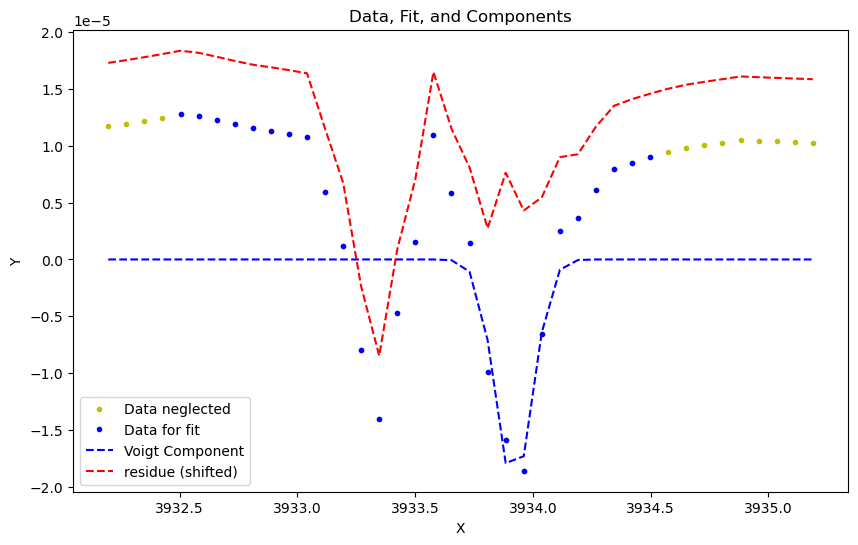

At frame 2 at time -6.7333333333333485 the voigt fitting was not succesfull and average guess ([ 1.94914784e-01  3.93381439e+03 -9.65347550e-02  1.38354543e-01]) is used as params and as std of params. 
At frame 15 at time -5.033333333333417 the voigt fitting was not succesfull and average guess ([ 9.74799601e-02  3.93349652e+03 -1.48207237e-01  1.19744535e-01]) is used as params and as std of params. 
At frame 17 at time -4.7666666666666515 the voigt fitting was not succesfull and average guess ([ 9.74907957e-02  3.93354704e+03 -2.59163704e-01  9.59997884e-01]) is used as params and as std of params. 
At frame 279 at time 29.449999999999932 the voigt fitting was not succesfull and average guess ([ 9.74083552e-02  3.93330015e+03 -1.30172540e-01 -2.96197732e-01]) is used as params and as std of params. 
At frame 362 at time 40.2833333333333 the voigt fitting was not succesfull and average guess ([ 9.73805879e-02  3.93375670e+03 -1.07700408e-01  5.91693831e-04]) is used as params and as 

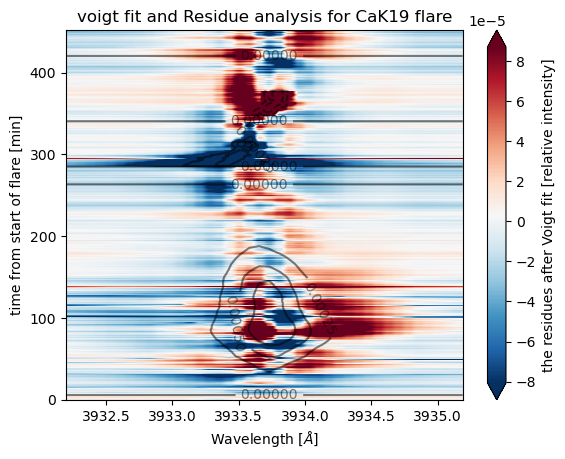

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [31]:
l = "CaK19"
reload(vf)
vf.make_analysis(l, data, initial_guess=[4.5*c3, 3933.675, -2.66732183e-01, 2.2284e-1],
              plot_rate=500, neglect_points=vf.exc_wings(3,-9))
# Done!

# C5.6

In [13]:
reload(un)
lines = ["CaIR15", "Ha15"]
offsets = [0,0,0]

data = un.load_for_further_analysis(lines)

print(data.keys())

initial_guesses = {'Ha':[4*10**-5, 6.56287638e+03, 2.29257897e-01, 1.96399919e-01], 
                   "CaK":[4.5, 3933.675, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[0.12,  8542.1, -2.62017731e-01,  4.46885934e-04],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02]}
lnp=[[0,1,2,3,4,5,6,7,8,9,-9,-8,-7,-6, -5,-4,-3,-2,-1], [0,1,2,3,4,-5,-4,-3,-2,-1], []]

# make_full_analysis(data, lines, offsets=offsets, init_guesses=initial_guesses, plot_rate=250, list_neglect_points=lnp)



dict_keys(['area_theta_CaIR15', 'FOV_CaIR15', 'quiet_sun_CaIR15', 'nessi_CaIR15', 'True_nessi_CaIR15', 'TIME_CaIR15', 'area_theta_Ha15', 'FOV_Ha15', 'quiet_sun_Ha15', 'nessi_Ha15', 'True_nessi_Ha15', 'TIME_Ha15'])


Test of contrast profile and associated curves of CaIR15


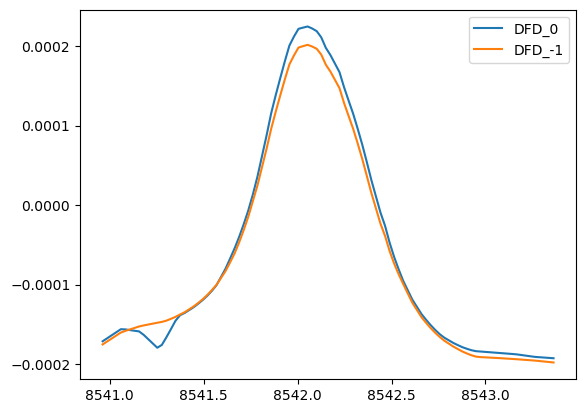

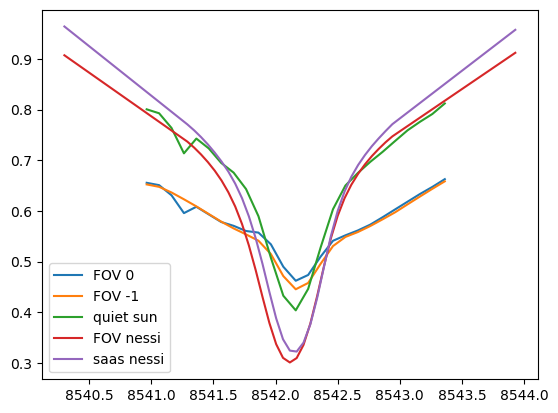

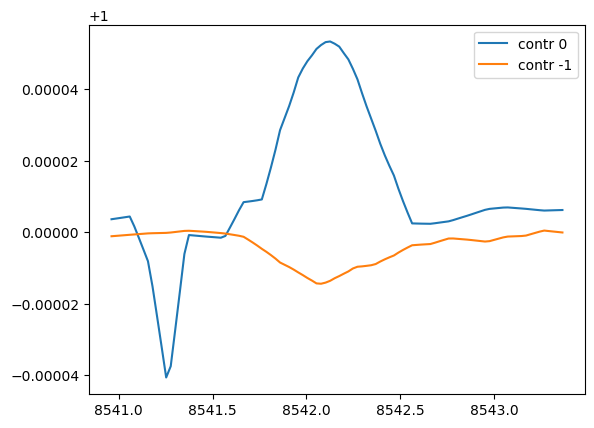

In [14]:
un2.test_contrast(data, "CaIR15")

The average is 1.0000129011770336
frame 0 at time -23.4 with param_fit[-1] = (array([5.56640569e-05, 8.54218268e+03, 6.42537706e-01, 3.98445960e-01]), array([7.46572855e-06, 6.61654876e-02, 1.47527646e-01, 1.76261870e+00])). Here comes the plot:


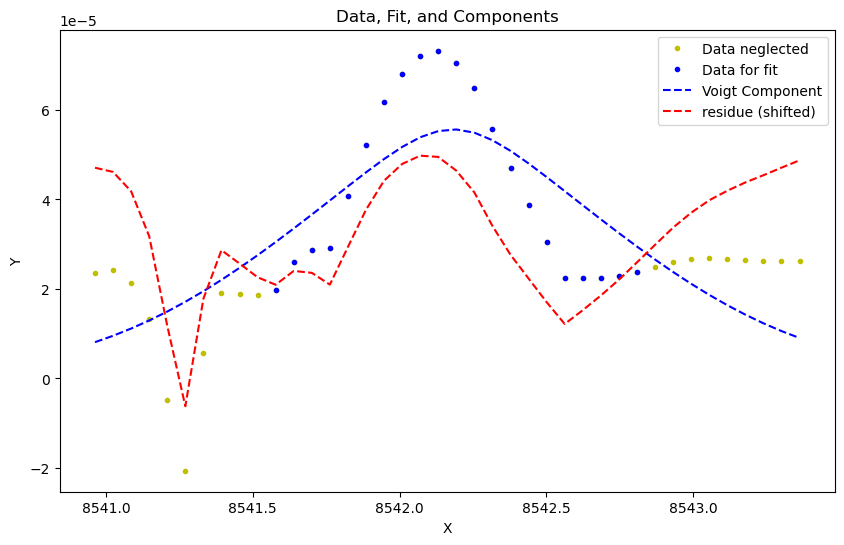

At frame 418 at time 72.01666666666662 the voigt fitting was not succesfull and average guess ([ 2.18460056e-04  8.54211617e+03  1.95187704e-01 -6.98814334e-01]) is used as params and as std of params. 
At frame 422 at time 72.93333333333337 the voigt fitting was not succesfull and average guess ([ 2.15374590e-04  8.54218098e+03  3.58716225e-02 -1.65832076e-01]) is used as params and as std of params. 
At frame 423 at time 73.1666666666666 the voigt fitting was not succesfull and average guess ([ 2.13827952e-04  8.54219751e+03 -4.29121489e-01 -5.49306646e-02]) is used as params and as std of params. 
At frame 424 at time 73.3833333333333 the voigt fitting was not succesfull and average guess ([ 2.12281315e-04  8.54221403e+03 -8.94114600e-01  5.59707467e-02]) is used as params and as std of params. 
At frame 440 at time 77.03333333333327 the voigt fitting was not succesfull and average guess ([ 2.15068072e-04  8.54207603e+03 -8.01621109e-01 -5.57219765e-02]) is used as params and as std

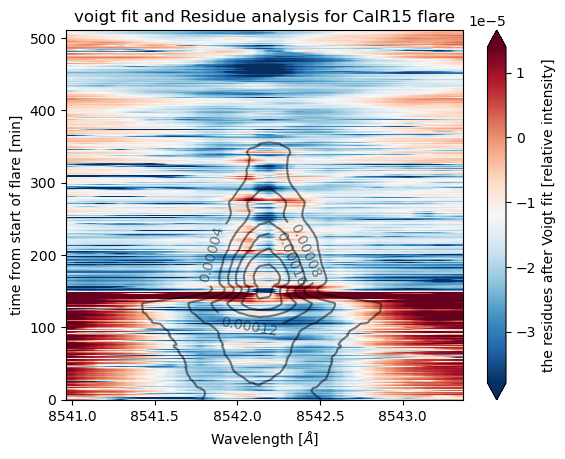

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [34]:
l = "CaIR15"
vf.make_analysis(l, data, initial_guess=[ 1.16355577e-03,  8.54213207e+03,  2.03198317e-01, -2.19101476e-04],
              plot_rate=5000, neglect_points=vf.exc_wings(9,-9), offset=2*10**-5)
# Done!

The average is 0.9999991358019266
frame 0 at time -23.4 with param_fit[-1] = (array([ 1.60544648e-05,  6.56245457e+03, -2.21646164e-01, -4.75998752e-02]), array([7.41795369e-06, 7.22967167e-02, 9.40816549e-02, 5.19011094e-01])). Here comes the plot:


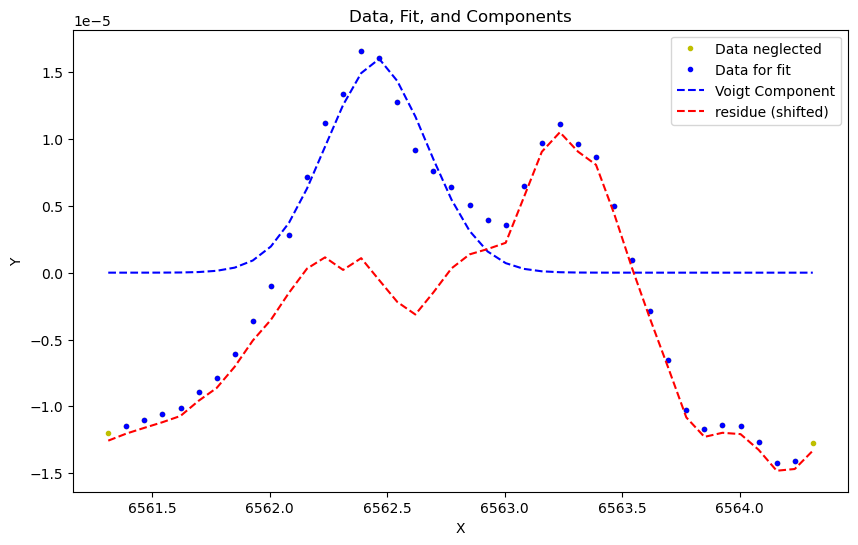

At frame 36 at time -15.183333333333415 the voigt fitting was not succesfull and average guess ([1.59058214e-05 6.56285295e+03 4.37026137e-01 3.27807197e-02]) is used as params and as std of params. 
frame 50 at time -11.98333333333337 with param_fit[-1] = (array([ 2.61358257e-05,  6.56265686e+03,  4.12326632e-01, -5.59998799e-05]), array([1.98820654e-03, 3.51316536e-02, 3.45335039e-02, 9.58151327e+03])). Here comes the plot:


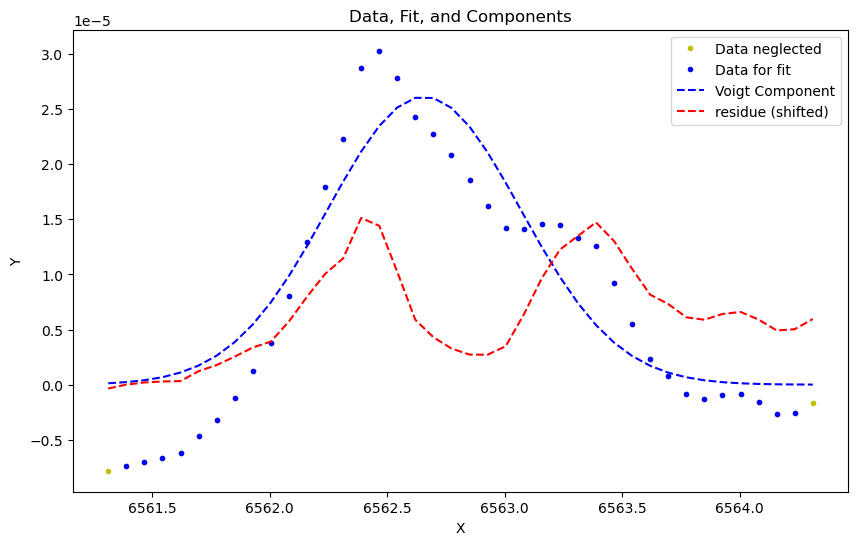

frame 100 at time -0.566666666666741 with param_fit[-1] = (array([ 2.56482098e-05,  6.56288610e+03,  5.94488312e-01, -3.30436417e-04]), array([1.58165846e-04, 4.68718191e-02, 4.78955481e-02, 3.29916302e+03])). Here comes the plot:


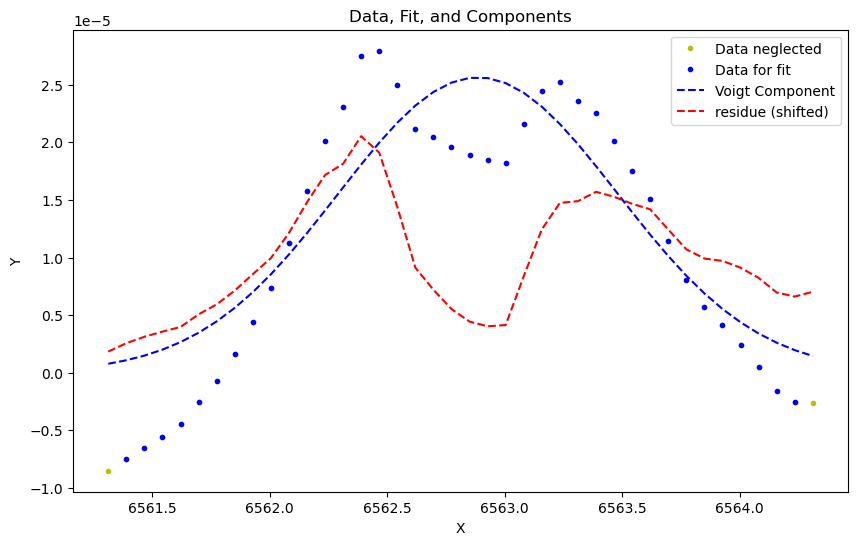

frame 150 at time 10.83333333333335 with param_fit[-1] = (array([1.34369047e-04, 6.56285319e+03, 3.30748715e-01, 1.09914772e-04]), array([8.66295926e-05, 8.59143951e-03, 8.72295508e-03, 3.13244517e+02])). Here comes the plot:


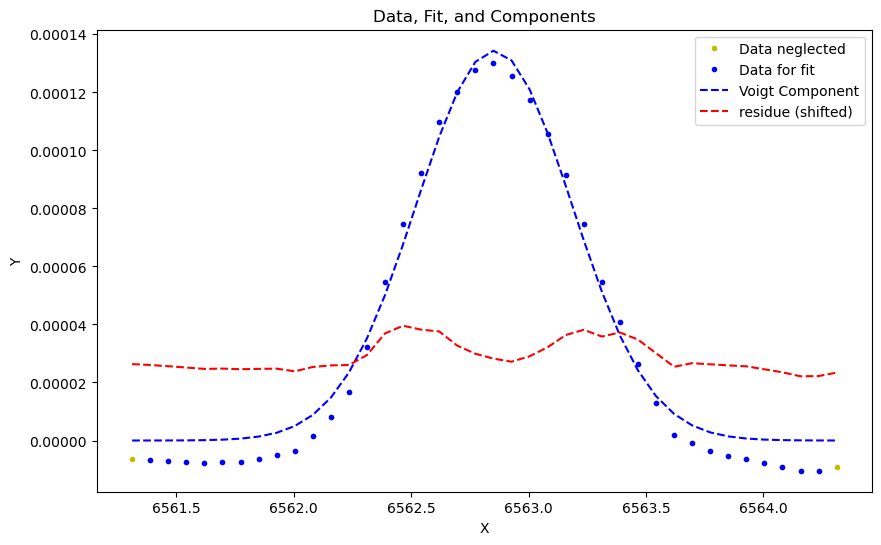

frame 200 at time 22.24999999999998 with param_fit[-1] = (array([1.16106296e-04, 6.56285057e+03, 3.00355176e-01, 4.93979278e-05]), array([1.69313515e-05, 8.79970583e-03, 9.09351164e-03, 1.61656507e+02])). Here comes the plot:


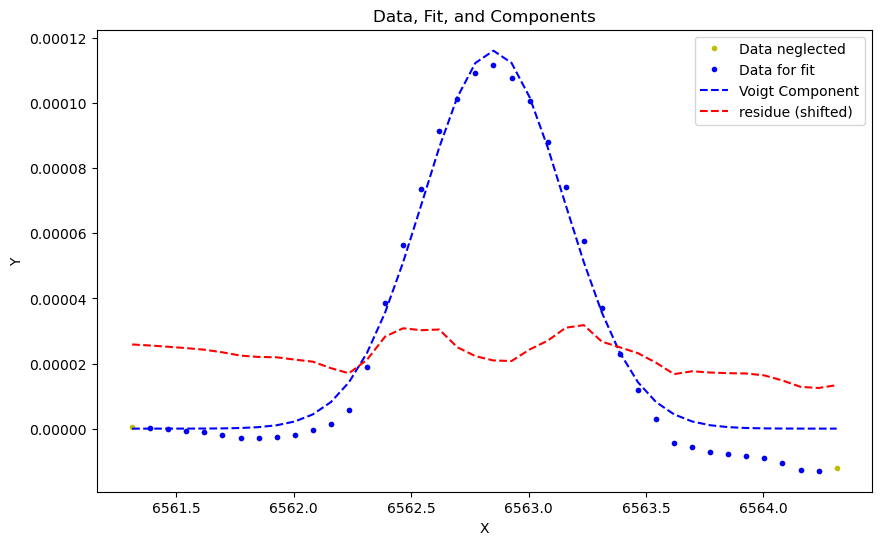

frame 250 at time 33.66666666666661 with param_fit[-1] = (array([ 6.04212631e-05,  6.56286069e+03,  3.02745627e-01, -1.31277569e-04]), array([9.36904834e-05, 1.17170485e-02, 1.15209751e-02, 5.33706777e+02])). Here comes the plot:


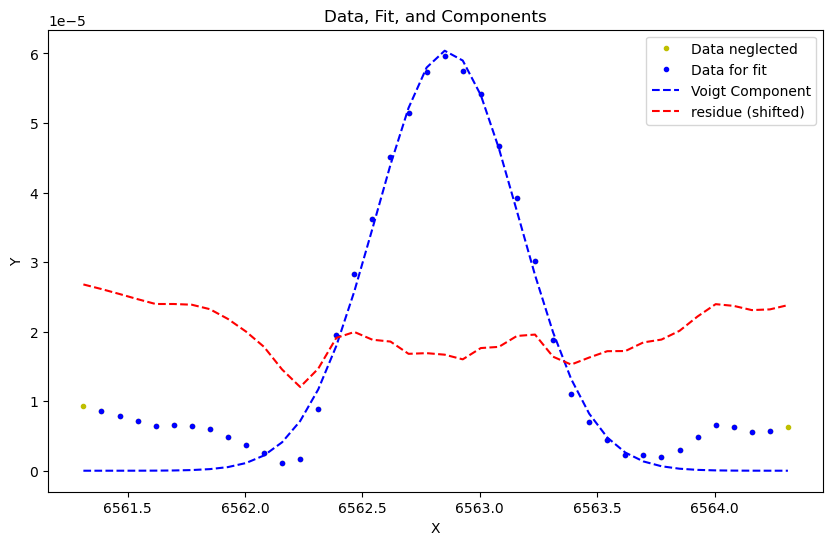

frame 300 at time 45.08333333333335 with param_fit[-1] = (array([ 7.65807533e-05,  6.56279212e+03,  2.96311640e-01, -3.56536075e-01]), array([2.63071424e-06, 1.18390737e-02, 3.85189151e-02, 2.77260970e-02])). Here comes the plot:


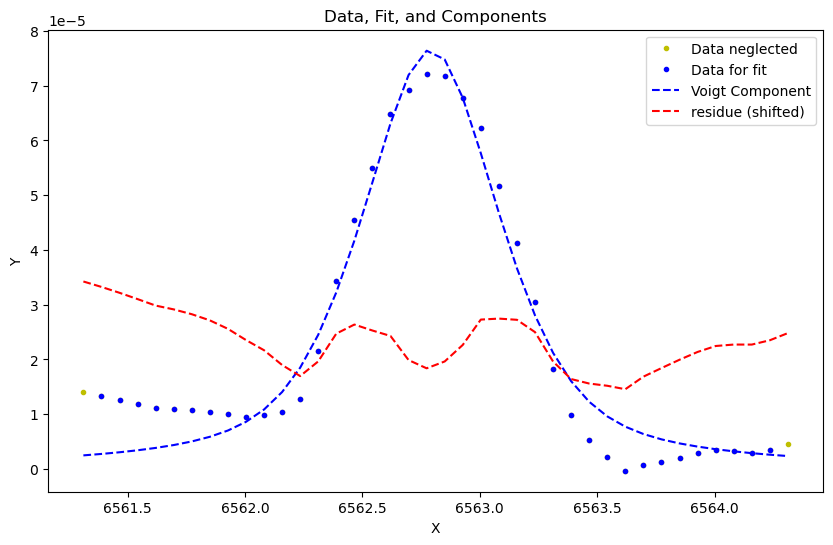

frame 350 at time 56.49999999999998 with param_fit[-1] = (array([5.30393735e-05, 6.56278078e+03, 2.11849042e-01, 4.85068192e-01]), array([4.41318001e-06, 2.90251218e-02, 1.99999887e-01, 8.18833993e-02])). Here comes the plot:


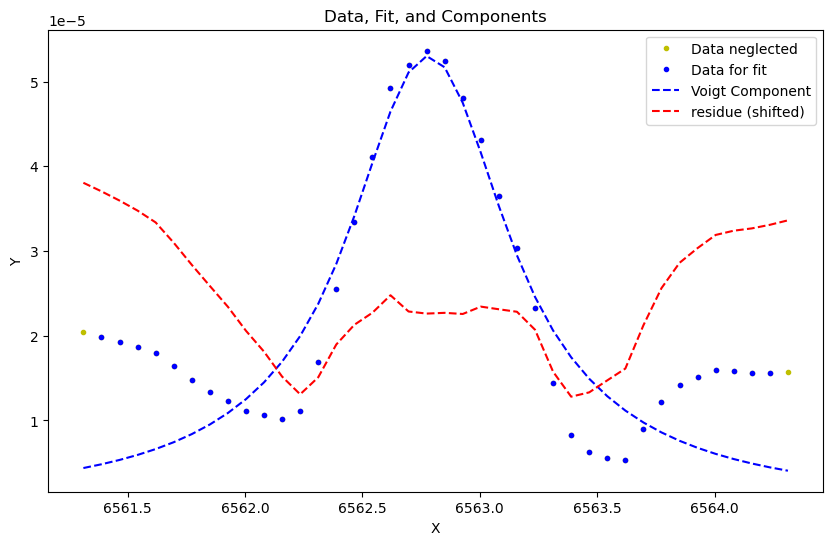

At frame 362 at time 59.23333333333333 the voigt fitting was not succesfull and average guess ([2.24378659e-05 6.56196467e+03 5.11323479e-01 1.99377951e+00]) is used as params and as std of params. 
At frame 366 at time 60.149999999999956 the voigt fitting was not succesfull and average guess ([2.29493931e-05 6.56125157e+03 2.66584963e+00 4.52592521e+00]) is used as params and as std of params. 
At frame 367 at time 60.36666666666665 the voigt fitting was not succesfull and average guess ([2.35863478e-05 6.56173521e+03 1.66764395e+00 3.38479293e+00]) is used as params and as std of params. 
At frame 368 at time 60.6 the voigt fitting was not succesfull and average guess ([2.42233025e-05 6.56221884e+03 6.69438271e-01 2.24366066e+00]) is used as params and as std of params. 
At frame 369 at time 60.83333333333335 the voigt fitting was not succesfull and average guess ([2.46197821e-05 6.56237002e+03 2.12718173e-01 1.91083800e+00]) is used as params and as std of params. 
At frame 370 at t

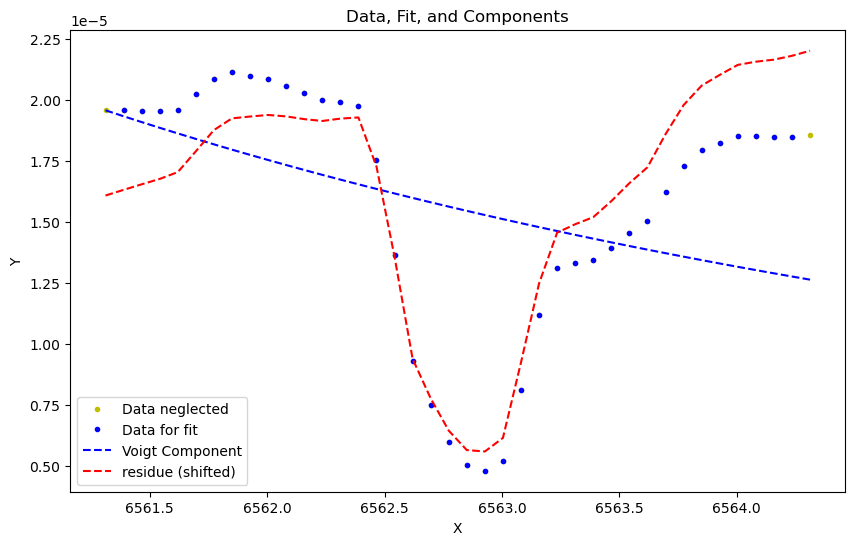

At frame 409 at time 69.96666666666667 the voigt fitting was not succesfull and average guess ([4.84306742e-02 6.50451553e+03 2.47004238e-02 8.59600576e-01]) is used as params and as std of params. 
At frame 414 at time 71.1 the voigt fitting was not succesfull and average guess ([3.15689525e-01 6.03714798e+03 1.88397175e-01 3.38658723e+00]) is used as params and as std of params. 
At frame 415 at time 71.33333333333334 the voigt fitting was not succesfull and average guess ([3.25881608e-01 6.03358623e+03 5.27680923e-01 3.44430115e+00]) is used as params and as std of params. 
At frame 416 at time 71.56666666666658 the voigt fitting was not succesfull and average guess ([3.57296393e-01 5.99430283e+03 1.01989217e+00 3.75921027e+00]) is used as params and as std of params. 
At frame 417 at time 71.78333333333327 the voigt fitting was not succesfull and average guess ([3.04199009e-01 6.12105911e+03 1.34105330e+00 3.24753700e+00]) is used as params and as std of params. 
At frame 418 at ti

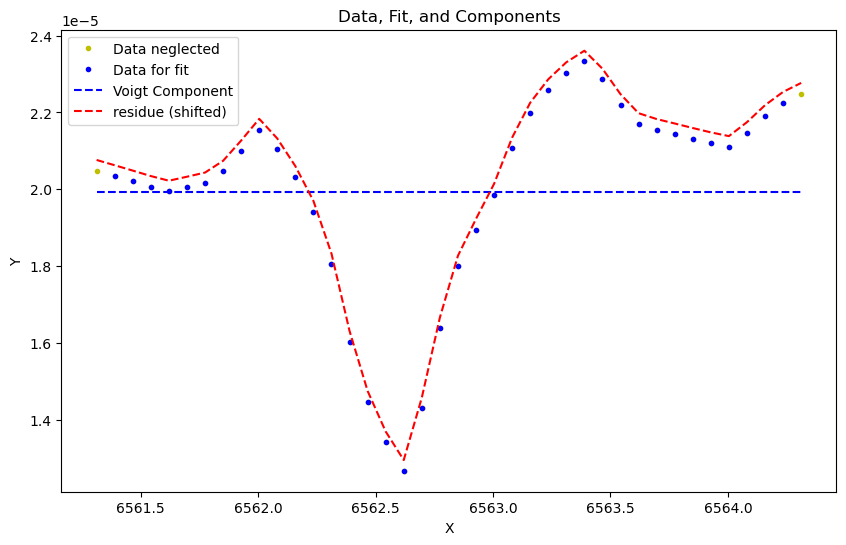

frame 500 at time 90.73333333333332 with param_fit[-1] = (array([ 2.49929004e+05,  1.76790716e+08, -6.00621345e+01,  1.70869264e+03]), array([1.96749888e+12, 3.65403509e+14, 3.87064206e+08, 6.26293214e+09])). Here comes the plot:


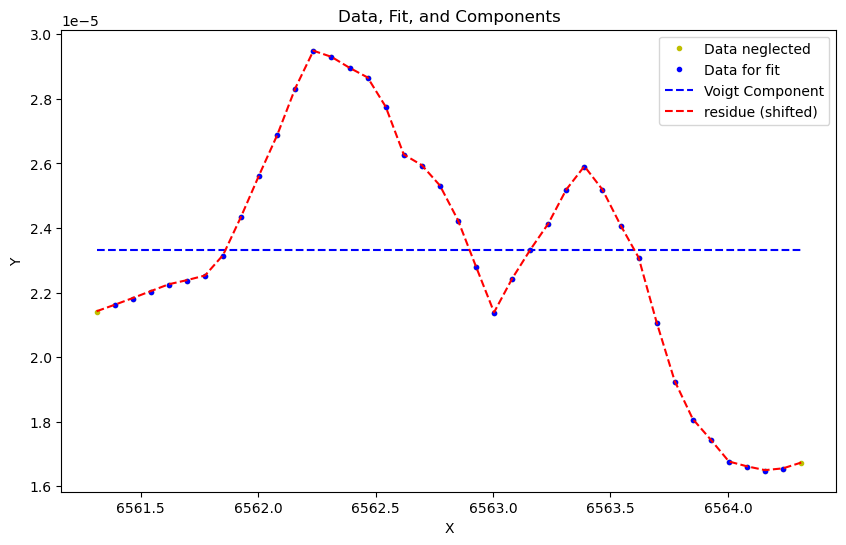

vmax = -4.805874489857494e-06, vmin = -0.0001514536267019463


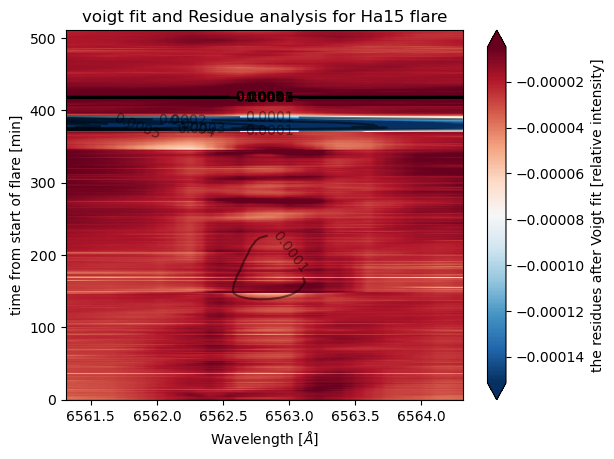

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [10]:
l = "Ha15"
vf.make_analysis(l, data, initial_guess=[4*10**-5, 6.56287638e+03, 2.29257897e-01, 1.96399919e-01],
              plot_rate=50, neglect_points=vf.exc_wings(0,-1), offset=2*10**-5)
# Done!

The average is 0.9999991358019266
frame 0 at time -23.4 with param_fit[-1] = (array([2.23979539e-05, 6.56271187e+03, 5.68641203e-01, 4.38024879e-05]), array([5.61341913e-04, 4.72032685e-02, 4.78148456e-02, 6.11419533e+03])). Here comes the plot:


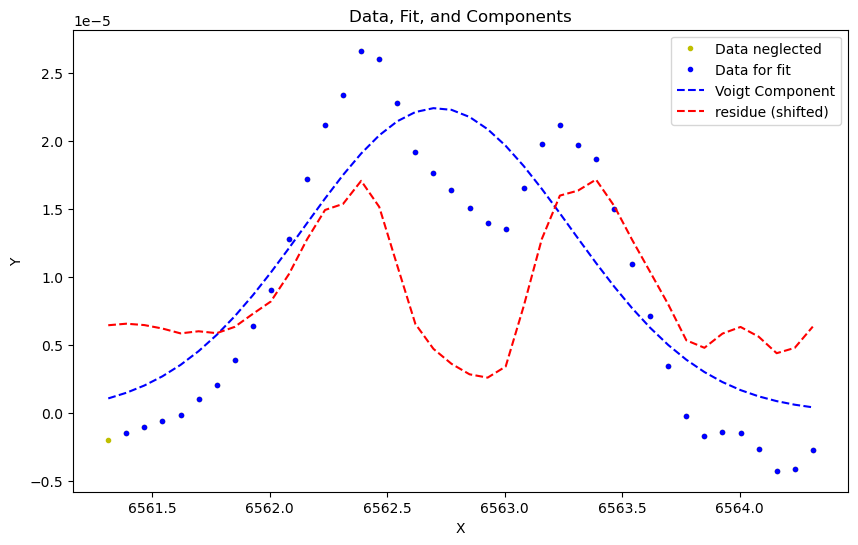

e:\solar flares\data\voigt_fitting\voigt_fit.py:42: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(voigt, x_data, y_data, p0=initial_guess)


At frame 36 at time -15.183333333333415 the voigt fitting was not succesfull and average guess ([2.47465130e-05 6.56286785e+03 6.37799954e-01 3.30465699e-02]) is used as params and as std of params. 
frame 50 at time -11.98333333333337 with param_fit[-1] = (array([ 3.36431659e-05,  6.56273416e+03,  6.39673587e-01, -1.44513836e-03]), array([1.55135141e-03, 3.26973881e-02, 3.17058568e-02, 8.62396155e+03])). Here comes the plot:


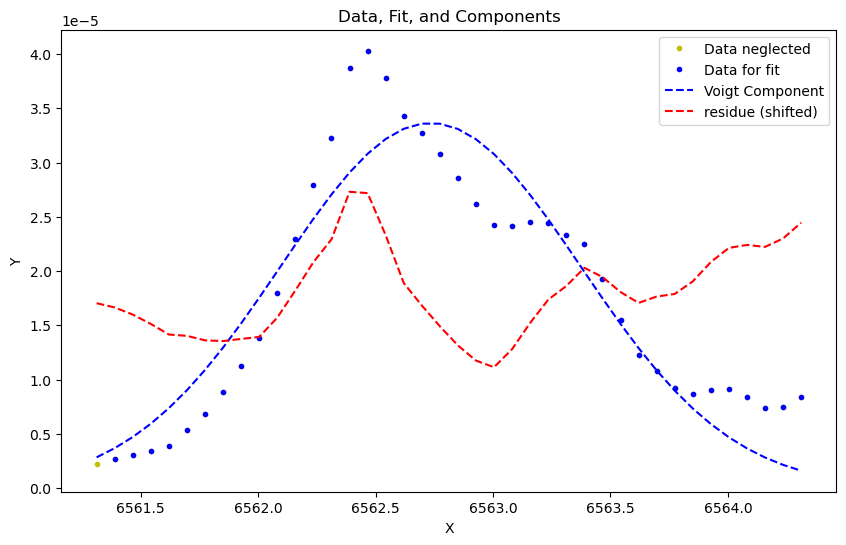

frame 100 at time -0.566666666666741 with param_fit[-1] = (array([3.06549617e-05, 6.56289193e+03, 6.82162960e-01, 3.52795406e-05]), array([5.09129149e-04, 3.53698299e-02, 3.79168800e-02, 5.44787826e+03])). Here comes the plot:


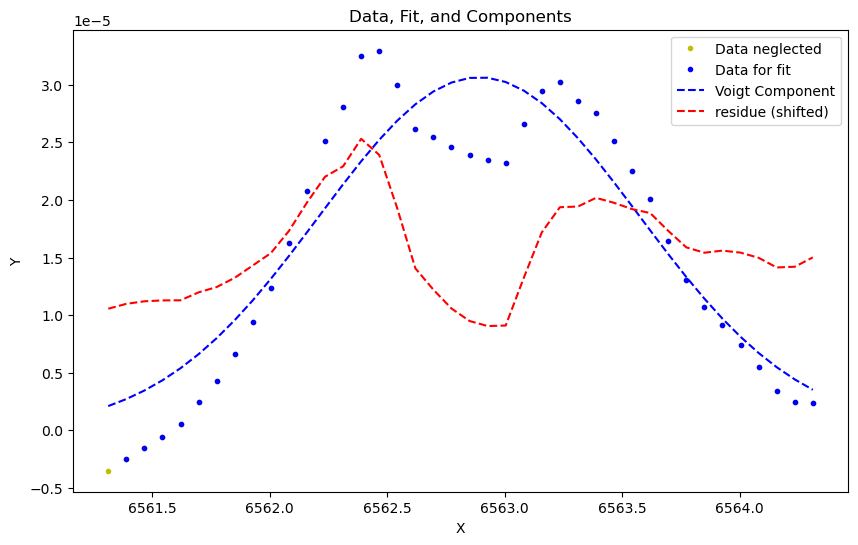

frame 150 at time 10.83333333333335 with param_fit[-1] = (array([1.38381102e-04, 6.56285377e+03, 3.45912830e-01, 2.48876864e-04]), array([3.36606066e-04, 5.09514030e-03, 5.10375209e-03, 5.87764891e+02])). Here comes the plot:


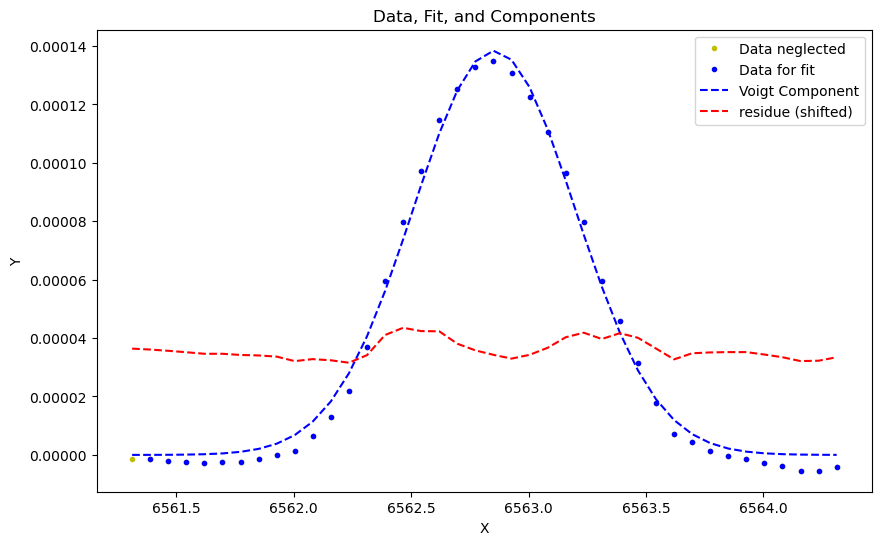

frame 200 at time 22.24999999999998 with param_fit[-1] = (array([ 1.20636420e-04,  6.56285795e+03,  3.31694149e-01, -2.04290091e-05]), array([9.95104710e-06, 1.28363929e-02, 1.31172395e-02, 1.19408693e+02])). Here comes the plot:


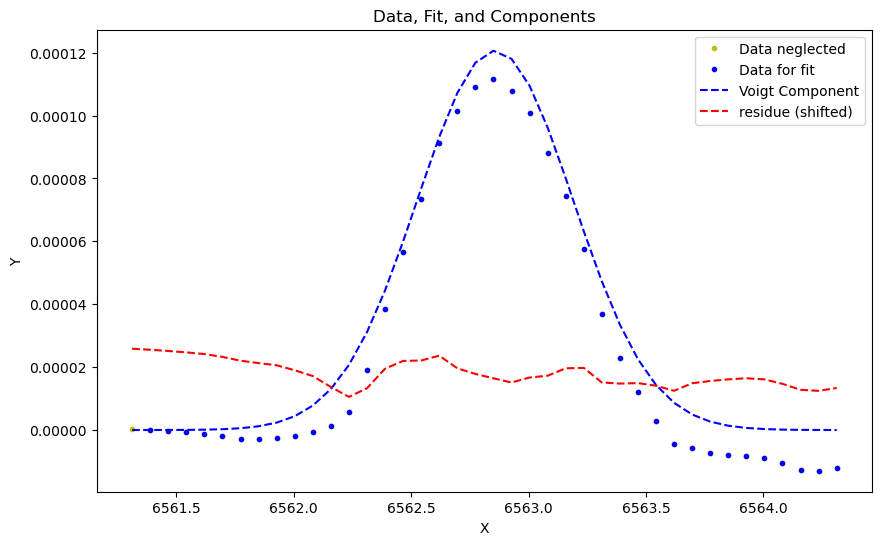

frame 250 at time 33.66666666666661 with param_fit[-1] = (array([ 6.04212518e-05,  6.56286069e+03,  3.02746985e-01, -1.31318602e-04]), array([1.17353491e-04, 1.17712695e-02, 1.23632702e-02, 6.85809265e+02])). Here comes the plot:


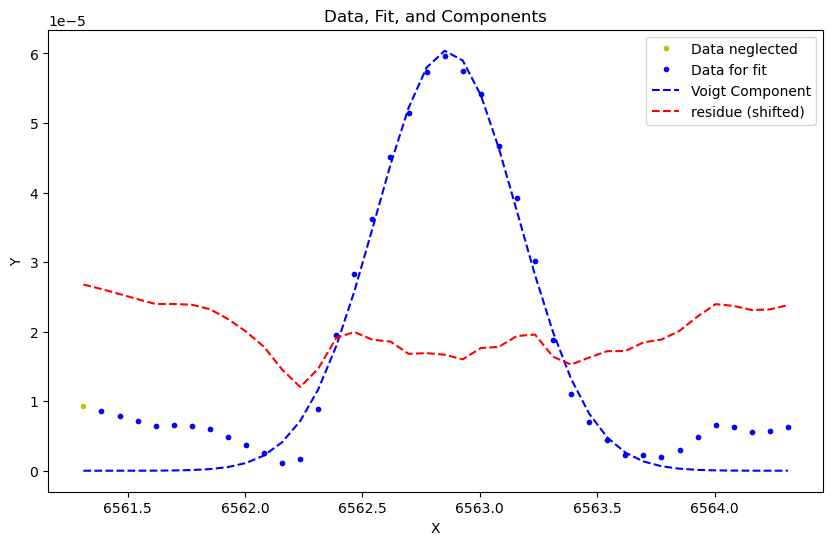

frame 300 at time 45.08333333333335 with param_fit[-1] = (array([7.38210959e-05, 6.56279285e+03, 3.24563393e-01, 6.43796171e-04]), array([9.31280857e-05, 1.35569683e-02, 1.34088296e-02, 6.71566281e+02])). Here comes the plot:


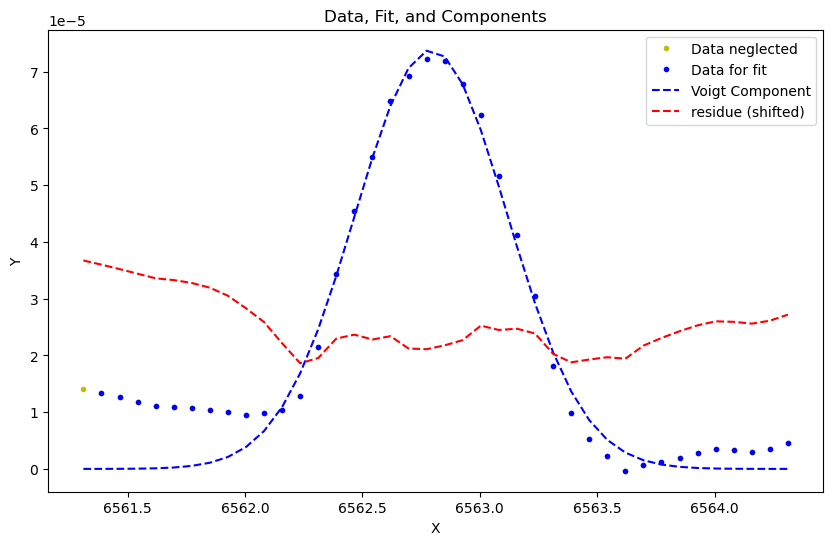

vmax = -6.534625811995466e-06, vmin = -3.8299285858680856e-05


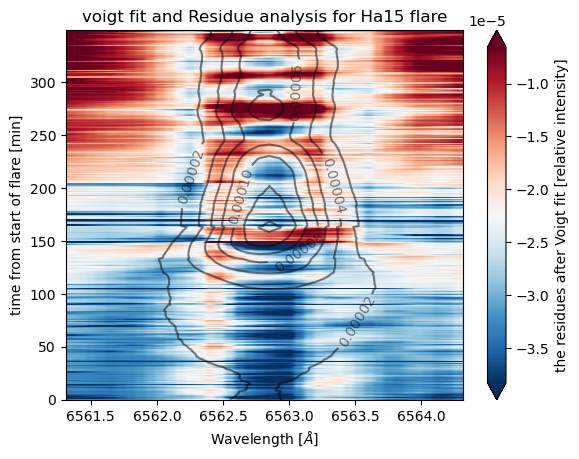

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 0.9999991358019266
frame 350 at time 56.49999999999998 with param_fit[-1] = (array([4.55100962e-05, 6.56278718e+03, 2.62948180e-01, 1.40186477e-04]), array([5.89617926e-06, 1.20550597e-02, 1.12271245e-02, 1.84206098e+02])). Here comes the plot:


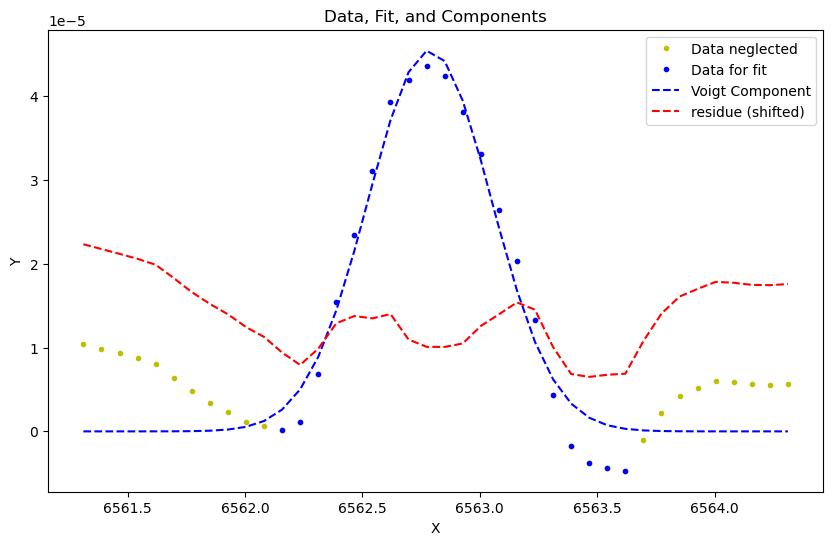

frame 400 at time 67.89999999999995 with param_fit[-1] = (array([-1.54903368e-05,  6.56293032e+03, -3.26283174e-01,  2.46435987e-01]), array([1.15525132e-06, 2.35358894e-02, 6.85008712e-02, 3.53808282e-01])). Here comes the plot:


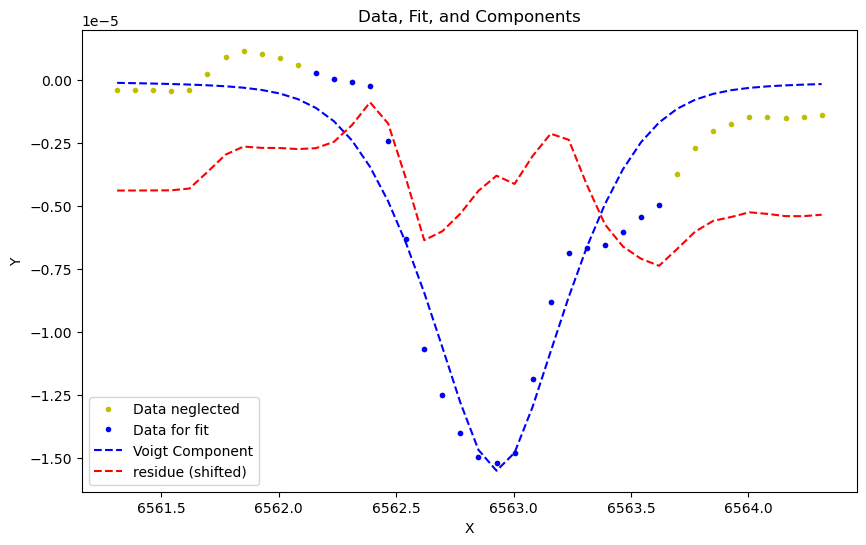

frame 450 at time 79.31666666666658 with param_fit[-1] = (array([3.43409873e-06, 6.56337986e+03, 1.73706940e-01, 7.07425934e-04]), array([1.29868617e-03, 1.33122899e-01, 1.45556157e-01, 2.41146745e+04])). Here comes the plot:


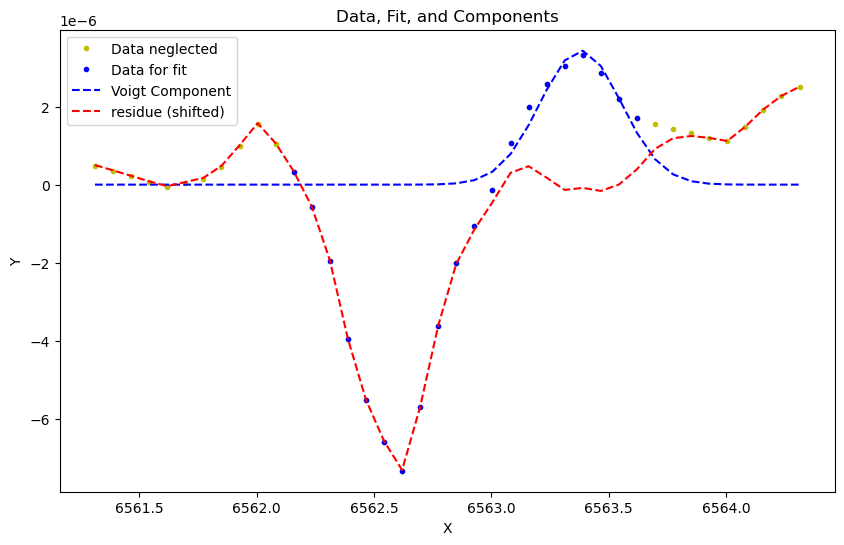

At frame 478 at time 85.71666666666667 the voigt fitting was not succesfull and average guess ([ 1.01914030e-05  6.56314924e+03  1.08387042e-01 -1.15891811e-01]) is used as params and as std of params. 
frame 500 at time 90.73333333333332 with param_fit[-1] = (array([-6.93706213e-06,  6.56316202e+03,  4.64964207e-01,  3.68567031e-04]), array([3.97218103e-05, 5.56329366e-02, 5.76523833e-02, 2.69097899e+03])). Here comes the plot:


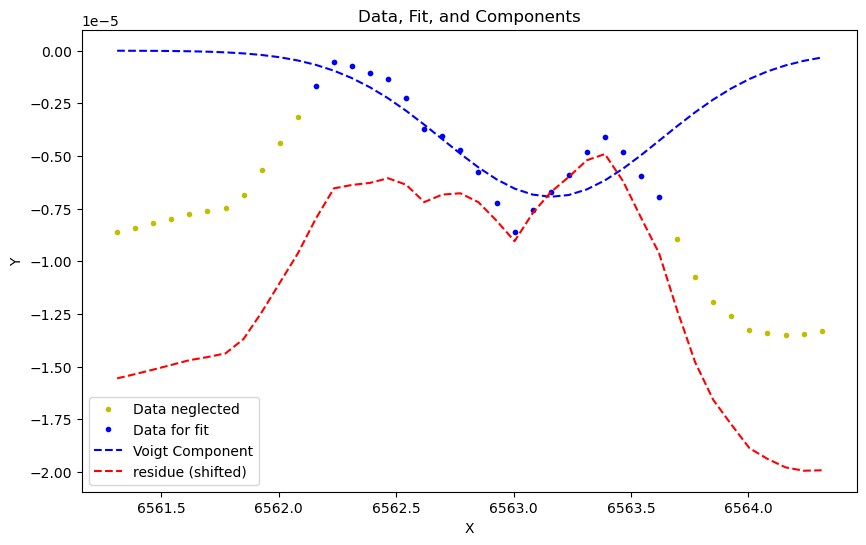

vmax = 6.89154226038428e-06, vmin = -1.3035107858258262e-05


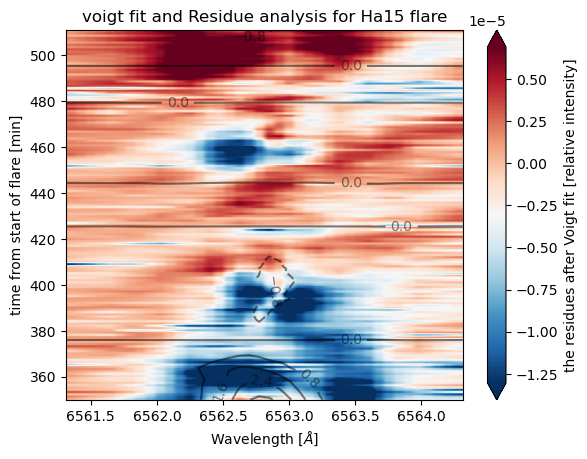

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [15]:
l = "Ha15"
# vf.make_analysis(l, data, initial_guess=[4*10**-5, 6.56287638e+03, 2.29257897e-01, 1.96399919e-01],
#               plot_rate=50, neglect_points=vf.exc_wings(0,-1), offset=2*10**-5)
# Done!


initial_guess=[[0,  [ 4*10**-5, 6.56287638e+03, 2.29257897e-01, 1.96399919e-01]],
               [100,  [2.56482098e-05,  6.56288610e+03,   4.25056259e-01, 3.64487290e-01]],
               [200,  [1.16106296e-04, 6.56285057e+03, 3.00355176e-01, 4.93979278e-05]],
               [230,  [1.16106296e-05, 6.56285057e+03, 3.00355176e-01, 4.93979278e-05]],
               [300,  [7.65807533e-05,  6.56279212e+03,  2.96311640e-01, -3.56536075e-01]]
              ]

offsets= [[0, 3*10**-5],
          [100, 2.5*10**-5],
          [200, 2e-5], 
          [350, 1e-5], 
          [380, 0], 
          [500, -1e-5]
          ]

exf = [] #np.arange(315,375,1)



# k= 500
# vf.make_analysis(l, data, initial_guess=initial_guess,
#               plot_rate=10, neglect_points=vf.exc_wings(10,-9), offset=offsets,  exclude_frames=exf, frame_range=range(0+k,100+k) )
# Done!
vf.make_analysis(l, data, initial_guess=initial_guess,
              plot_rate=50, neglect_points=vf.exc_wings(0,-0), offset=offsets, exclude_frames=exf, frame_range=range(0,350))
vf.make_analysis(l, data, initial_guess=initial_guess,
              plot_rate=50, neglect_points=vf.exc_wings(10,-9), offset=offsets, exclude_frames=exf, frame_range=range(350,650))
# Done!

# please go run the file "problematic_voight_fits.ipynb" such that none of the fits are destroyed by this file ;)